In [ ]:
#!/usr/bin/env python3
"""
compare_iperf3.py  —  Parse any number of iperf3 server-side UDP logs and plot:
                       1. Per-file summary bar charts (throughput, jitter, loss %)
                       2. Time-series lines per file + their average

Usage:
    python compare_iperf3.py                        # uses FILES list below
    python compare_iperf3.py f1.txt f2.txt f3.txt  # or pass files as arguments

Requirements:
    pip install matplotlib numpy
"""

import re
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ---------------------------------------------------------------------------
# >>>  SET YOUR FILES HERE (used when no command-line arguments are given)  <<<
# ---------------------------------------------------------------------------
FILES = [
    "./logs/capture_test10_qos_h3_to_h38_MTD.txt",
    "./logs/capture_test10_qos_h39_to_h2_MTD.txt",
    "./logs/capture_test10_qos_h3_to_h38_no_MTD.txt",
    "./logs/capture_test10_qos_h39_to_h2_no_MTD.txt",
]

# Optional: set custom short labels. If fewer labels than files, auto-fills.
LABELS = ["h3_mtd","h39_mtd", "h3_no_mtd", "h39_no_mtd"]   # e.g. ["Living Room", "Bedroom", "Office", "Garage"]

# ---------------------------------------------------------------------------
# Color palette — cycles automatically for any number of files
# ---------------------------------------------------------------------------
PALETTE = [
    "#378ADD", "#1D9E75", "#E24B4A", "#EF9F27",
    "#5348b7", "#D4537E", "#639922", "#0F6E56",
    "#BA7517", "#A32D2D", "#3C3489", "#085041",
]

# ---------------------------------------------------------------------------
# Parse
# ---------------------------------------------------------------------------

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+(\w+)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(-?\d+)/(\d+)"
)

SUMMARY_RE = re.compile(
    r"\[\s*\d+\]\s+0\.00-[\d.]+\s+sec\s+.*?"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)\s+receiver"
)


def parse_file(path):
    times, bitrates, jitters, losses = [], [], [], []
    summary = {}

    with open(path) as f:
        text = f.read()

    m = SUMMARY_RE.search(text)
    if m:
        summary = {
            "jitter_ms": float(m.group(1)),
            "lost":      int(m.group(2)),
            "total":     int(m.group(3)),
            "loss_pct":  float(m.group(4)),
        }

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue
        t_start, t_end = float(m.group(1)), float(m.group(2))
        if t_end - t_start > 10:
            continue

        bitrate = float(m.group(3))
        unit    = m.group(4)
        jitter  = float(m.group(5))
        lost    = int(m.group(6))

        if unit == "K":
            bitrate /= 1000.0

        times.append((t_start + t_end) / 2)
        bitrates.append(bitrate)
        jitters.append(jitter)
        losses.append(max(0, lost))

    summary["avg_throughput_mbps"] = (
        sum(bitrates) / len(bitrates) if bitrates else 0.0
    )

    return times, bitrates, jitters, losses, summary


# ---------------------------------------------------------------------------
# Helpers
# ---------------------------------------------------------------------------

def make_labels(files, custom):
    labels = list(custom)
    for i in range(len(labels), len(files)):
        name = files[i].replace("\\", "/").split("/")[-1]
        labels.append(name)
    return labels


def interpolate_to_common(datasets_vals, n=300):
    result = []
    for times, vals in datasets_vals:
        if len(times) < 2:
            result.append(np.full(n, np.nan))
            continue
        t_common = np.linspace(min(times), max(times), n)
        result.append(np.interp(t_common, times, vals))
    t_axis = np.linspace(0, 300, n)
    return t_axis, result


def colors_for(n):
    return [PALETTE[i % len(PALETTE)] for i in range(n)]


# ---------------------------------------------------------------------------
# Plot
# ---------------------------------------------------------------------------

def plot(files, labels):
    n = len(files)
    colors = colors_for(n)

    datasets = []
    for path in files:
        try:
            datasets.append(parse_file(path))
        except FileNotFoundError:
            print(f"ERROR: File not found — {path}")
            sys.exit(1)

    throughputs = [d[4].get("avg_throughput_mbps", 0) for d in datasets]
    jitter_vals = [d[4].get("jitter_ms", 0)           for d in datasets]
    loss_pcts   = [d[4].get("loss_pct", 0)            for d in datasets]

    t_ax, tp_i = interpolate_to_common([(d[0], d[1]) for d in datasets])
    _,    j_i  = interpolate_to_common([(d[0], d[2]) for d in datasets])
    _,    l_i  = interpolate_to_common([(d[0], d[3]) for d in datasets])

    fig = plt.figure(figsize=(16, 10))
    fig.suptitle(f"iperf3 UDP — {n}-File Comparison", fontsize=13, y=0.995)

    gs = fig.add_gridspec(
        3, 2, hspace=0.50, wspace=0.32,
        left=0.07, right=0.97, top=0.95, bottom=0.07
    )

    ax_bt = fig.add_subplot(gs[0, 0])
    ax_bj = fig.add_subplot(gs[1, 0])
    ax_bl = fig.add_subplot(gs[2, 0])
    ax_tt = fig.add_subplot(gs[0, 1])
    ax_tj = fig.add_subplot(gs[1, 1])
    ax_tl = fig.add_subplot(gs[2, 1])

    x     = np.arange(n)
    bar_w = max(0.2, min(0.6, 0.8 / n * 2))

    def bar_chart(ax, vals, title, ylabel, fmt="{:.2f}"):
        bars = ax.bar(x, vals, width=bar_w, color=colors, edgecolor="none")
        ax.set_title(title, fontsize=10, loc="left")
        ax.set_xticks(x)
        ax.set_xticklabels(
            labels,
            fontsize=max(6, 9 - n // 4),
            rotation=15 if n > 5 else 0,
            ha="right" if n > 5 else "center"
        )
        ax.set_ylim(bottom=0)
        ax.set_ylabel(ylabel)
        ax.grid(axis="y", alpha=0.15)
        pad = max(vals) * 0.01 if max(vals) > 0 else 0.01
        for bar, val in zip(bars, vals):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + pad,
                fmt.format(val),
                ha="center", va="bottom", fontsize=max(6, 8 - n // 4)
            )

    bar_chart(ax_bt, throughputs, "Avg Throughput",    "Mbps", "{:.2f}")
    bar_chart(ax_bj, jitter_vals, "End-to-End Jitter", "ms",   "{:.2f}")
    bar_chart(ax_bl, loss_pcts,   "Packet Loss",        "%",   "{:.2f}%")

    def ts_chart(ax, t, interp_list, title, ylabel):
        lw = max(0.7, 1.4 - n * 0.05)
        for i, vals in enumerate(interp_list):
            ax.plot(t, vals, color=colors[i], linewidth=lw,
                    alpha=0.55, label=labels[i])
        avg = np.nanmean(np.vstack(interp_list), axis=0)
        ax.plot(t, avg, color="#111", linewidth=2.0,
                linestyle="--", label="Average", zorder=5)
        ax.set_title(title, fontsize=10, loc="left")
        ax.set_ylabel(ylabel)
        ax.set_xlabel("Time (s)")
        ax.set_xlim(0, 300)
        ax.set_ylim(bottom=0)
        ax.grid(alpha=0.15)
        ncol = max(1, (n + 1) // 3)
        ax.legend(fontsize=7, ncol=ncol, framealpha=0.5)

    ts_chart(ax_tt, t_ax, tp_i, "Throughput over time",    "Mbps")
    ts_chart(ax_tj, t_ax, j_i,  "Jitter over time",        "ms")
    ts_chart(ax_tl, t_ax, l_i,  "Packet loss over time",   "lost pkts")

    def jitter_fmt(x, _):
        return f"{x/1000:.1f}s" if x >= 1000 else f"{x:.0f}ms"
    ax_tj.yaxis.set_major_formatter(ticker.FuncFormatter(jitter_fmt))

    out = "iperf3_comparison.png"
    plt.savefig(out, dpi=150, bbox_inches="tight")
    print(f"Saved -> {out}")
    plt.show()


# # ---------------------------------------------------------------------------
# # Entry point
# # ---------------------------------------------------------------------------
files = FILES   # or manually specify
labels = make_labels(files, LABELS)
plot(files, labels)

FileNotFoundError: [Errno 2] No such file or directory: './logs/another_set/capture_test12_qos_h3_to_h38_no_MTD.txt'

Saved -> iperf3_comparison.png


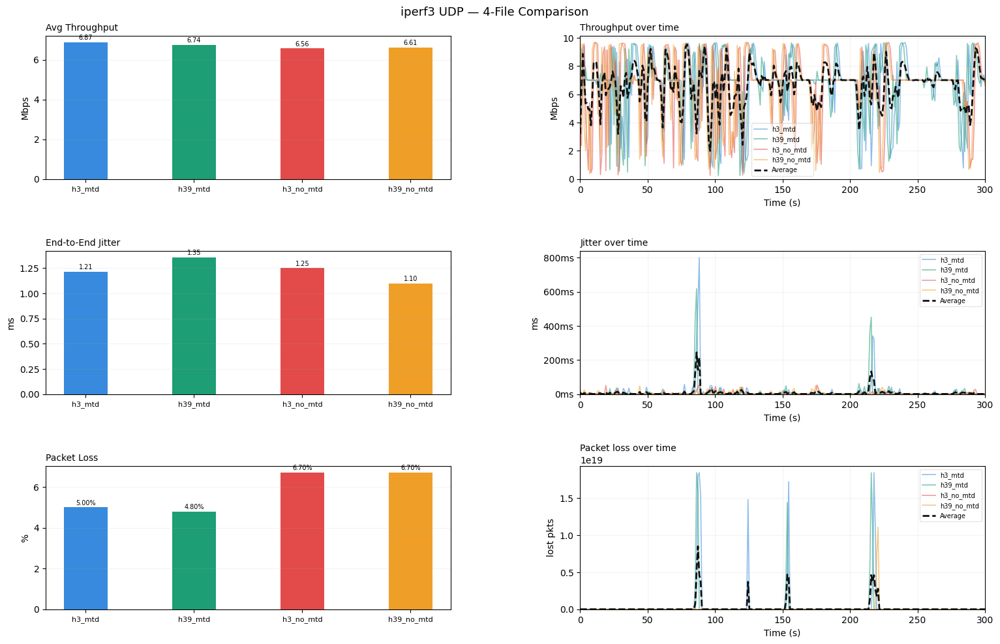

In [2]:
FILES = [
    "./logs/another_set/capture_test11_qos_h3_to_h38_MTD.txt",
    "./logs/another_set/capture_test11_qos_h39_to_h2_MTD.txt",
    "./logs/another_set/capture_test11_qos_h3_to_h38_no_MTD.txt",
    "./logs/another_set/capture_test11_qos_h39_to_h2_no_MTD.txt",
]

# Optional: set custom short labels. If fewer labels than files, auto-fills.
LABELS = ["h3_mtd","h39_mtd", "h3_no_mtd", "h39_no_mtd"]   # e.g. ["Living Room", "Bedroom", "Office", "Garage"]


files = FILES   # or manually specify
labels = make_labels(files, LABELS)
plot(files, labels)

Saved -> iperf3_comparison.png


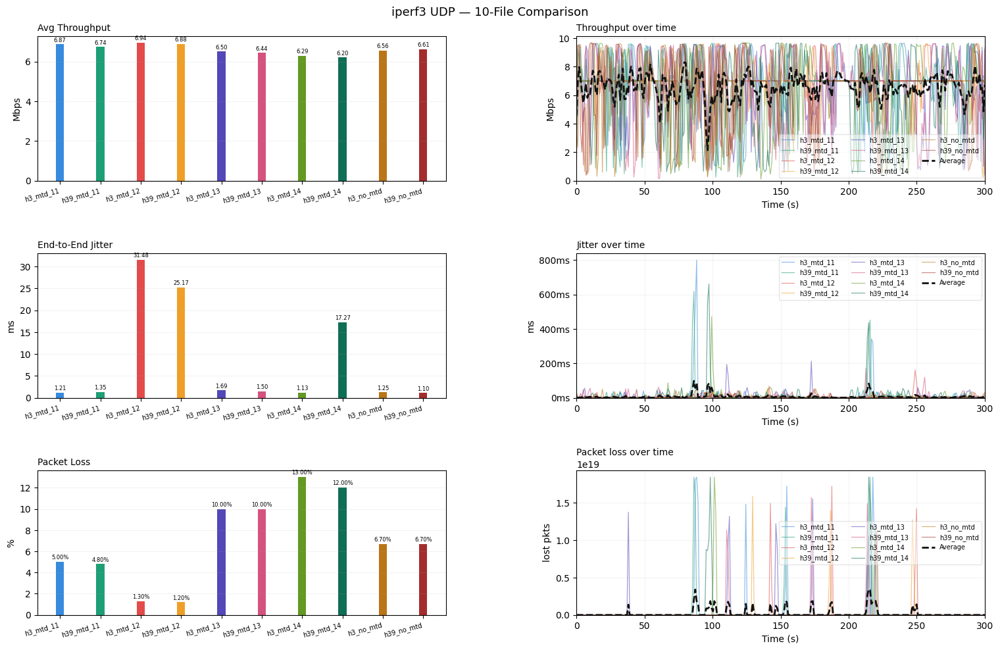

In [12]:
FILES = [
    "./logs/another_set/capture_test11_qos_h3_to_h38_MTD.txt",
    "./logs/another_set/capture_test11_qos_h39_to_h2_MTD.txt",
    "./logs/another_set/capture_test12_qos_h3_to_h38_MTD.txt",
    "./logs/another_set/capture_test12_qos_h39_to_h2_MTD.txt",
    "./logs/another_set/capture_test13_qos_h3_to_h38_MTD.txt",
    "./logs/another_set/capture_test13_qos_h39_to_h2_MTD.txt",
    "./logs/another_set/capture_test14_qos_h3_to_h38_MTD.txt",
    "./logs/another_set/capture_test14_qos_h39_to_h2_MTD.txt",
    "./logs/another_set/capture_test11_qos_h3_to_h38_no_MTD.txt",
    "./logs/another_set/capture_test11_qos_h39_to_h2_no_MTD.txt",
]

# Optional: set custom short labels. If fewer labels than files, auto-fills.
LABELS = ["h3_mtd_11","h39_mtd_11","h3_mtd_12","h39_mtd_12", "h3_mtd_13","h39_mtd_13","h3_mtd_14","h39_mtd_14", "h3_no_mtd", "h39_no_mtd"]   # e.g. ["Living Room", "Bedroom", "Office", "Garage"]


files = FILES   # or manually specify
labels = make_labels(files, LABELS)
plot(files, labels)

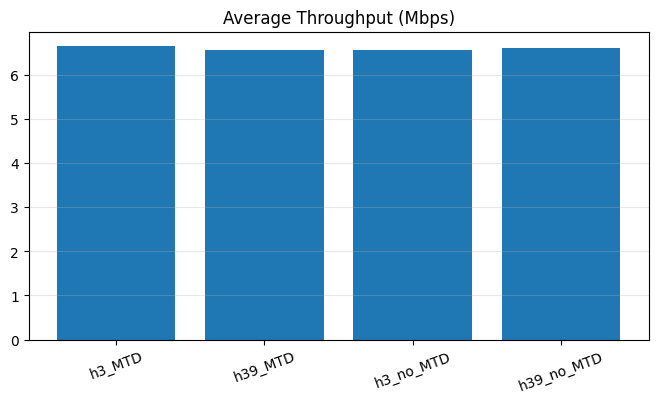

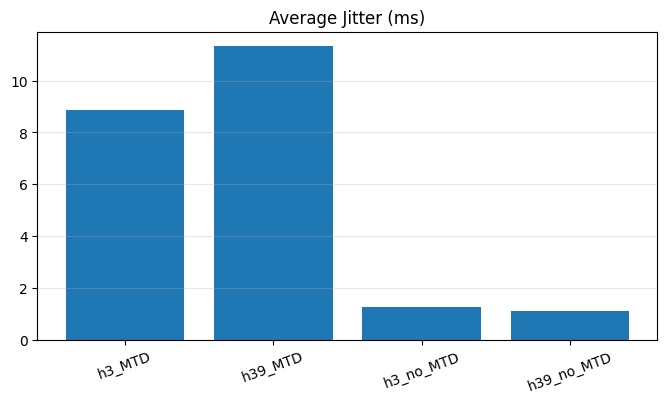

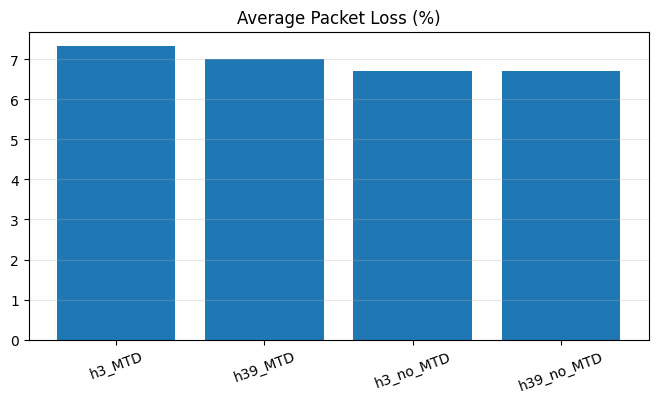

h3_MTD: throughput=6.65 Mbps, jitter=8.88 ms, loss=7.33%
h39_MTD: throughput=6.57 Mbps, jitter=11.32 ms, loss=7.00%
h3_no_MTD: throughput=6.56 Mbps, jitter=1.25 ms, loss=6.70%
h39_no_MTD: throughput=6.61 Mbps, jitter=1.10 ms, loss=6.70%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

groups = {
    "h3_MTD": [
        "./logs/another_set/capture_test11_qos_h3_to_h38_MTD.txt",
        "./logs/another_set/capture_test12_qos_h3_to_h38_MTD.txt",
        "./logs/another_set/capture_test13_qos_h3_to_h38_MTD.txt",
        "./logs/another_set/capture_test14_qos_h3_to_h38_MTD.txt",
    ],
    "h39_MTD": [
        "./logs/another_set/capture_test11_qos_h39_to_h2_MTD.txt",
        "./logs/another_set/capture_test12_qos_h39_to_h2_MTD.txt",
        "./logs/another_set/capture_test13_qos_h39_to_h2_MTD.txt",
        "./logs/another_set/capture_test14_qos_h39_to_h2_MTD.txt",
    ],
    "h3_no_MTD": [
        "./logs/another_set/capture_test11_qos_h3_to_h38_no_MTD.txt",
    ],
    "h39_no_MTD": [
        "./logs/another_set/capture_test11_qos_h39_to_h2_no_MTD.txt",
    ],
}

def avg_group(files):
    tp, jit, loss = [], [], []

    for f in files:
        _, _, _, _, summary = parse_file(f)
        tp.append(summary.get("avg_throughput_mbps", 0))
        jit.append(summary.get("jitter_ms", 0))
        loss.append(summary.get("loss_pct", 0))

    return np.mean(tp), np.mean(jit), np.mean(loss)

results = {name: avg_group(files) for name, files in groups.items()}

labels = list(results.keys())
throughput = [results[k][0] for k in labels]
jitter = [results[k][1] for k in labels]
loss = [results[k][2] for k in labels]

metrics = {
    "Average Throughput (Mbps)": throughput,
    "Average Jitter (ms)": jitter,
    "Average Packet Loss (%)": loss,
}

for title, values in metrics.items():
    plt.figure(figsize=(8, 4))
    plt.bar(labels, values)
    plt.title(title)
    plt.xticks(rotation=20)
    plt.grid(axis="y", alpha=0.3)
    plt.show()

for k, v in results.items():
    print(f"{k}: throughput={v[0]:.2f} Mbps, jitter={v[1]:.2f} ms, loss={v[2]:.2f}%")

h3_to_h38_MTD -> 4 files
h39_to_h2_MTD -> 4 files
h39_to_h2_no_MTD -> 1 files
h3_to_h38_no_MTD -> 1 files


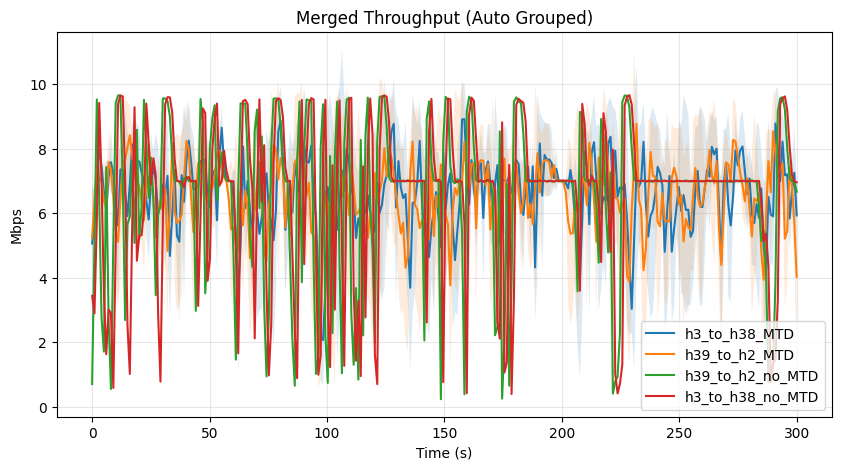

In [13]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

BASE_DIR = "./logs/another_set"

groups = {}

for f in os.listdir(BASE_DIR):
    if not f.endswith(".txt"):
        continue

    # Only qos logs
    if "qos" not in f:
        continue

    # Extract pattern
    # capture_test11_qos_h3_to_h38_MTD.txt
    m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
    if not m:
        continue

    src = m.group(1)
    dst = m.group(2)
    mode = m.group(3)

    key = f"{src}_to_{dst}_{mode}"

    groups.setdefault(key, []).append(os.path.join(BASE_DIR, f))

# DEBUG: see grouping
for k, v in groups.items():
    print(k, "->", len(v), "files")

def avg_ts(files, metric="throughput", n=300):
    all_series = []

    for f in files:
        times, bitrates, jitters, losses, _ = parse_file(f)

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        else:
            vals = losses

        t_common = np.linspace(0, 300, n)
        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0), np.std(all_series, axis=0)

plt.figure(figsize=(10,5))

for name, files in groups.items():
    t, avg, std = avg_ts(files, metric="throughput")

    plt.plot(t, avg, label=name)
    plt.fill_between(t, avg-std, avg+std, alpha=0.15)

plt.title("Merged Throughput (Auto Grouped)")
plt.xlabel("Time (s)")
plt.ylabel("Mbps")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

Detected groups:
h39_to_h2_no_MTD: 2 files
h39_to_h2_MTD: 5 files
h3_to_h38_MTD: 5 files
h3_to_h38_no_MTD: 2 files


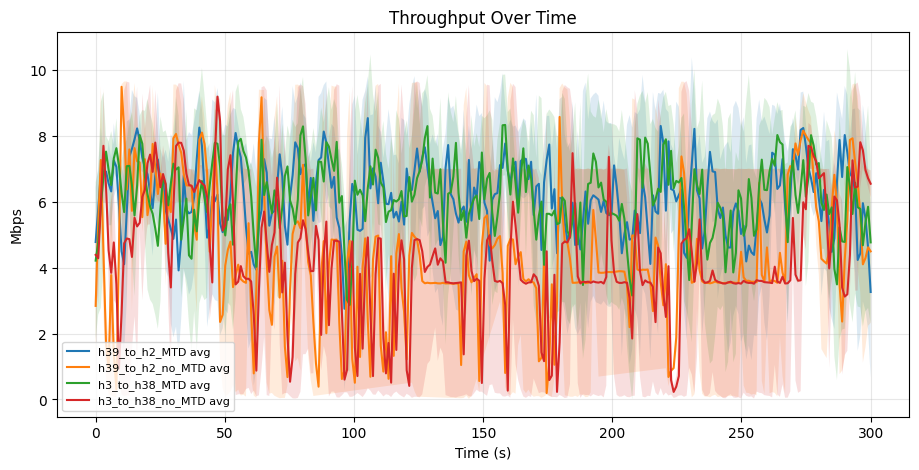

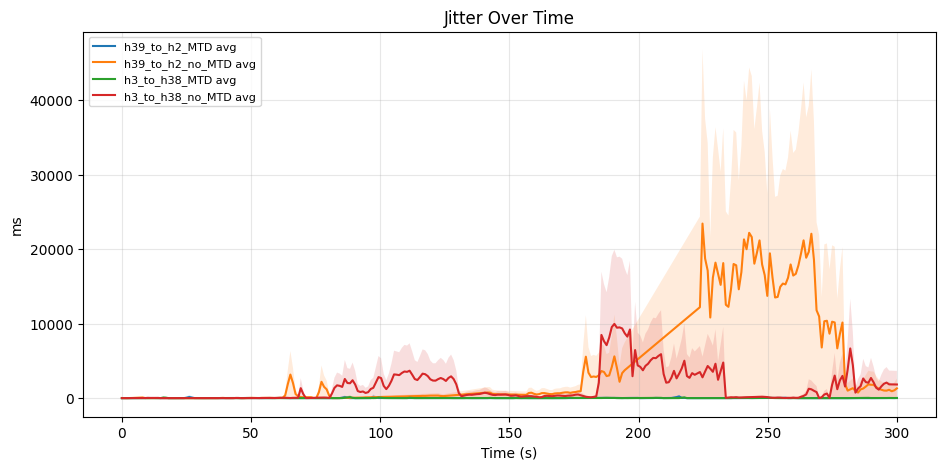

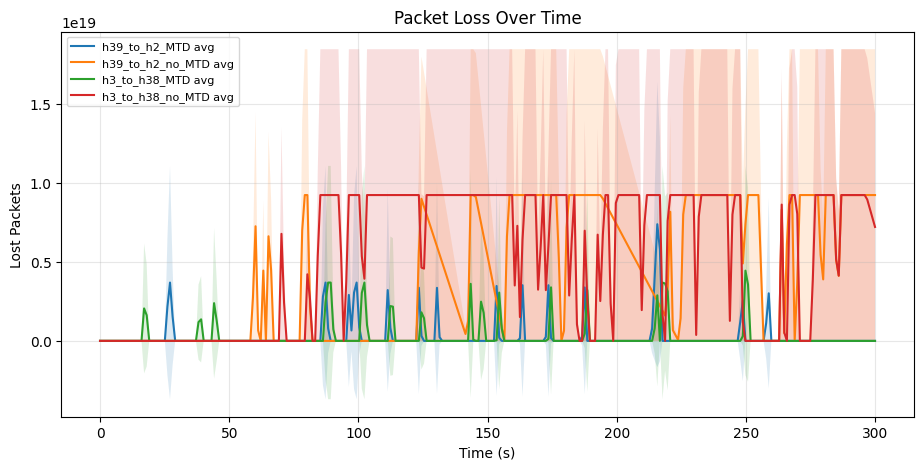

In [14]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

BASE_DIRS = ["./logs", "./logs/another_set"]

def collect_groups():
    groups = {}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
            if not m:
                continue

            src, dst, mode = m.groups()
            key = f"{src}_to_{dst}_{mode}"
            groups.setdefault(key, []).append(os.path.join(base, f))

    return groups


def avg_timeseries(files, metric="throughput", n=300):
    all_series = []
    t_common = np.linspace(0, 300, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, summary = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0), np.std(all_series, axis=0)


groups = collect_groups()

print("Detected groups:")
for k, v in groups.items():
    print(f"{k}: {len(v)} files")


metrics = {
    "throughput": ("Throughput Over Time", "Mbps"),
    "jitter": ("Jitter Over Time", "ms"),
    "loss": ("Packet Loss Over Time", "Lost Packets"),
}

for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg, std = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=f"{name} avg")
        plt.fill_between(t, avg - std, avg + std, alpha=0.15)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.show()

Detected groups:
h39_to_h2_no_MTD: 2 files
h39_to_h2_MTD: 5 files
h3_to_h38_MTD: 5 files
h3_to_h38_no_MTD: 2 files


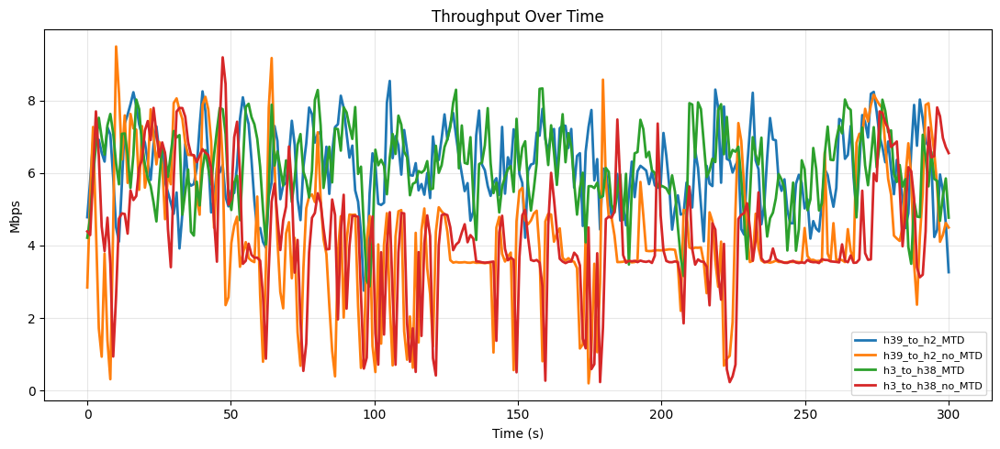

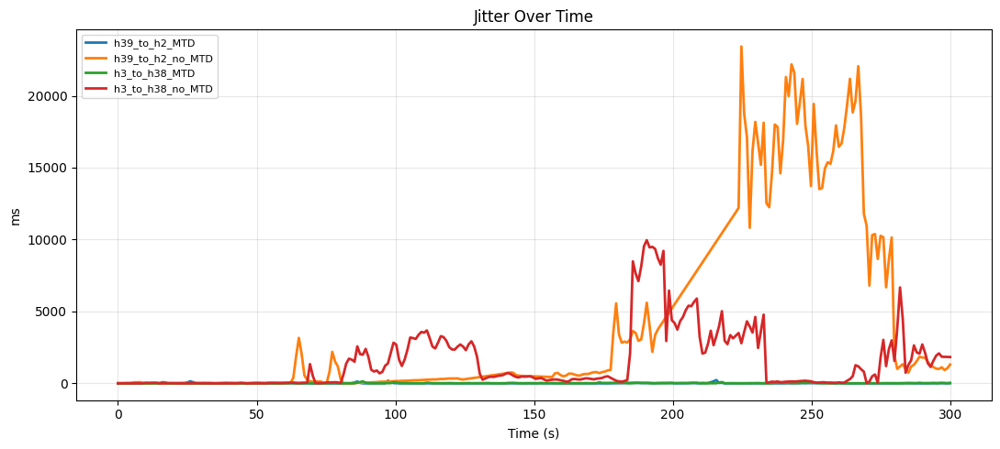

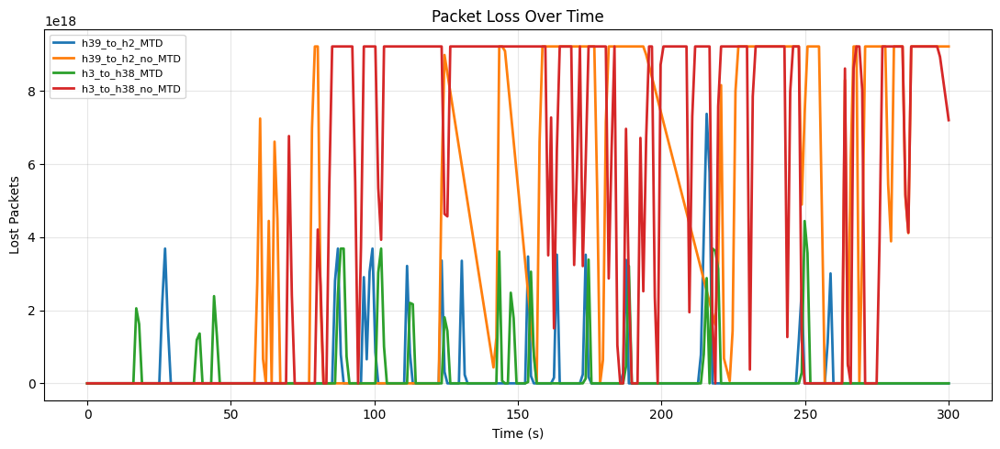

In [15]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")  # clean style

BASE_DIRS = ["./logs", "./logs/another_set"]

# -----------------------------
# Collect groups automatically
# -----------------------------
def collect_groups():
    groups = {}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
            if not m:
                continue

            src, dst, mode = m.groups()
            key = f"{src}_to_{dst}_{mode}"

            groups.setdefault(key, []).append(os.path.join(base, f))

    return groups


# -----------------------------
# Average time series
# -----------------------------
def avg_timeseries(files, metric="throughput", n=300):
    all_series = []
    t_common = np.linspace(0, 300, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, _ = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0)


# -----------------------------
# Run
# -----------------------------
groups = collect_groups()

print("Detected groups:")
for k, v in groups.items():
    print(f"{k}: {len(v)} files")


metrics = {
    "throughput": ("Throughput Over Time", "Mbps"),
    "jitter": ("Jitter Over Time", "ms"),
    "loss": ("Packet Loss Over Time", "Lost Packets"),
}


# -----------------------------
# Plot (NO background shading)
# -----------------------------
for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=name, linewidth=2)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

In [16]:
def avg_timeseries(files, metric="throughput", n=300, t_min=50, t_max=200):
    all_series = []
    t_common = np.linspace(t_min, t_max, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, _ = parse_file(f)

        if len(times) < 2:
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses

        # filter original data to range
        times = np.array(times)
        vals = np.array(vals)

        mask = (times >= t_min) & (times <= t_max)
        if np.sum(mask) < 2:
            continue

        times = times[mask]
        vals = vals[mask]

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)
    return t_common, np.mean(all_series, axis=0)

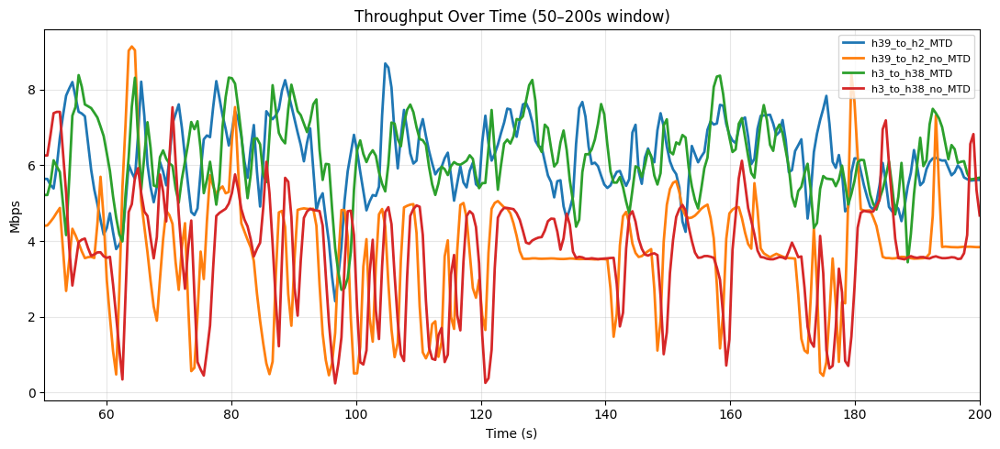

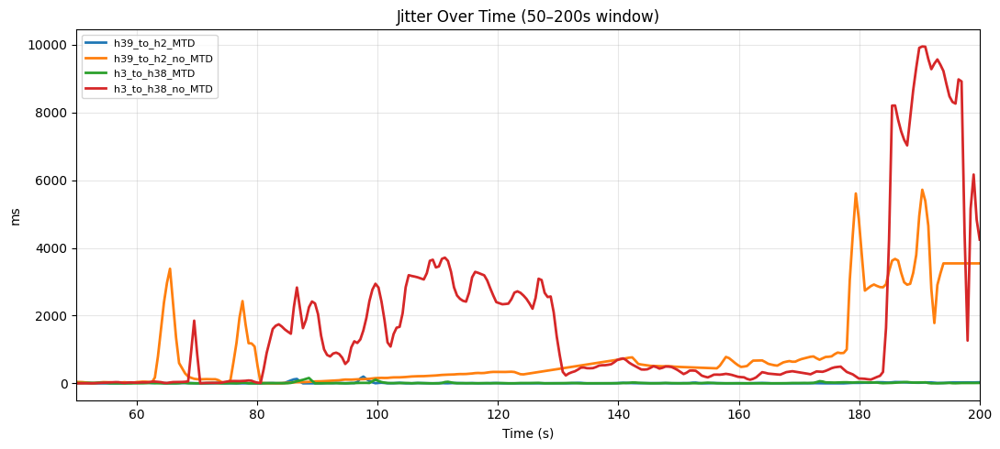

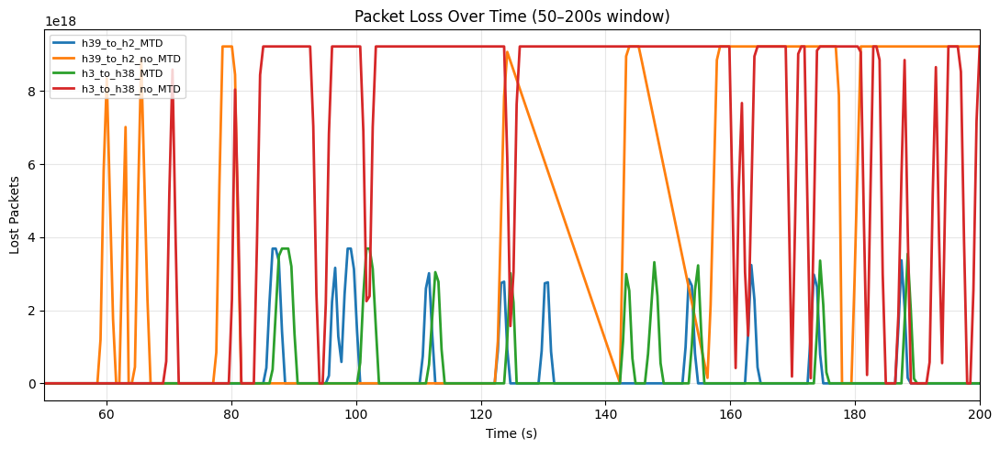

In [17]:
for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=name, linewidth=2)

    plt.title(title + " (50–200s window)")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(50, 200)   # 🔥 zoom applied
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

Detected groups:
h3_to_h38_MTD: 4 files
h39_to_h2_MTD: 4 files
h39_to_h2_no_MTD: 1 files
h3_to_h38_no_MTD: 1 files


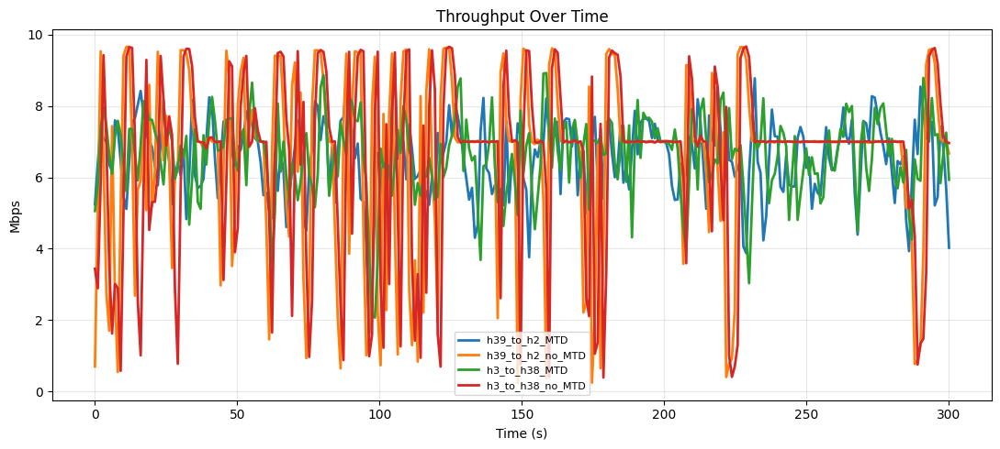

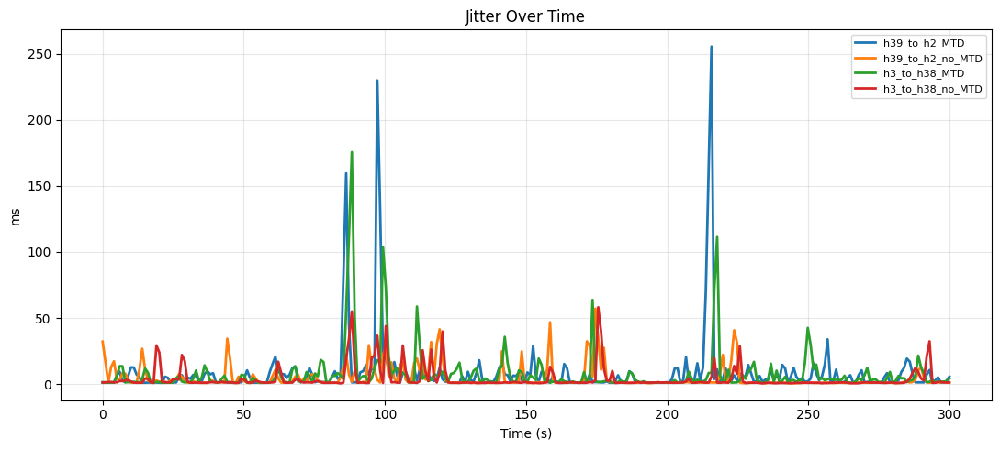

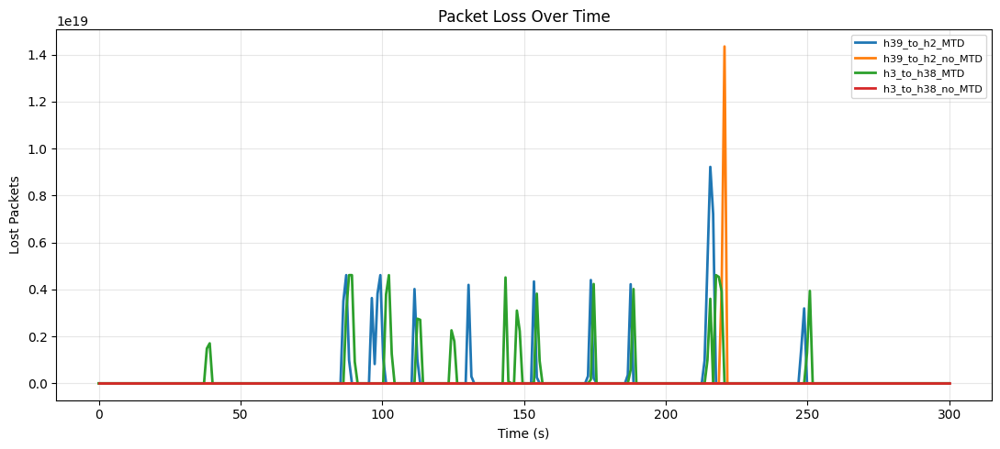

In [ ]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")  # clean style

BASE_DIRS = ["./logs", "./logs/another_set"]

# -----------------------------
# Collect groups automatically
# -----------------------------
def collect_groups():
    groups = {}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
            if not m:
                continue

            src, dst, mode = m.groups()
            key = f"{src}_to_{dst}_{mode}"

            groups.setdefault(key, []).append(os.path.join(base, f))

    return groups


# -----------------------------
# Average time series
# -----------------------------
def avg_timeseries(files, metric="throughput", n=300):
    all_series = []
    t_common = np.linspace(0, 300, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, _ = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0)


# -----------------------------
# Run
# -----------------------------
groups = collect_groups()

print("Detected groups:")
for k, v in groups.items():
    print(f"{k}: {len(v)} files")


metrics = {
    "throughput": ("Throughput Over Time", "Mbps"),
    "jitter": ("Jitter Over Time", "ms"),
    "loss": ("Packet Loss Over Time", "Lost Packets"),
}


# -----------------------------
# Plot (NO background shading)
# -----------------------------
for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=name, linewidth=2)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

Detected groups:
h39_to_h2_MTD: 5 files
h3_to_h38_MTD: 5 files
h39_to_h2_no_MTD: 1 files
h3_to_h38_no_MTD: 1 files


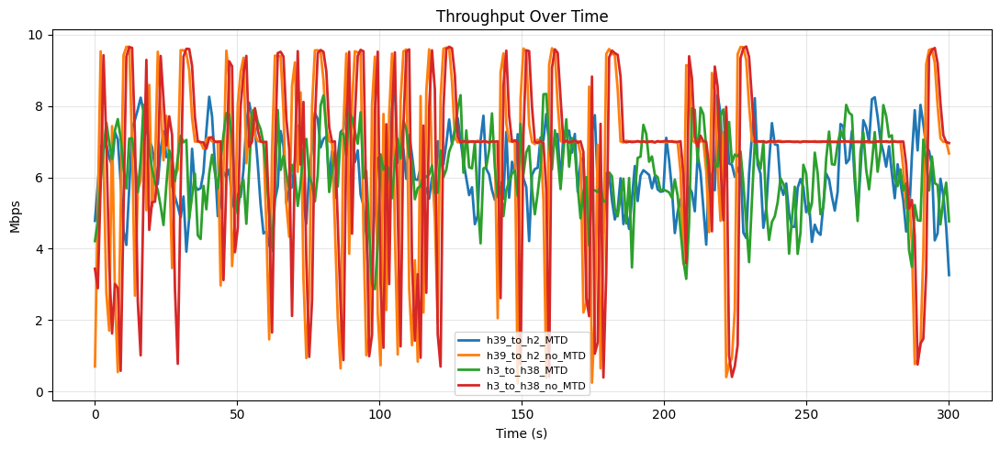

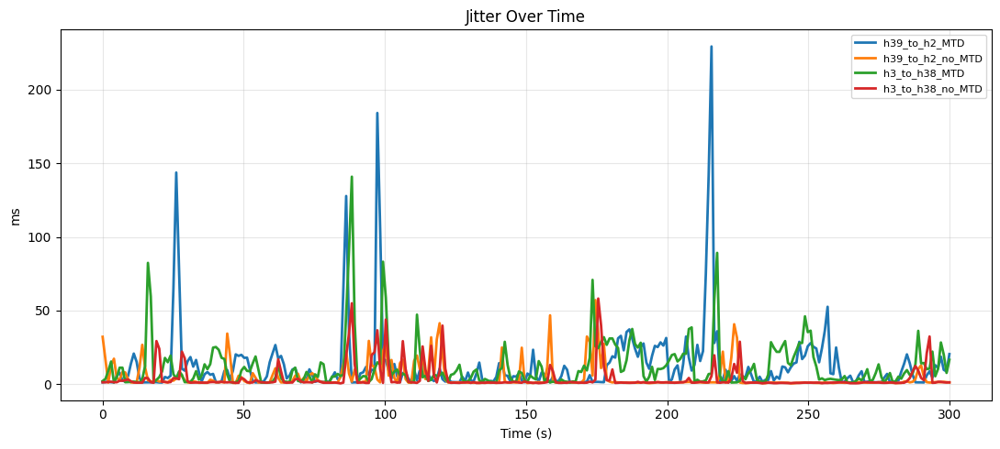

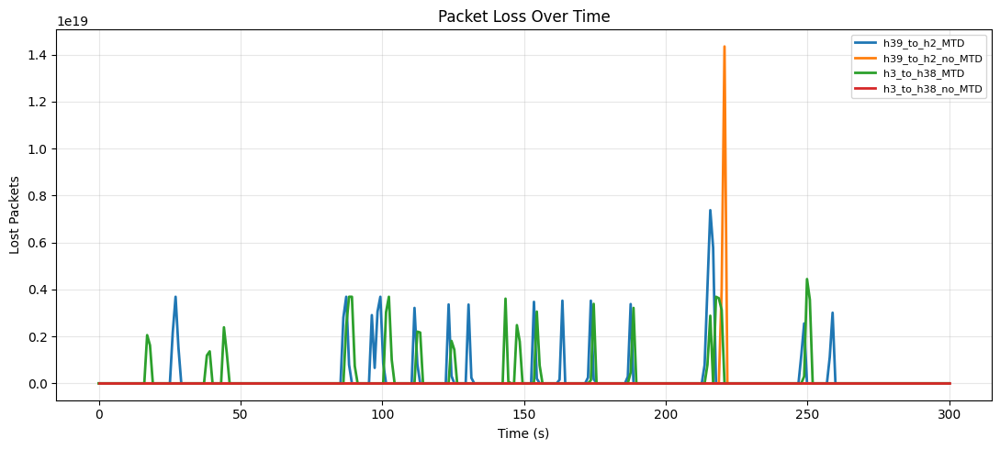

In [19]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")  # clean style

BASE_DIRS = ["./logs", "./logs/another_set"]

# -----------------------------
# Collect groups automatically
# -----------------------------
def collect_groups():
    groups = {}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
            if not m:
                continue

            src, dst, mode = m.groups()
            key = f"{src}_to_{dst}_{mode}"

            groups.setdefault(key, []).append(os.path.join(base, f))

    return groups


# -----------------------------
# Average time series
# -----------------------------
def avg_timeseries(files, metric="throughput", n=300):
    all_series = []
    t_common = np.linspace(0, 300, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, _ = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0)


# -----------------------------
# Run
# -----------------------------
groups = collect_groups()

print("Detected groups:")
for k, v in groups.items():
    print(f"{k}: {len(v)} files")


metrics = {
    "throughput": ("Throughput Over Time", "Mbps"),
    "jitter": ("Jitter Over Time", "ms"),
    "loss": ("Packet Loss Over Time", "Lost Packets"),
}


# -----------------------------
# Plot (NO background shading)
# -----------------------------
for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=name, linewidth=2)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

Detected groups:
h3_to_h38_MTD: 5 files
h3_to_h38_no_MTD: 2 files
h39_to_h2_MTD: 5 files
h39_to_h2_no_MTD: 2 files


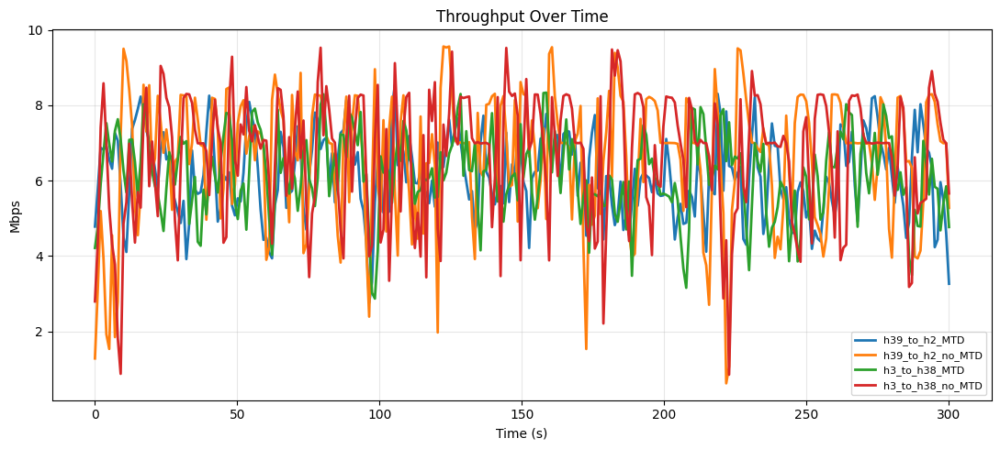

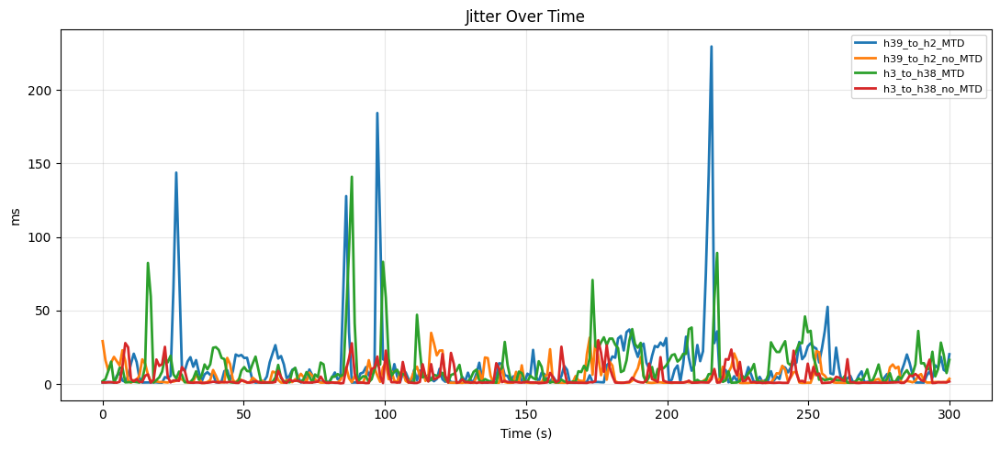

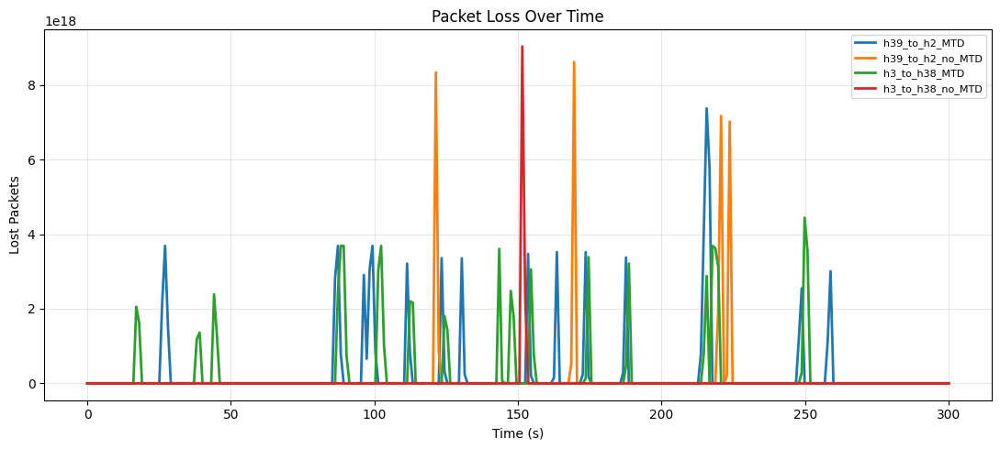

In [21]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")  # clean style

BASE_DIRS = ["./logs/another_set","./logs"]

# -----------------------------
# Collect groups automatically
# -----------------------------
def collect_groups():
    groups = {}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            m = re.search(r"qos_(h\d+)_to_(h\d+)_(MTD|no_MTD)", f)
            if not m:
                continue

            src, dst, mode = m.groups()
            key = f"{src}_to_{dst}_{mode}"

            groups.setdefault(key, []).append(os.path.join(base, f))

    return groups


# -----------------------------
# Average time series
# -----------------------------
def avg_timeseries(files, metric="throughput", n=300):
    all_series = []
    t_common = np.linspace(0, 300, n)

    for f in sorted(files):
        times, bitrates, jitters, losses, _ = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        vals_interp = np.interp(t_common, times, vals)
        all_series.append(vals_interp)

    all_series = np.array(all_series)

    return t_common, np.mean(all_series, axis=0)


# -----------------------------
# Run
# -----------------------------
groups = collect_groups()

print("Detected groups:")
for k, v in groups.items():
    print(f"{k}: {len(v)} files")


metrics = {
    "throughput": ("Throughput Over Time", "Mbps"),
    "jitter": ("Jitter Over Time", "ms"),
    "loss": ("Packet Loss Over Time", "Lost Packets"),
}


# -----------------------------
# Plot (NO background shading)
# -----------------------------
for metric, (title, ylabel) in metrics.items():
    plt.figure(figsize=(11, 5))

    for name, files in sorted(groups.items()):
        t, avg = avg_timeseries(files, metric=metric)
        plt.plot(t, avg, label=name, linewidth=2)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

Detected files:
MTD: 10 files
no_MTD: 4 files


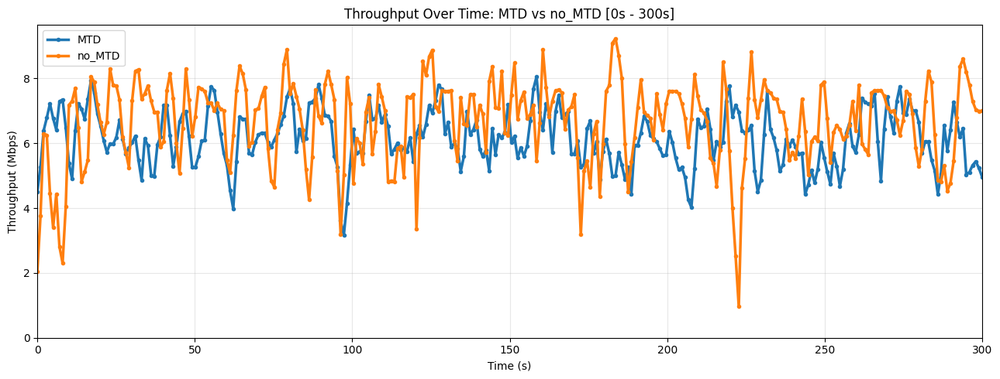

Detected files:
MTD: 10 files
no_MTD: 4 files


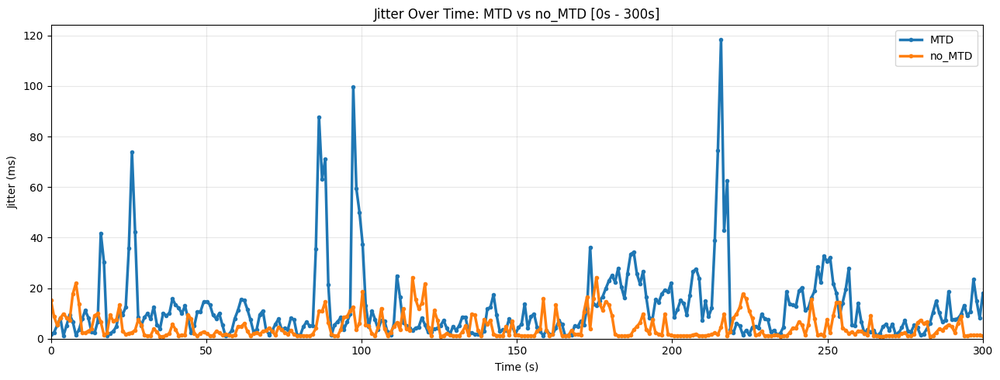

Detected files:
MTD: 10 files
no_MTD: 4 files


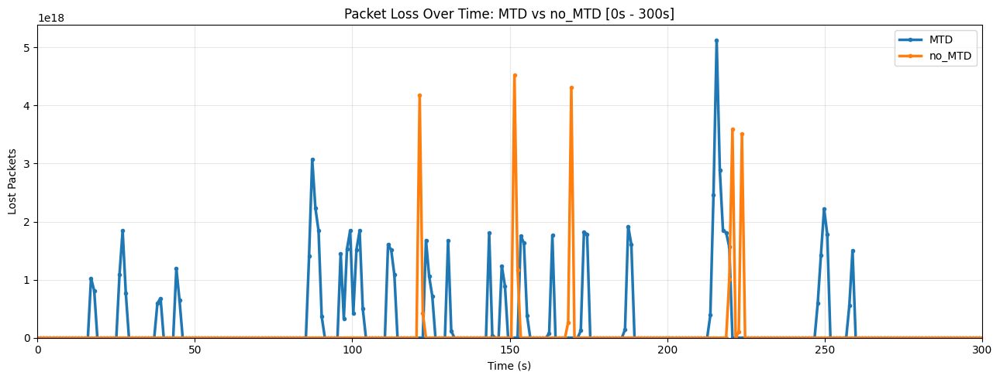

In [21]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

BASE_DIRS = ["./logs/another_set", "./logs"]

# change this range
START_TIME = 0
END_TIME   = 300

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+(\w+)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(-?\d+)/(\d+)"
)

def parse_file(path):
    times, bitrates, jitters, losses = [], [], [], []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end   = float(m.group(2))

        if t_end - t_start > 10:
            continue

        bitrate = float(m.group(3))
        unit    = m.group(4)
        jitter  = float(m.group(5))
        lost    = int(m.group(6))

        if unit == "K":
            bitrate /= 1000.0
        elif unit == "G":
            bitrate *= 1000.0

        times.append((t_start + t_end) / 2)
        bitrates.append(bitrate)
        jitters.append(jitter)
        losses.append(max(0, lost))

    return np.array(times), np.array(bitrates), np.array(jitters), np.array(losses)


def collect_mtd_groups():
    groups = {"MTD": [], "no_MTD": []}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            if not f.endswith(".txt") or "qos" not in f:
                continue

            full = os.path.join(base, f)

            if "_no_MTD" in f:
                groups["no_MTD"].append(full)
            elif "_MTD" in f:
                groups["MTD"].append(full)

    return groups


def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates, jitters, losses = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            continue

        vals_interp = np.interp(t_common, times[mask], vals[mask])
        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)


def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=300):
    groups = collect_mtd_groups()

    print("Detected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput": ("Throughput Over Time: MTD vs no_MTD", "Throughput (Mbps)"),
        "jitter": ("Jitter Over Time: MTD vs no_MTD", "Jitter (ms)"),
        "loss": ("Packet Loss Over Time: MTD vs no_MTD", "Lost Packets"),
    }

    title, ylabel = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(files, metric, start_time, end_time)

        if avg is None:
            print("No valid data for:", group_name)
            continue

        plt.plot(t, avg, linewidth=2.5, marker="o", markersize=3, label=group_name)

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Run plots
plot_mtd_vs_no_mtd("throughput", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Detected files:
MTD: 10 files
no_MTD: 4 files


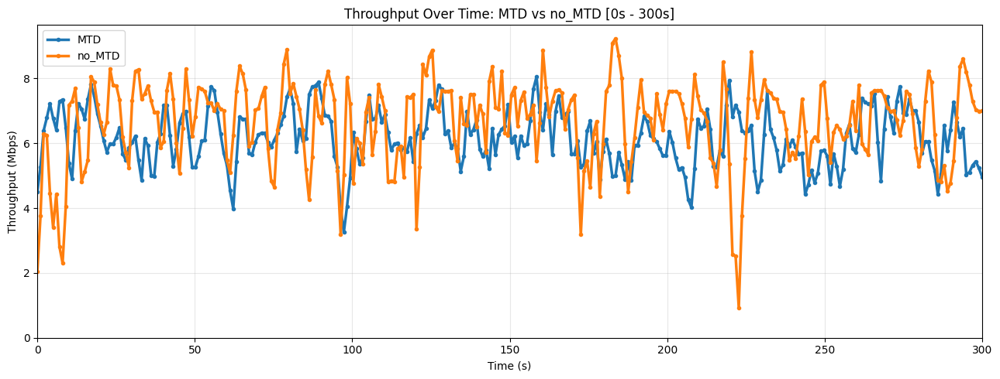

Detected files:
MTD: 10 files
no_MTD: 4 files


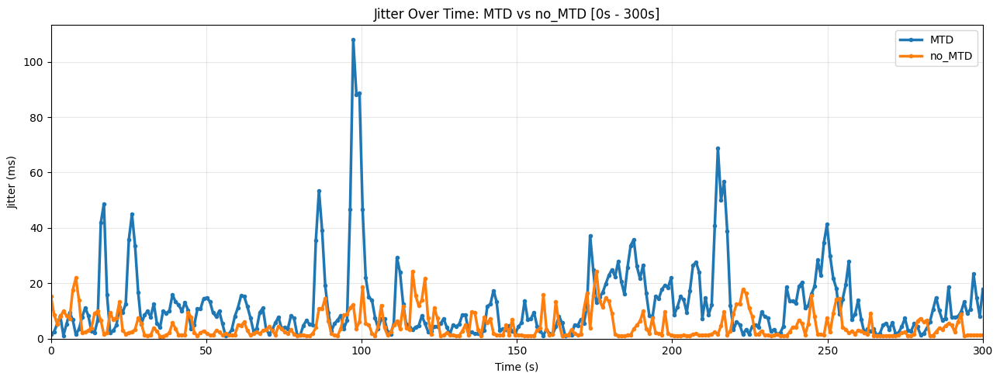

Detected files:
MTD: 10 files
no_MTD: 4 files


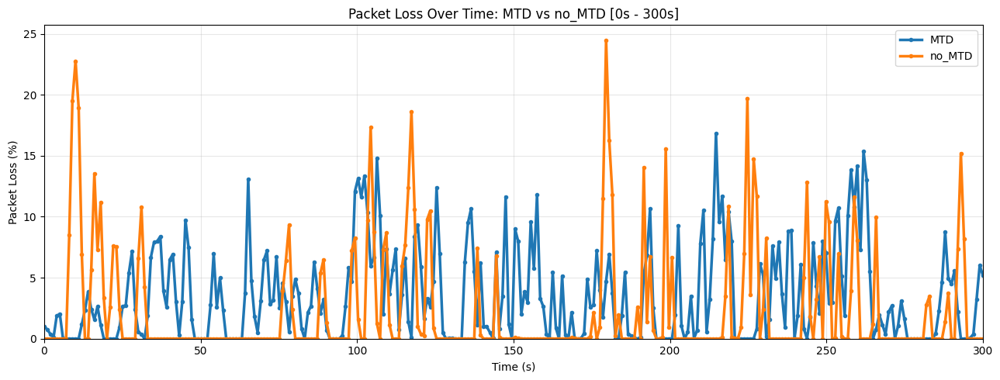

In [22]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

BASE_DIRS = ["./logs/another_set", "./logs"]

START_TIME = 0
END_TIME   = 300

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    times, bitrates, jitters, loss_pcts = [], [], [], []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end   = float(m.group(2))

        # keep interval rows only, skip summaries
        if t_end - t_start > 5:
            continue

        bitrate = float(m.group(3))
        unit    = m.group(4)
        jitter  = float(m.group(5))
        lost    = int(m.group(6))
        total   = int(m.group(7))
        loss_pct = float(m.group(8))

        if unit == "K":
            bitrate /= 1000.0
        elif unit == "G":
            bitrate *= 1000.0

        # safety filter
        if total <= 0 or loss_pct < 0 or loss_pct > 100:
            continue

        times.append((t_start + t_end) / 2)
        bitrates.append(bitrate)
        jitters.append(jitter)
        loss_pcts.append(loss_pct)

    return np.array(times), np.array(bitrates), np.array(jitters), np.array(loss_pcts)


def collect_mtd_groups():
    groups = {"MTD": [], "no_MTD": []}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt") or "qos" not in fname:
                continue

            full = os.path.join(base, f)

            if "_no_mtd" in fname:
                groups["no_MTD"].append(full)
            elif "_mtd" in fname:
                groups["MTD"].append(full)

    return groups


def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates, jitters, losses = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("metric must be throughput, jitter, or loss")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            continue

        vals_interp = np.interp(t_common, times[mask], vals[mask])
        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)


def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=300):
    groups = collect_mtd_groups()

    print("Detected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput": ("Throughput Over Time: MTD vs no_MTD", "Throughput (Mbps)"),
        "jitter": ("Jitter Over Time: MTD vs no_MTD", "Jitter (ms)"),
        "loss": ("Packet Loss Over Time: MTD vs no_MTD", "Packet Loss (%)"),
    }

    title, ylabel = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(files, metric, start_time, end_time)

        if avg is None:
            print("No valid data for:", group_name)
            continue

        plt.plot(t, avg, linewidth=2.5, marker="o", markersize=3, label=group_name)

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


plot_mtd_vs_no_mtd("throughput", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ./onelinecrossfire
Scanning: .

Detected files:
With MTD: 6 files
Without MTD: 4 files


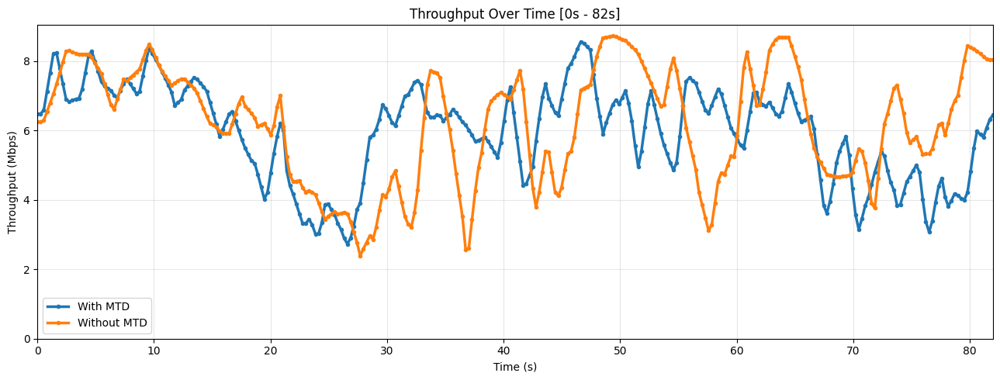

Scanning: ./onelinecrossfire
Scanning: .

Detected files:
With MTD: 6 files
Without MTD: 4 files


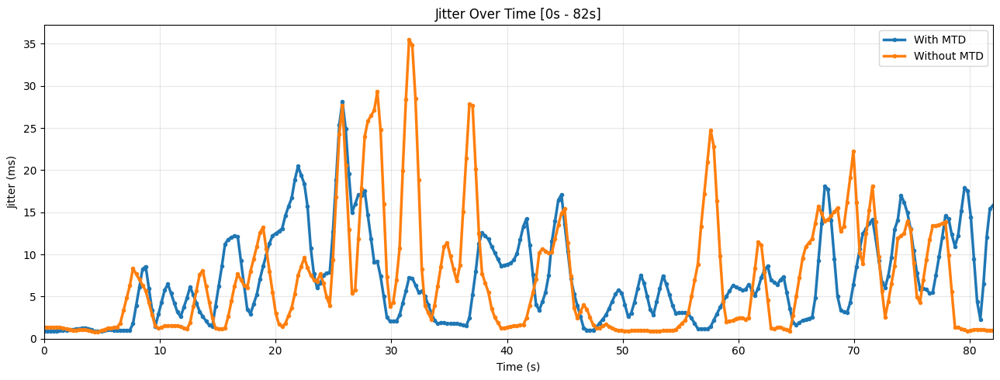

Scanning: ./onelinecrossfire
Scanning: .

Detected files:
With MTD: 6 files
Without MTD: 4 files


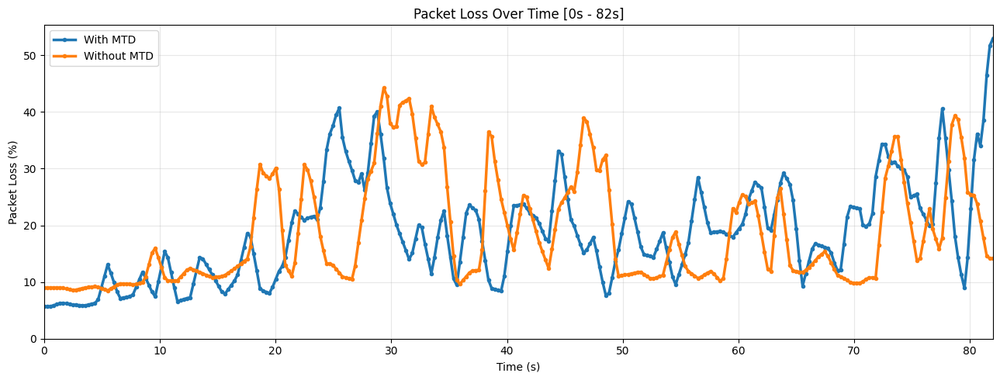

In [39]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# Search possible locations
BASE_DIRS = ["../onelinecrossfire", "./onelinecrossfire", "."]

# Plot range
START_TIME = 0
END_TIME   = 82

# iperf UDP interval regex (supports packet loss %)
INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# -------------------------------------------------
# Parse one iperf txt file
# -------------------------------------------------
def parse_file(path):
    times, bitrates, jitters, losses = [], [], [], []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end   = float(m.group(2))

        # skip summary rows
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit    = m.group(4)
        jitter  = float(m.group(5))
        lost    = int(m.group(6))
        total   = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert to Mbps
        if unit == "K":
            bitrate /= 1000.0
        elif unit == "G":
            bitrate *= 1000.0

        # sanity check
        if total <= 0:
            continue
        if loss_pct < 0 or loss_pct > 100:
            continue

        times.append((t_start + t_end) / 2.0)
        bitrates.append(bitrate)
        jitters.append(jitter)
        losses.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates),
        np.array(jitters),
        np.array(losses)
    )

# -------------------------------------------------
# Detect files
# -------------------------------------------------
def collect_mtd_groups():
    # groups = {"MTD": [], "no_MTD": []}
    groups = {"With MTD": [], "Without MTD": []}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            if "_no_mtd" in fname:
                # groups["no_MTD"].append(full)
                groups["Without MTD"].append(full)

            elif "_mtd" in fname:
                # groups["MTD"].append(full)
                groups["With MTD"].append(full)

    return groups

# -------------------------------------------------
# Average group
# -------------------------------------------------
def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates, jitters, losses = parse_file(f)

        if len(times) < 2:
            print("Skipped:", f)
            continue

        if metric == "throughput":
            vals = bitrates
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# -------------------------------------------------
# Plot
# -------------------------------------------------
def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput": (
            "Throughput Over Time",
            "Throughput (Mbps)"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)"
        ),
    }

    title, ylabel = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# -------------------------------------------------
# Run
# -------------------------------------------------
plot_mtd_vs_no_mtd("throughput", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


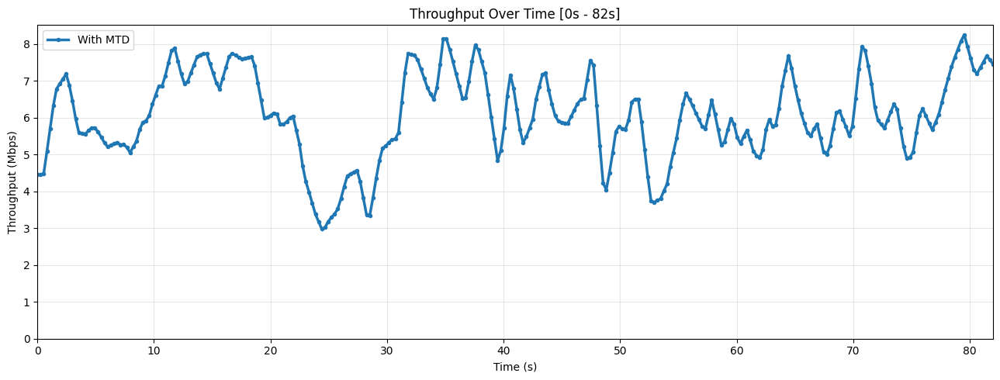

Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


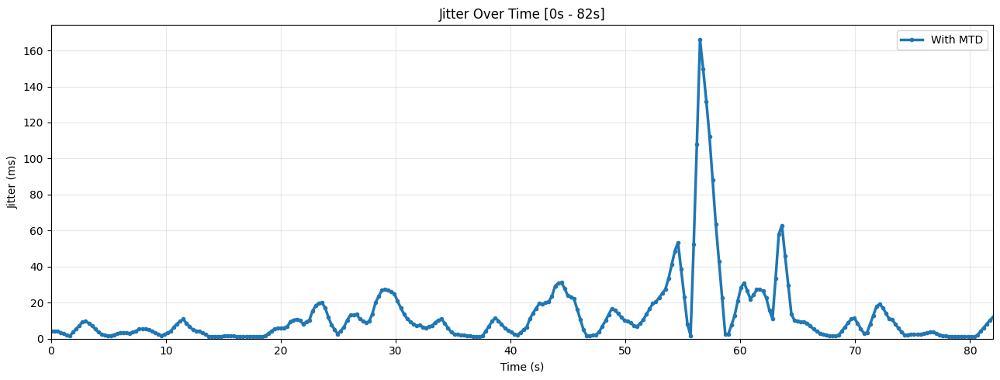

Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


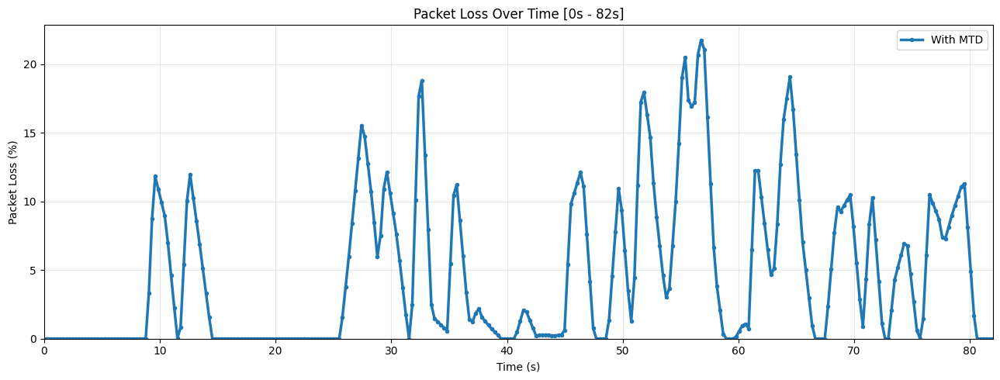

In [4]:
# ### paper


# import os, re
# import numpy as np
# import matplotlib.pyplot as plt

# plt.style.use("default")

# # Search possible locations
# BASE_DIRS = ["../logs_generated/test_rrm_jafarian"]

# # Plot range
# START_TIME = 0
# END_TIME   = 82

# # iperf UDP interval regex (supports packet loss %)
# INTERVAL_RE = re.compile(
#     r"\[\s*\d+\]\s+"
#     r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
#     r"[\d.]+\s+\w+Bytes\s+"
#     r"([\d.]+)\s+([KMG]?)bits/sec\s+"
#     r"([\d.]+)\s+ms\s+"
#     r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
# )

# # -------------------------------------------------
# # Parse one iperf txt file
# # -------------------------------------------------
# def parse_file(path):
#     times, bitrates, jitters, losses = [], [], [], []

#     with open(path, "r", errors="ignore") as f:
#         text = f.read()

#     for line in text.splitlines():
#         m = INTERVAL_RE.search(line)
#         if not m:
#             continue

#         t_start = float(m.group(1))
#         t_end   = float(m.group(2))

#         # skip summary rows
#         if (t_end - t_start) > 5:
#             continue

#         bitrate = float(m.group(3))
#         unit    = m.group(4)
#         jitter  = float(m.group(5))
#         lost    = int(m.group(6))
#         total   = int(m.group(7))
#         loss_pct = float(m.group(8))

#         # Convert to Mbps
#         if unit == "K":
#             bitrate /= 1000.0
#         elif unit == "G":
#             bitrate *= 1000.0

#         # sanity check
#         if total <= 0:
#             continue
#         if loss_pct < 0 or loss_pct > 100:
#             continue

#         times.append((t_start + t_end) / 2.0)
#         bitrates.append(bitrate)
#         jitters.append(jitter)
#         losses.append(loss_pct)

#     return (
#         np.array(times),
#         np.array(bitrates),
#         np.array(jitters),
#         np.array(losses)
#     )

# # -------------------------------------------------
# # Detect files
# # -------------------------------------------------
# def collect_mtd_groups():
#     # groups = {"MTD": [], "no_MTD": []}
#     groups = {"With MTD": [], "Without MTD": []}

#     for base in BASE_DIRS:
#         if not os.path.isdir(base):
#             continue

#         print("Scanning:", base)

#         for f in os.listdir(base):
#             fname = f.lower()

#             if not fname.endswith(".txt"):
#                 continue

#             if "qos" not in fname:
#                 continue

#             full = os.path.join(base, f)

#             if "_no_mtd" in fname:
#                 # groups["no_MTD"].append(full)
#                 groups["Without MTD"].append(full)

#             elif "_mtd" in fname:
#                 # groups["MTD"].append(full)
#                 groups["With MTD"].append(full)

#     return groups

# # -------------------------------------------------
# # Average group
# # -------------------------------------------------
# def average_group(files, metric, start_time, end_time, n=300):
#     t_common = np.linspace(start_time, end_time, n)
#     all_series = []

#     for f in sorted(files):
#         times, bitrates, jitters, losses = parse_file(f)

#         if len(times) < 2:
#             print("Skipped:", f)
#             continue

#         if metric == "throughput":
#             vals = bitrates
#         elif metric == "jitter":
#             vals = jitters
#         elif metric == "loss":
#             vals = losses
#         else:
#             raise ValueError("Invalid metric")

#         mask = (times >= start_time) & (times <= end_time)

#         if mask.sum() < 2:
#             continue

#         vals_interp = np.interp(
#             t_common,
#             times[mask],
#             vals[mask]
#         )

#         all_series.append(vals_interp)

#     if not all_series:
#         return t_common, None

#     return t_common, np.mean(np.array(all_series), axis=0)

# # -------------------------------------------------
# # Plot
# # -------------------------------------------------
# def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
#     groups = collect_mtd_groups()

#     print("\nDetected files:")
#     for k, v in groups.items():
#         print(f"{k}: {len(v)} files")

#     labels = {
#         "throughput": (
#             "Throughput Over Time",
#             "Throughput (Mbps)"
#         ),
#         "jitter": (
#             "Jitter Over Time",
#             "Jitter (ms)"
#         ),
#         "loss": (
#             "Packet Loss Over Time",
#             "Packet Loss (%)"
#         ),
#     }

#     title, ylabel = labels[metric]

#     plt.figure(figsize=(13, 5))

#     for group_name, files in groups.items():
#         t, avg = average_group(
#             files,
#             metric,
#             start_time,
#             end_time
#         )

#         if avg is None:
#             print("No valid data:", group_name)
#             continue

#         plt.plot(
#             t,
#             avg,
#             linewidth=2.5,
#             marker="o",
#             markersize=3,
#             label=group_name
#         )

#     plt.title(f"{title} [{start_time}s - {end_time}s]")
#     plt.xlabel("Time (s)")
#     plt.ylabel(ylabel)
#     plt.xlim(start_time, end_time)
#     plt.ylim(bottom=0)
#     plt.grid(alpha=0.3)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

# # -------------------------------------------------
# # Run
# # -------------------------------------------------
# plot_mtd_vs_no_mtd("throughput", START_TIME, END_TIME)
# plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
# plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


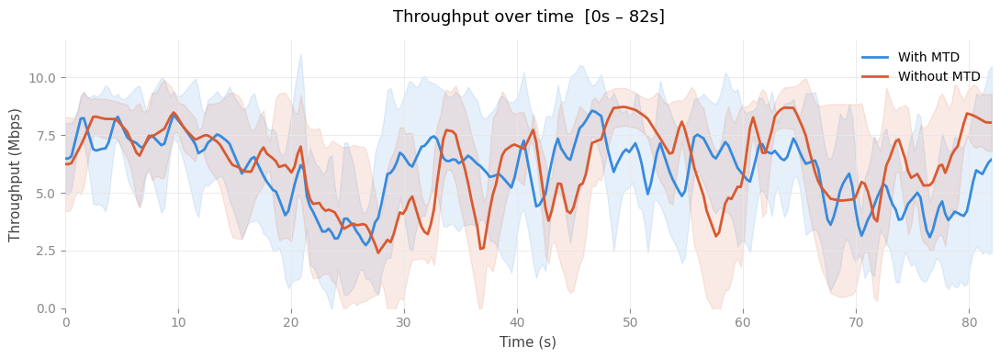

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


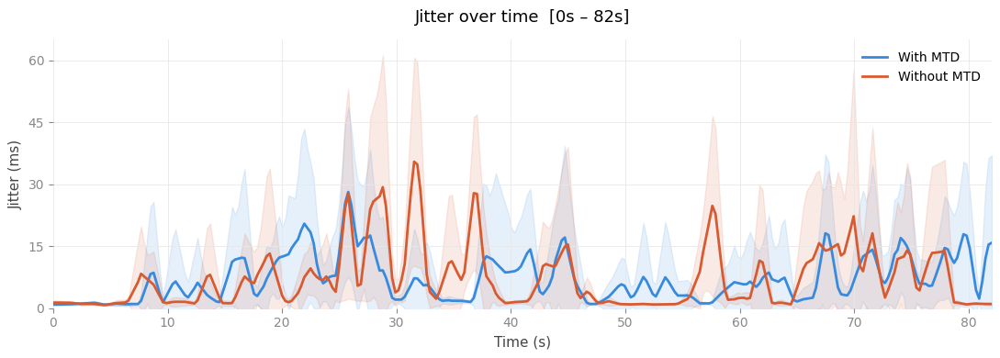

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


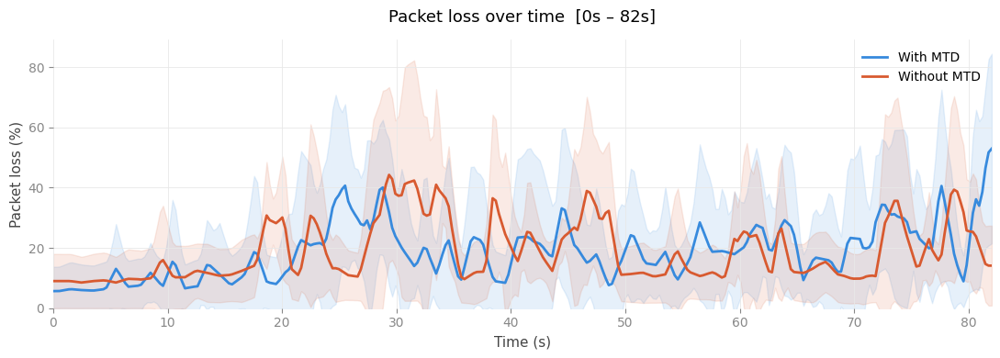

In [2]:
import os, re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

BASE_DIRS  = ["../onelinecrossfire", "./onelinecrossfire", "."]
START_TIME = 0
END_TIME   = 82

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

PALETTE = {"With MTD": "#378ADD", "Without MTD": "#D85A30"}
METRICS = {
    "throughput": ("Throughput over time",    "Throughput (Mbps)"),
    "jitter":     ("Jitter over time",        "Jitter (ms)"),
    "loss":       ("Packet loss over time",   "Packet loss (%)"),
}

plt.rcParams.update({
    "figure.facecolor":   "white",
    "axes.facecolor":     "white",
    "axes.grid":          True,
    "grid.color":         "#e8e8e8",
    "grid.linewidth":     0.6,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.spines.left":   False,
    "axes.spines.bottom": False,
    "xtick.color":        "#888888",
    "ytick.color":        "#888888",
    "xtick.labelsize":    10,
    "ytick.labelsize":    10,
    "axes.labelsize":     11,
    "axes.labelcolor":    "#444444",
    "axes.titlesize":     13,
    "axes.titleweight":   "normal",
    "axes.titlepad":      14,
    "legend.fontsize":    10,
    "legend.frameon":     False,
    "font.family":        "sans-serif",
})


# ── parsing ────────────────────────────────────────────────────────────────

def parse_file(path):
    times, bitrates, jitters, losses = [], [], [], []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start, t_end = float(m.group(1)), float(m.group(2))
        if (t_end - t_start) > 5:          # skip summaries
            continue

        bitrate  = float(m.group(3))
        unit     = m.group(4)
        jitter   = float(m.group(5))
        loss_pct = float(m.group(8))
        total    = int(m.group(7))

        if total <= 0 or not (0 <= loss_pct <= 100):
            continue

        if unit == "K":
            bitrate /= 1000.0
        elif unit == "G":
            bitrate *= 1000.0

        times.append((t_start + t_end) / 2.0)
        bitrates.append(bitrate)
        jitters.append(jitter)
        losses.append(loss_pct)

    return map(np.array, (times, bitrates, jitters, losses))


def collect_groups():
    groups = {"With MTD": [], "Without MTD": []}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue
        print(f"Scanning: {base}")
        for f in os.listdir(base):
            fname = f.lower()
            if not (fname.endswith(".txt") and "qos" in fname):
                continue
            full = os.path.join(base, f)
            if "_no_mtd" in fname:
                groups["Without MTD"].append(full)
            elif "_mtd" in fname:
                groups["With MTD"].append(full)

    for k, v in groups.items():
        print(f"  {k}: {len(v)} file(s)")
    return groups


def average_group(files, metric, start, end, n=300):
    t_common   = np.linspace(start, end, n)
    all_series = []

    key = {"throughput": 1, "jitter": 2, "loss": 3}[metric]

    for f in sorted(files):
        parsed = list(parse_file(f))
        times, vals = parsed[0], parsed[key]

        if len(times) < 2:
            print(f"  Skipped (too few points): {f}")
            continue

        mask = (times >= start) & (times <= end)
        if mask.sum() < 2:
            continue

        all_series.append(np.interp(t_common, times[mask], vals[mask]))

    if not all_series:
        return t_common, None, None

    arr  = np.array(all_series)
    mean = np.mean(arr, axis=0)
    std  = np.std(arr, axis=0) if len(all_series) > 1 else None
    return t_common, mean, std


# ── plotting ───────────────────────────────────────────────────────────────

def plot_metric(metric, start=START_TIME, end=END_TIME):
    title, ylabel = METRICS[metric]
    groups = collect_groups()

    fig, ax = plt.subplots(figsize=(11, 4))

    any_data = False
    for label, files in groups.items():
        t, mean, std = average_group(files, metric, start, end)
        if mean is None:
            print(f"  No valid data for: {label}")
            continue

        color = PALETTE[label]
        ax.plot(t, mean, linewidth=2, color=color, label=label)

        if std is not None:
            ax.fill_between(t, mean - std, mean + std,
                            alpha=0.12, color=color)
        any_data = True

    if not any_data:
        plt.close()
        return

    # y-axis: tight range, never go below 0
    ax.set_ylim(bottom=0)
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=5, integer=(metric == "loss")))

    ax.set_xlim(start, end)
    ax.set_title(f"{title}  [{start}s – {end}s]")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel(ylabel)
    ax.legend(loc="upper right")

    plt.tight_layout()
    plt.savefig(f"{metric}.png", dpi=150, bbox_inches="tight")
    plt.show()


# ── run ────────────────────────────────────────────────────────────────────

for m in ("throughput", "jitter", "loss"):
    plot_metric(m)

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


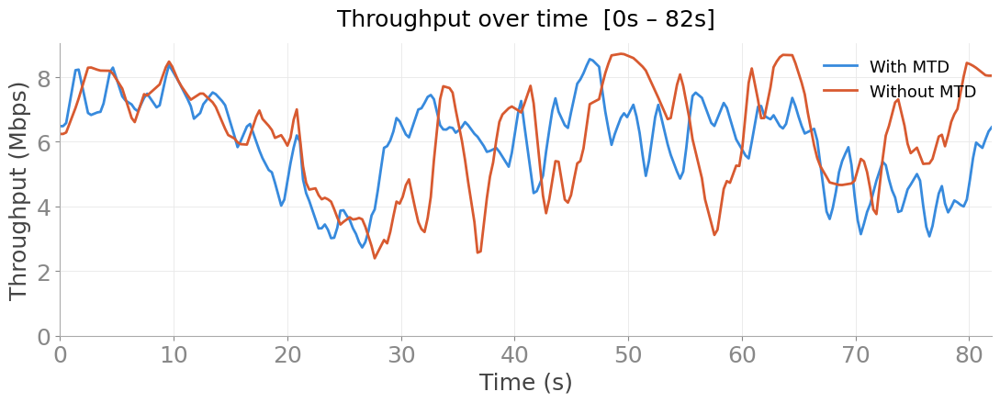

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


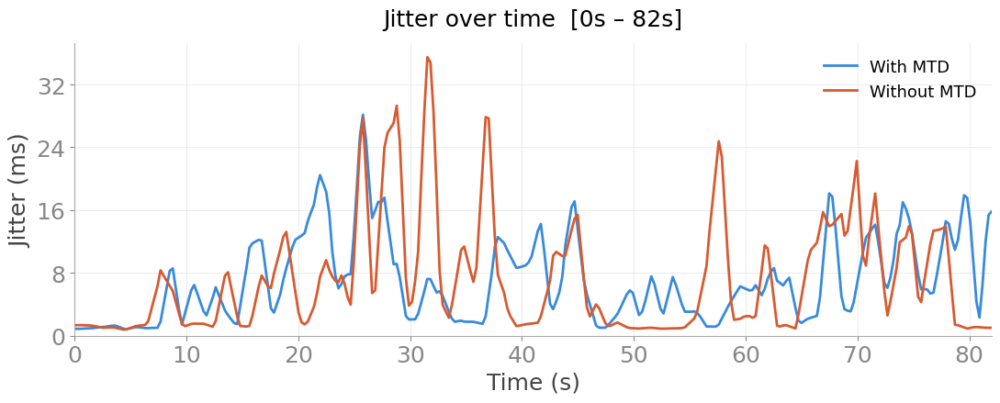

Scanning: ./onelinecrossfire
Scanning: .
  With MTD: 6 file(s)
  Without MTD: 4 file(s)


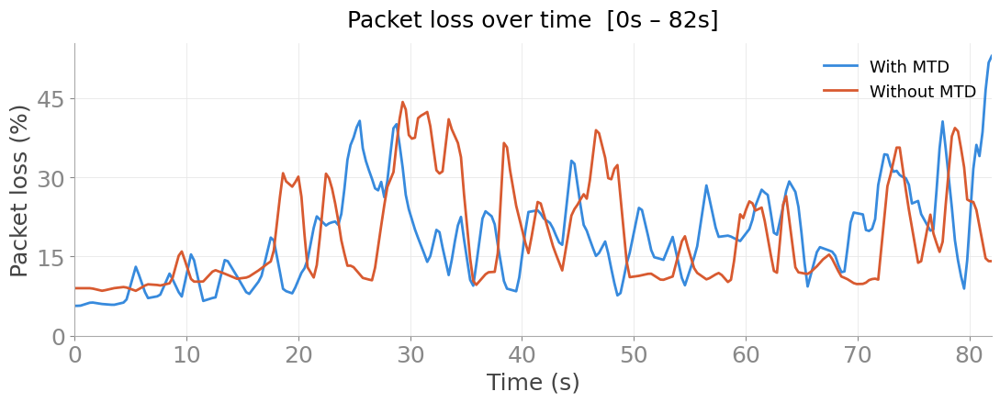

In [52]:
import os, re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

BASE_DIRS  = ["../onelinecrossfire", "./onelinecrossfire", "."]
START_TIME = 0
END_TIME   = 82

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

PALETTE = {"With MTD": "#378ADD", "Without MTD": "#D85A30"}
METRICS = {
    "throughput": ("Throughput over time",  "Throughput (Mbps)"),
    "jitter":     ("Jitter over time",      "Jitter (ms)"),
    "loss":       ("Packet loss over time", "Packet loss (%)"),
}

plt.rcParams.update({
    "figure.facecolor":   "white",
    "axes.facecolor":     "white",
    "axes.grid":          True,
    "grid.color":         "#e8e8e8",
    "grid.linewidth":     0.6,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.spines.left":   True,
    "axes.spines.bottom": True,
    "axes.edgecolor":     "#aaaaaa",
    "axes.linewidth":     0.8,
    "xtick.color":        "#888888",
    "ytick.color":        "#888888",
    "xtick.labelsize":    18,
    "ytick.labelsize":    18,
    "axes.labelsize":     18,
    "axes.labelcolor":    "#444444",
    "axes.titlesize":     18,
    "axes.titleweight":   "normal",
    "axes.titlepad":      14,
    "legend.fontsize":    13,
    "legend.frameon":     False,
    "font.family":        "sans-serif",
})


# ── parsing ────────────────────────────────────────────────────────────────

def parse_file(path):
    times, bitrates, jitters, losses = [], [], [], []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start, t_end = float(m.group(1)), float(m.group(2))
        if (t_end - t_start) > 5:
            continue

        bitrate  = float(m.group(3))
        unit     = m.group(4)
        jitter   = float(m.group(5))
        loss_pct = float(m.group(8))
        total    = int(m.group(7))

        if total <= 0 or not (0 <= loss_pct <= 100):
            continue

        if unit == "K":
            bitrate /= 1000.0
        elif unit == "G":
            bitrate *= 1000.0

        times.append((t_start + t_end) / 2.0)
        bitrates.append(bitrate)
        jitters.append(jitter)
        losses.append(loss_pct)

    return map(np.array, (times, bitrates, jitters, losses))


def collect_groups():
    groups = {"With MTD": [], "Without MTD": []}

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue
        print(f"Scanning: {base}")
        for f in os.listdir(base):
            fname = f.lower()
            if not (fname.endswith(".txt") and "qos" in fname):
                continue
            full = os.path.join(base, f)
            if "_no_mtd" in fname:
                groups["Without MTD"].append(full)
            elif "_mtd" in fname:
                groups["With MTD"].append(full)

    for k, v in groups.items():
        print(f"  {k}: {len(v)} file(s)")
    return groups


def average_group(files, metric, start, end, n=300):
    t_common   = np.linspace(start, end, n)
    all_series = []
    key = {"throughput": 1, "jitter": 2, "loss": 3}[metric]

    for f in sorted(files):
        parsed = list(parse_file(f))
        times, vals = parsed[0], parsed[key]

        if len(times) < 2:
            print(f"  Skipped (too few points): {f}")
            continue

        mask = (times >= start) & (times <= end)
        if mask.sum() < 2:
            continue

        all_series.append(np.interp(t_common, times[mask], vals[mask]))

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)


# ── plotting ───────────────────────────────────────────────────────────────

def plot_metric(metric, start=START_TIME, end=END_TIME):
    title, ylabel = METRICS[metric]
    groups = collect_groups()

    fig, ax = plt.subplots(figsize=(11, 4.5))

    any_data = False
    for label, files in groups.items():
        t, mean = average_group(files, metric, start, end)
        if mean is None:
            print(f"  No valid data for: {label}")
            continue

        ax.plot(t, mean, linewidth=2, color=PALETTE[label], label=label)
        any_data = True

    if not any_data:
        plt.close()
        return

    ax.set_ylim(bottom=0)
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=5, integer=(metric == "loss")))
    ax.set_xlim(start, end)
    ax.set_title(f"{title}  [{start}s – {end}s]")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel(ylabel)
    ax.legend(loc="upper right")

    plt.tight_layout()
    plt.savefig(f"{metric}.png", dpi=150, bbox_inches="tight")
    plt.show()


# ── run ────────────────────────────────────────────────────────────────────

for m in ("throughput", "jitter", "loss"):
    plot_metric(m)

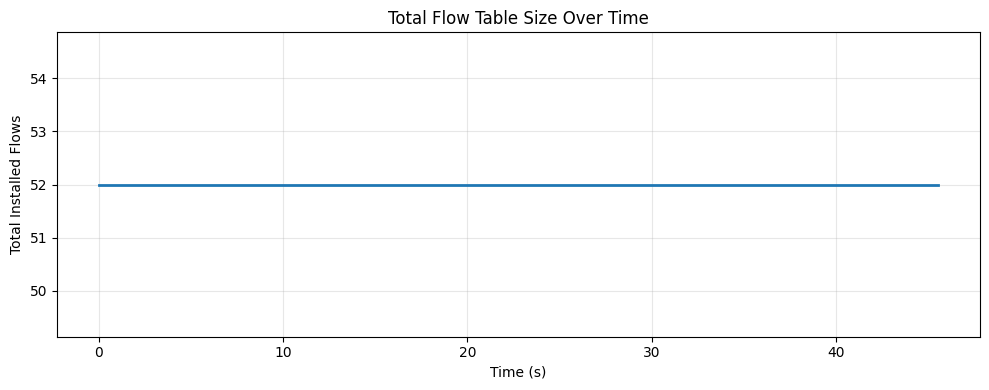

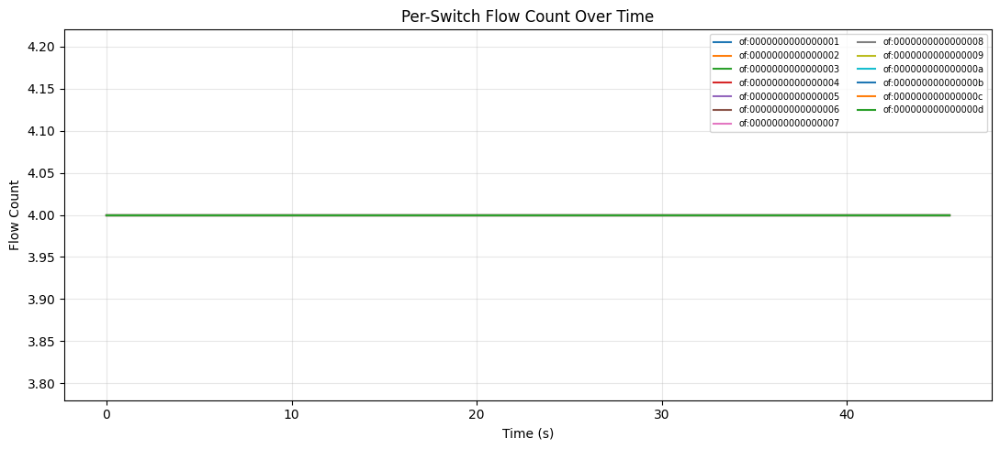

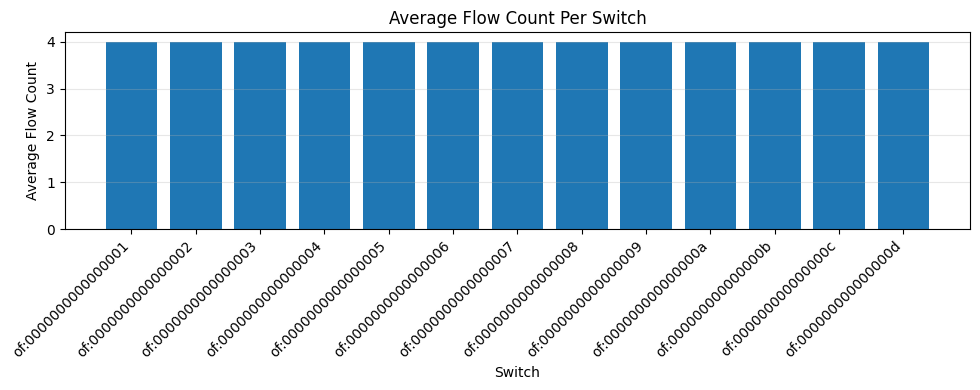

In [43]:
import pandas as pd
import matplotlib.pyplot as plt

CSV_FILE = "flow_overhead_log.csv"

df = pd.read_csv(CSV_FILE)

# one row per timestamp for total flow count
total_df = df[["elapsed_sec", "total_flows"]].drop_duplicates()

# -----------------------------
# 1) Total flow table size over time
# -----------------------------
plt.figure(figsize=(10, 4))
plt.plot(total_df["elapsed_sec"], total_df["total_flows"], linewidth=2)
plt.title("Total Flow Table Size Over Time")
plt.xlabel("Time (s)")
plt.ylabel("Total Installed Flows")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# -----------------------------
# 2) Per-switch flow count over time
# -----------------------------
pivot = df.pivot_table(
    index="elapsed_sec",
    columns="device_id",
    values="device_flow_count",
    aggfunc="mean"
)

plt.figure(figsize=(11, 5))
for dev in pivot.columns:
    plt.plot(pivot.index, pivot[dev], linewidth=1.5, label=dev)

plt.title("Per-Switch Flow Count Over Time")
plt.xlabel("Time (s)")
plt.ylabel("Flow Count")
plt.grid(alpha=0.3)
plt.legend(fontsize=7, ncol=2)
plt.tight_layout()
plt.show()

# -----------------------------
# 3) Average flow count per switch
# -----------------------------
avg_per_switch = df.groupby("device_id")["device_flow_count"].mean().sort_values()

plt.figure(figsize=(10, 4))
plt.bar(avg_per_switch.index, avg_per_switch.values)
plt.title("Average Flow Count Per Switch")
plt.xlabel("Switch")
plt.ylabel("Average Flow Count")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

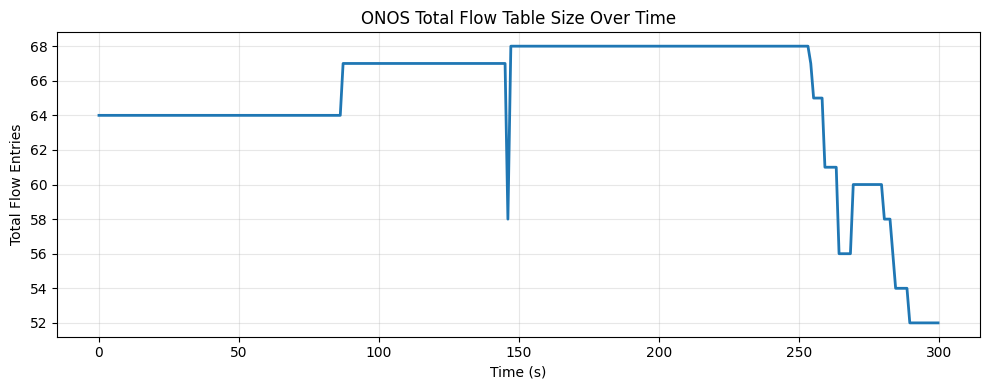

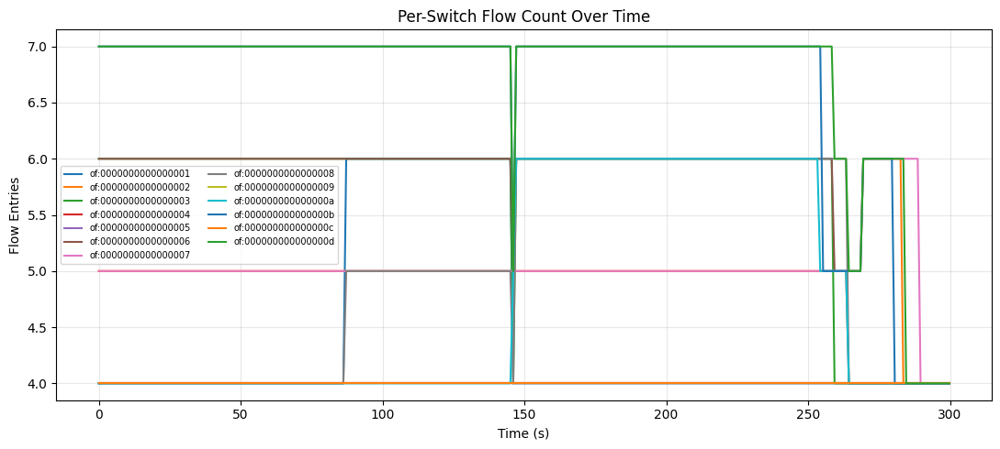

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("onos_flow_overhead.csv")

# Keep only one total_flows value per time sample
total_df = (
    df.groupby("elapsed_sec", as_index=False)
      .agg(total_flows=("total_flows", "first"))
)

plt.figure(figsize=(10,4))
plt.plot(total_df["elapsed_sec"], total_df["total_flows"], linewidth=2)
plt.title("ONOS Total Flow Table Size Over Time")
plt.xlabel("Time (s)")
plt.ylabel("Total Flow Entries")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Per-switch view
switch_df = df.pivot_table(
    index="elapsed_sec",
    columns="device_id",
    values="device_flow_count",
    aggfunc="first"
)

plt.figure(figsize=(11,5))
for dev in switch_df.columns:
    plt.plot(switch_df.index, switch_df[dev], label=dev, linewidth=1.5)

plt.title("Per-Switch Flow Count Over Time")
plt.xlabel("Time (s)")
plt.ylabel("Flow Entries")
plt.grid(alpha=0.3)
plt.legend(fontsize=7, ncol=2)
plt.tight_layout()
plt.show()

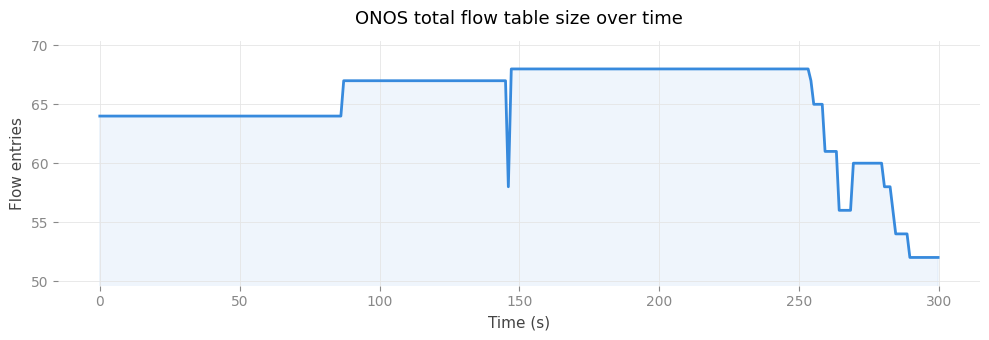

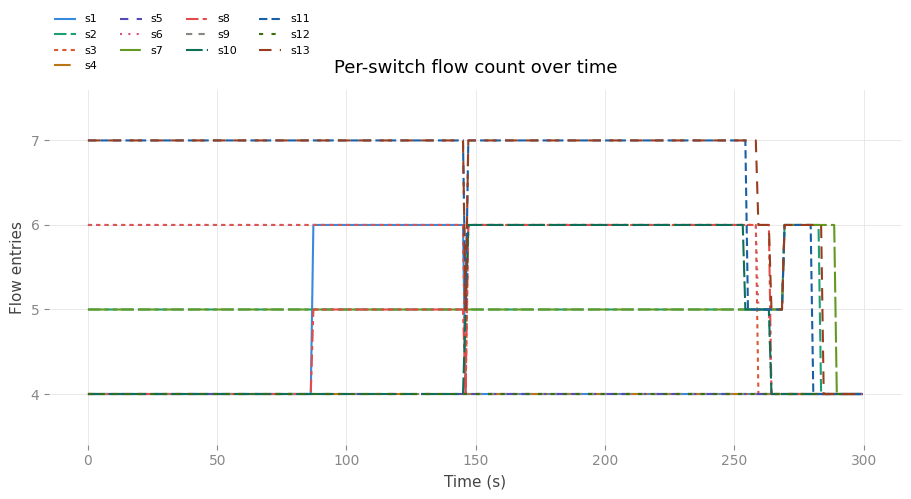

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

df = pd.read_csv("onos_flow_overhead.csv")
shortname = lambda d: 's' + str(int(d[-2:], 16))

plt.rcParams.update({
    "figure.facecolor":   "white",
    "axes.facecolor":     "white",
    "axes.grid":          True,
    "grid.color":         "#e5e5e5",
    "grid.linewidth":     0.6,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.spines.left":   False,
    "axes.spines.bottom": False,
    "xtick.color":        "#888888",
    "ytick.color":        "#888888",
    "xtick.labelsize":    10,
    "ytick.labelsize":    10,
    "axes.labelsize":     11,
    "axes.labelcolor":    "#444444",
    "axes.titlesize":     13,
    "axes.titleweight":   "normal",
    "axes.titlepad":      12,
    "lines.linewidth":    1.8,
    "font.family":        "sans-serif",
})

PALETTE = [
    "#378ADD","#1D9E75","#D85A30","#BA7517","#534AB7",
    "#D4537E","#639922","#E24B4A","#888780","#0F6E56",
    "#185FA5","#3B6D11","#993C1D",
]
DASHES = [
    (1,0),(6,2),(2,2),(8,3,2,3),(4,4),
    (1,3),(10,2),(6,2,2,2),(3,3),(8,2),
    (4,2,4,2),(2,4),(6,4),
]

# ── chart 1: total flows ───────────────────────────────────────────────────
total_df = (
    df.groupby("elapsed_sec", as_index=False)
      .agg(total_flows=("total_flows", "first"))
      .sort_values("elapsed_sec")
)

fig, ax = plt.subplots(figsize=(10, 3.5))
ax.plot(total_df["elapsed_sec"], total_df["total_flows"],
        color="#378ADD", linewidth=2)
ax.fill_between(total_df["elapsed_sec"], total_df["total_flows"],
                alpha=0.08, color="#378ADD")

# ✦ tight y range with padding instead of starting at 0
ymin = total_df["total_flows"].min()
ymax = total_df["total_flows"].max()
pad  = (ymax - ymin) * 0.15 or 2
ax.set_ylim(ymin - pad, ymax + pad)

ax.set_title("ONOS total flow table size over time")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Flow entries")
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=5))
plt.tight_layout()
plt.savefig("total_flows.png", dpi=150, bbox_inches="tight")
plt.show()

# ── chart 2: per-switch ────────────────────────────────────────────────────
switch_df = (
    df.pivot_table(
        index="elapsed_sec",
        columns="device_id",
        values="device_flow_count",
        aggfunc="first",
    )
    .sort_index()
)
switch_df.columns = [shortname(c) for c in switch_df.columns]

fig, ax = plt.subplots(figsize=(11, 5))
for i, col in enumerate(switch_df.columns):
    ax.plot(switch_df.index, switch_df[col],
            label=col,
            color=PALETTE[i % len(PALETTE)],
            dashes=DASHES[i % len(DASHES)],
            linewidth=1.5)

# ✦ tight y range
ymin = switch_df.min().min()
ymax = switch_df.max().max()
pad  = (ymax - ymin) * 0.2 or 1
ax.set_ylim(ymin - pad, ymax + pad)

ax.set_title("Per-switch flow count over time")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Flow entries")
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=5))

# ✦ legend fully outside the plot area
ax.legend(
    fontsize=8, ncol=4,
    frameon=False,
    loc="lower left",
    bbox_to_anchor=(0, 1.04),   # above axes
    borderaxespad=0,
)
fig.subplots_adjust(top=0.82)   # make room for legend above
plt.savefig("per_switch_flows.png", dpi=150, bbox_inches="tight")
plt.show()

Scanning: ./onelinecrossfire
Scanning: .
  Found: 4 file(s)
    ./onelinecrossfire/capture_test20_rtt_h2_to_h39_mtd.txt
    ./onelinecrossfire/capture_test20_rtt_h33_to_h15_mtd.txt
    ./ping_rtt.png
    ./rtt.png
  Skipped (too few points): ./ping_rtt.png
  Skipped (too few points): ./rtt.png


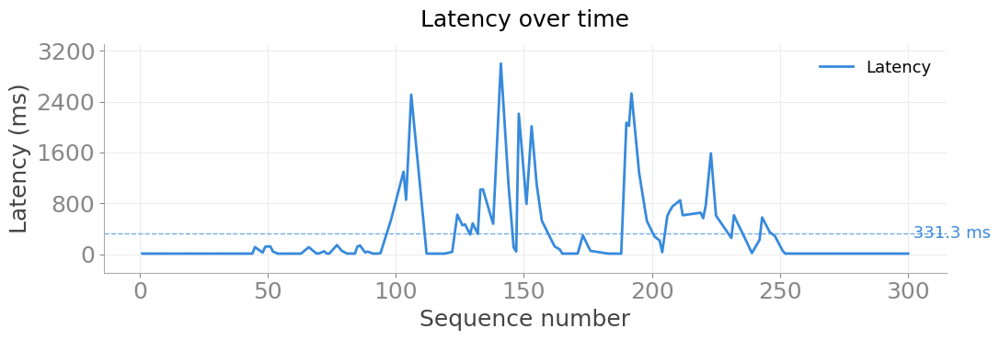

In [66]:
import os, re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

BASE_DIRS = ["../crossfire", "./onelinecrossfire", "."]

PING_RE = re.compile(r"icmp_seq=(\d+).*?time=([\d.]+)\s+ms")

plt.style.use("default")

plt.rcParams.update({
    "figure.facecolor":   "white",
    "axes.facecolor":     "white",
    "axes.grid":          True,
    "grid.color":         "#e8e8e8",
    "grid.linewidth":     0.6,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.spines.left":   True,
    "axes.spines.bottom": True,
    "axes.edgecolor":     "#aaaaaa",
    "axes.linewidth":     0.8,
    "xtick.color":        "#888888",
    "ytick.color":        "#888888",
    "xtick.labelsize":    18,
    "ytick.labelsize":    18,
    "axes.labelsize":     18,
    "axes.labelcolor":    "#444444",
    "axes.titlesize":     18,
    "axes.titleweight":   "normal",
    "axes.titlepad":      14,
    "legend.fontsize":    13,
    "legend.frameon":     False,
    "font.family":        "sans-serif",
})


# ── parsing ────────────────────────────────────────────────────────────────

def parse_ping(path):
    seqs, rtts = [], []
    with open(path, "r", errors="ignore") as f:
        for line in f:
            m = PING_RE.search(line)
            if m:
                seqs.append(int(m.group(1)))
                rtts.append(float(m.group(2)))
    return np.array(seqs), np.array(rtts)


def collect_files():
    files = []

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue
        print(f"Scanning: {base}")
        for f in sorted(os.listdir(base)):
            if "rtt" not in f.lower():
                continue
            files.append(os.path.join(base, f))

    print(f"  Found: {len(files)} file(s)")
    for f in files:
        print(f"    {f}")
    return files


def average_files(files, n=300):
    all_series = []

    for f in sorted(files):
        seqs, rtts = parse_ping(f)
        if len(seqs) < 2:
            print(f"  Skipped (too few points): {f}")
            continue
        all_series.append((seqs, rtts))

    if not all_series:
        return None, None

    t_common = np.linspace(
        min(s[0][0]  for s in all_series),
        max(s[0][-1] for s in all_series),
        n
    )

    interped = [np.interp(t_common, seqs, rtts) for seqs, rtts in all_series]
    mean     = np.mean(np.array(interped), axis=0)
    return t_common, mean


# ── plotting ───────────────────────────────────────────────────────────────

def plot_rtt():
    files = collect_files()
    if not files:
        print("No RTT files found.")
        return

    t, mean = average_files(files)
    if mean is None:
        print("No valid data.")
        return

    mean_val = float(np.mean(mean))

    fig, ax = plt.subplots(figsize=(11, 3.8))

    ax.plot(t, mean, linewidth=2, color="#378ADD", label="Latency")
    ax.axhline(mean_val, color="#378ADD", linewidth=1.0,
               linestyle="--", alpha=0.7)
    ax.text(t[-1], mean_val, f" {mean_val:.1f} ms",
            color="#378ADD", va="center", fontsize=13)

    mn, mx = mean.min(), mean.max()
    pad = (mx - mn) * 0.1 or 0.5
    ax.set_ylim(mn - pad, mx + pad)

    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=5))
    ax.set_xlabel("Sequence number")
    ax.set_ylabel("Latency (ms)")
    ax.set_title("Latency over time")
    ax.legend(loc="upper right")

    plt.tight_layout()
    plt.savefig("rtt.png", dpi=150, bbox_inches="tight")
    plt.show()


# ── run ────────────────────────────────────────────────────────────────────

plot_rtt()


Folder: test_rrm_jafarian
RTT files found: 3
  test1_rtt_h33.txt
    samples: 245
    avg RTT: 199.527 ms
    min RTT: 101.000 ms
    max RTT: 2026.000 ms
  test2_rtt_h2.txt
    samples: 251
    avg RTT: 217.964 ms
    min RTT: 102.000 ms
    max RTT: 3296.000 ms
  test33_rtt_h2.txt
    samples: 241
    avg RTT: 1215.021 ms
    min RTT: 113.000 ms
    max RTT: 12063.000 ms
[SAVED] ./rtt_plots/test_rrm_jafarian_rtt.png


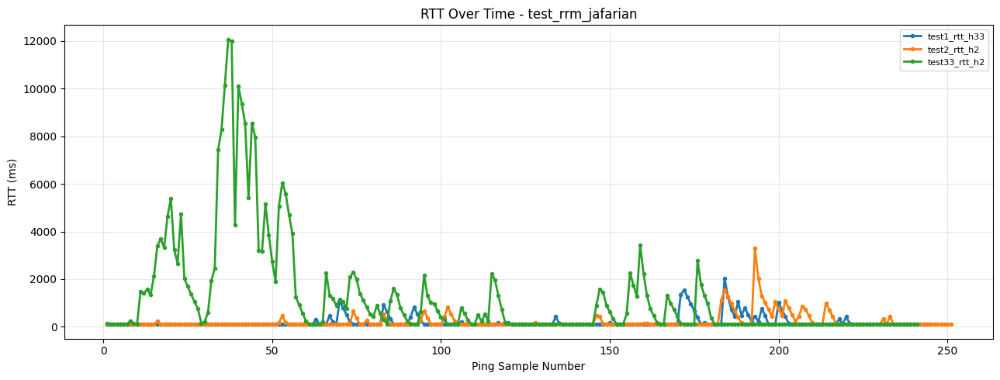


Folder: random
RTT files found: 6
  test1_rtt_h2.txt
    samples: 247
    avg RTT: 1846.968 ms
    min RTT: 103.000 ms
    max RTT: 20857.000 ms
  test1_rtt_h33.txt
    samples: 217
    avg RTT: 1357.065 ms
    min RTT: 102.000 ms
    max RTT: 20784.000 ms
  test2_rtt_h2.txt
    samples: 231
    avg RTT: 775.035 ms
    min RTT: 102.000 ms
    max RTT: 5090.000 ms
  test2_rtt_h33.txt
    samples: 224
    avg RTT: 826.170 ms
    min RTT: 103.000 ms
    max RTT: 6295.000 ms
  test33_rtt_h2.txt
    samples: 215
    avg RTT: 1204.079 ms
    min RTT: 143.000 ms
    max RTT: 7768.000 ms
  test3_rtt_h33.txt
    samples: 217
    avg RTT: 1215.839 ms
    min RTT: 102.000 ms
    max RTT: 7895.000 ms
[SAVED] ./rtt_plots/random_rtt.png


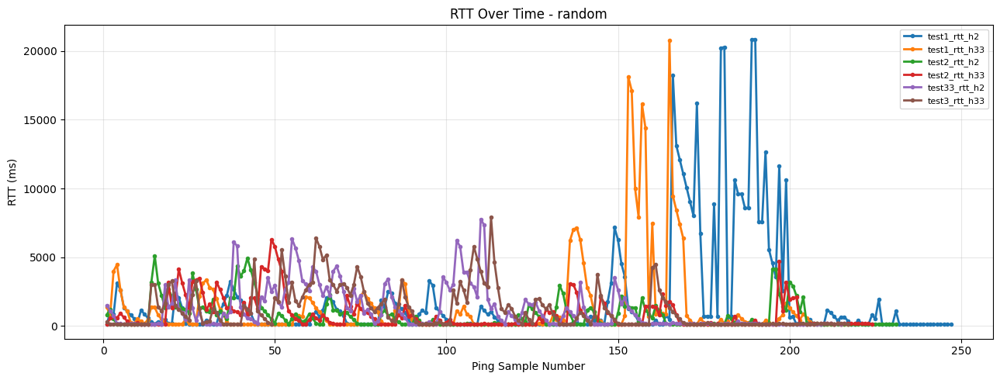


Folder: lfadefender
RTT files found: 2
  h21_to_h15_rtt.txt
    samples: 195
    avg RTT: 446.631 ms
    min RTT: 102.000 ms
    max RTT: 3340.000 ms
  h2tto_h22_rtt.txt
    samples: 216
    avg RTT: 361.505 ms
    min RTT: 102.000 ms
    max RTT: 3296.000 ms
[SAVED] ./rtt_plots/lfadefender_rtt.png


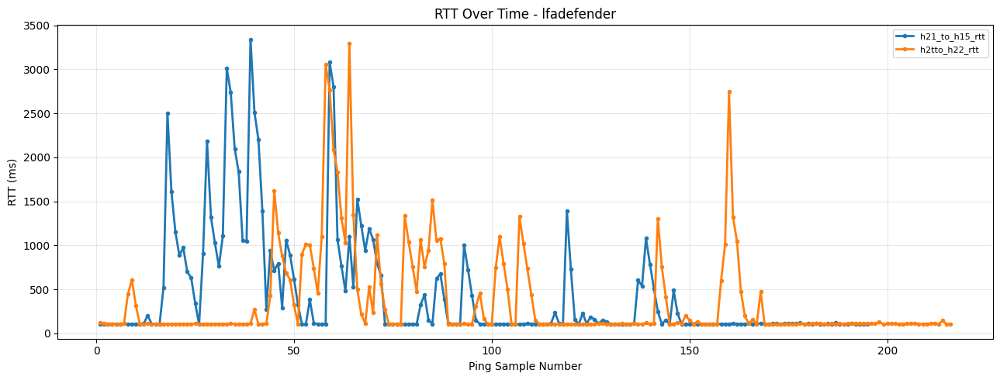


Folder: test_mymtd_route
RTT files found: 4
  rtt_h2.txt
    samples: 96
    avg RTT: 632.542 ms
    min RTT: 102.000 ms
    max RTT: 4830.000 ms
  test1_rtt.txt
    samples: 100
    avg RTT: 707.710 ms
    min RTT: 102.000 ms
    max RTT: 4878.000 ms
  test2_rtt_h2.txt
    samples: 100
    avg RTT: 1324.880 ms
    min RTT: 124.000 ms
    max RTT: 5473.000 ms
  test2_rtt_h33.txt
    samples: 100
    avg RTT: 1338.390 ms
    min RTT: 123.000 ms
    max RTT: 5553.000 ms
[SAVED] ./rtt_plots/test_mymtd_route_rtt.png


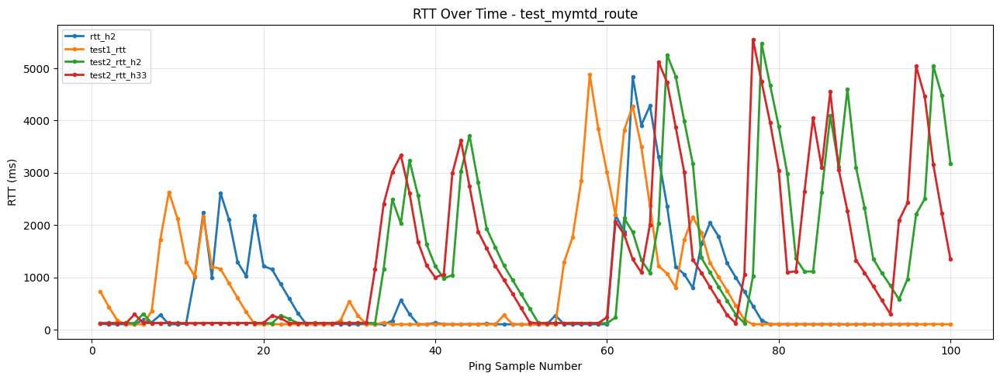

In [16]:
# import os
# import re
# import numpy as np
# import matplotlib.pyplot as plt

# BASE_ROOT = "../logs_generated"

# FOLDERS = [
#     "test_rrm_jafarian",
#     "random",
#     "lfadefender",
#     "test_mymtd_route",
# ]

# OUT_DIR = "./rtt_plots"
# os.makedirs(OUT_DIR, exist_ok=True)

# # Matches ping lines like:
# # 64 bytes from 10.0.0.2: icmp_seq=1 ttl=64 time=1.23 ms
# RTT_RE = re.compile(r"time[=<]([\d.]+)\s*ms", re.IGNORECASE)

# def parse_rtt_file(path):
#     rtts = []

#     with open(path, "r", errors="ignore") as f:
#         for line in f:
#             m = RTT_RE.search(line)
#             if m:
#                 rtts.append(float(m.group(1)))

#     return np.array(rtts)

# def collect_rtt_files(folder_path):
#     files = []

#     if not os.path.isdir(folder_path):
#         print("[WARN] Folder not found:", folder_path)
#         return files

#     for f in os.listdir(folder_path):
#         fname = f.lower()

#         if not fname.endswith(".txt"):
#             continue

#         # Accept likely RTT/ping files
#         if "rtt" in fname or "ping" in fname:
#             files.append(os.path.join(folder_path, f))

#     return sorted(files)

# def plot_folder_rtt(folder_name):
#     folder_path = os.path.join(BASE_ROOT, folder_name)
#     files = collect_rtt_files(folder_path)

#     print(f"\nFolder: {folder_name}")
#     print(f"RTT files found: {len(files)}")

#     if not files:
#         return

#     plt.figure(figsize=(13, 5))

#     plotted = False

#     for path in files:
#         rtts = parse_rtt_file(path)

#         if len(rtts) == 0:
#             print("[SKIP] No RTT found:", os.path.basename(path))
#             continue

#         x = np.arange(1, len(rtts) + 1)
#         label = os.path.basename(path).replace(".txt", "")

#         plt.plot(x, rtts, linewidth=2, marker="o", markersize=3, label=label)

#         print(f"  {os.path.basename(path)}")
#         print(f"    samples: {len(rtts)}")
#         print(f"    avg RTT: {np.mean(rtts):.3f} ms")
#         print(f"    min RTT: {np.min(rtts):.3f} ms")
#         print(f"    max RTT: {np.max(rtts):.3f} ms")

#         plotted = True

#     if not plotted:
#         print("[WARN] No valid RTT data plotted for:", folder_name)
#         return

#     plt.title(f"RTT Over Time - {folder_name}")
#     plt.xlabel("Ping Sample Number")
#     plt.ylabel("RTT (ms)")
#     plt.grid(alpha=0.3)
#     plt.legend(fontsize=8)
#     plt.tight_layout()

#     out_path = os.path.join(OUT_DIR, f"{folder_name}_rtt.png")
#     plt.savefig(out_path, dpi=300, bbox_inches="tight")
#     print("[SAVED]", out_path)

#     plt.show()

# for folder in FOLDERS:
#     plot_folder_rtt(folder)


Folder: test_rrm_jafarian | Files: 3
Avg RTT (test_rrm_jafarian): 544.107 ms

Folder: random | Files: 6
Avg RTT (random): 1204.782 ms

Folder: lfadefender | Files: 2
Avg RTT (lfadefender): 404.067 ms

Folder: test_mymtd_route | Files: 4
Avg RTT (test_mymtd_route): 1000.916 ms

[SAVED] ./rtt_plots/rtt_all_groups.png


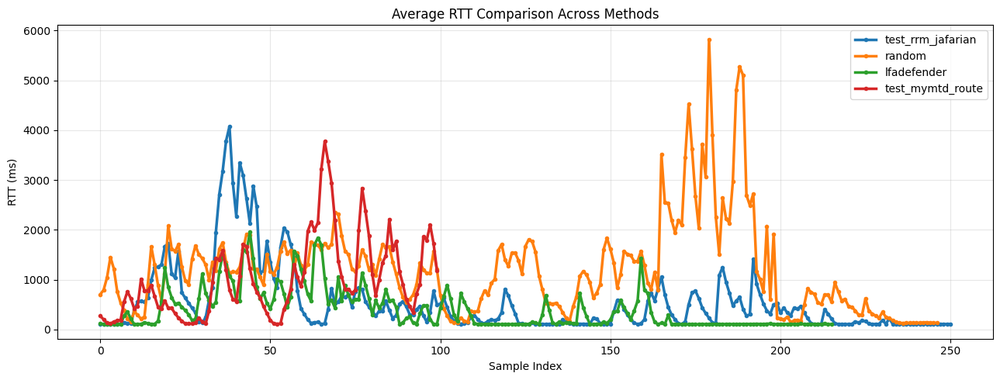

In [17]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

BASE_ROOT = "../logs_generated"

FOLDERS = [
    "test_rrm_jafarian",
    "random",
    "lfadefender",
    "test_mymtd_route",
]

OUT_DIR = "./rtt_plots"
os.makedirs(OUT_DIR, exist_ok=True)

RTT_RE = re.compile(r"time[=<]([\d.]+)\s*ms", re.IGNORECASE)

# -------------------------------------------------
# Parse RTT
# -------------------------------------------------
def parse_rtt_file(path):
    rtts = []
    with open(path, "r", errors="ignore") as f:
        for line in f:
            m = RTT_RE.search(line)
            if m:
                rtts.append(float(m.group(1)))
    return np.array(rtts)

# -------------------------------------------------
# Collect RTT files
# -------------------------------------------------
def collect_rtt_files(folder_path):
    files = []
    if not os.path.isdir(folder_path):
        print("[WARN] Missing:", folder_path)
        return files

    for f in os.listdir(folder_path):
        fname = f.lower()
        if fname.endswith(".txt") and ("ping" in fname or "rtt" in fname):
            files.append(os.path.join(folder_path, f))

    return sorted(files)

# -------------------------------------------------
# Average per folder
# -------------------------------------------------
def average_folder_rtt(folder_name):
    folder_path = os.path.join(BASE_ROOT, folder_name)
    files = collect_rtt_files(folder_path)

    print(f"\nFolder: {folder_name} | Files: {len(files)}")

    all_series = []
    max_len = 0

    for f in files:
        rtts = parse_rtt_file(f)

        if len(rtts) < 2:
            print("[SKIP]", os.path.basename(f))
            continue

        all_series.append(rtts)
        max_len = max(max_len, len(rtts))

    if not all_series:
        return None, None

    # interpolate to same length
    x_common = np.linspace(0, max_len - 1, max_len)

    interp_series = []
    for rtts in all_series:
        x_old = np.linspace(0, max_len - 1, len(rtts))
        interp = np.interp(x_common, x_old, rtts)
        interp_series.append(interp)

    avg_rtt = np.mean(np.array(interp_series), axis=0)

    print(f"Avg RTT ({folder_name}): {np.mean(avg_rtt):.3f} ms")

    return x_common, avg_rtt

# -------------------------------------------------
# Plot ALL folders together
# -------------------------------------------------
plt.figure(figsize=(13, 5))

for folder in FOLDERS:
    x, avg = average_folder_rtt(folder)

    if avg is None:
        continue

    plt.plot(
        x,
        avg,
        linewidth=2.5,
        marker="o",
        markersize=3,
        label=folder
    )

plt.title("Average RTT Comparison Across Methods")
plt.xlabel("Sample Index")
plt.ylabel("RTT (ms)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

out_path = os.path.join(OUT_DIR, "rtt_all_groups.png")
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print("\n[SAVED]", out_path)

plt.show()


Folder: test_rrm_jafarian | Files: 3
Avg Delay (test_rrm_jafarian): 544.107 ms

Folder: random | Files: 6
Avg Delay (random): 1204.782 ms

Folder: lfadefender | Files: 2
Avg Delay (lfadefender): 404.067 ms

Folder: test_mymtd_route | Files: 4
Avg Delay (test_mymtd_route): 1000.916 ms

[SAVED] ./delay_plots/delay_all_groups.png


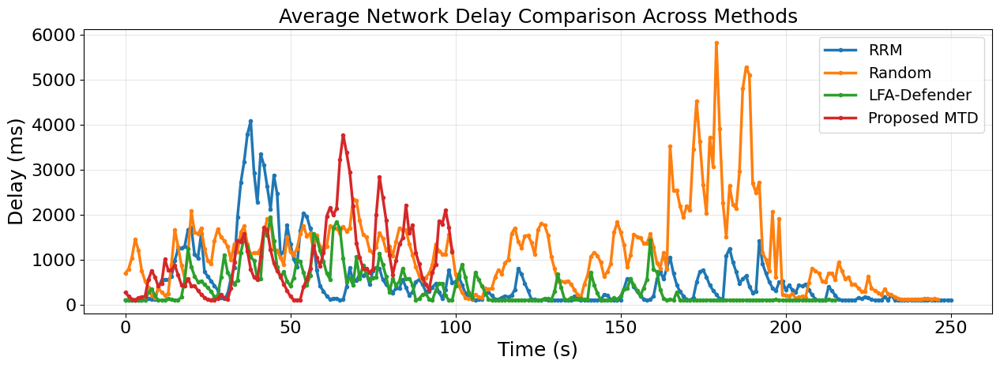

In [18]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")
plt.rcParams.update({"font.size": 18})

BASE_ROOT = "../logs_generated"

FOLDERS = [
    "test_rrm_jafarian",
    "random",
    "lfadefender",
    "test_mymtd_route",
]

FOLDER_LABELS = {
    "test_rrm_jafarian": "RRM",
    "random": "Random",
    "lfadefender": "LFA-Defender",
    "test_mymtd_route": "Proposed MTD",
}

OUT_DIR = "./delay_plots"
os.makedirs(OUT_DIR, exist_ok=True)

DELAY_RE = re.compile(r"time[=<]([\d.]+)\s*ms", re.IGNORECASE)

def parse_delay_file(path):
    vals = []
    with open(path, "r", errors="ignore") as f:
        for line in f:
            m = DELAY_RE.search(line)
            if m:
                vals.append(float(m.group(1)))
    return np.array(vals)

def collect_delay_files(folder_path):
    if not os.path.isdir(folder_path):
        print("[WARN] Missing:", folder_path)
        return []

    return sorted([
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if f.lower().endswith(".txt")
        and ("ping" in f.lower() or "rtt" in f.lower() or "delay" in f.lower())
    ])

def average_folder_delay(folder):
    folder_path = os.path.join(BASE_ROOT, folder)
    files = collect_delay_files(folder_path)

    print(f"\nFolder: {folder} | Files: {len(files)}")

    series = []
    max_len = 0

    for path in files:
        delay = parse_delay_file(path)

        if len(delay) < 2:
            print("[SKIP]", os.path.basename(path))
            continue

        series.append(delay)
        max_len = max(max_len, len(delay))

    if not series:
        return None, None

    x_common = np.linspace(0, max_len - 1, max_len)

    aligned = []
    for delay in series:
        x_old = np.linspace(0, max_len - 1, len(delay))
        aligned.append(np.interp(x_common, x_old, delay))

    avg_delay = np.mean(np.array(aligned), axis=0)

    print(f"Avg Delay ({folder}): {np.mean(avg_delay):.3f} ms")

    return x_common, avg_delay

plt.figure(figsize=(13, 5))

for folder in FOLDERS:
    x, avg = average_folder_delay(folder)

    if avg is None:
        continue

    plt.plot(
        x,
        avg,
        linewidth=2.5,
        marker="o",
        markersize=3,
        label=FOLDER_LABELS.get(folder, folder)
    )

plt.title("Average Network Delay Comparison Across Methods", fontsize=18)
plt.xlabel("Time (s)", fontsize=18)
plt.ylabel("Delay (ms)", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(alpha=0.3)
plt.legend(fontsize=14)
plt.tight_layout()

out_path = os.path.join(OUT_DIR, "delay_all_groups.png")
# plt.savefig(out_path, dpi=300, bbox_inches="tight")
print("\n[SAVED]", out_path)

plt.show()

Scanning: ../logs_generated/test_rrm_jafarian

================ QoS Summary ================

With MTD
  Avg Throughput (% of 10 Mbps): 65.87%
  Avg Jitter (ms):              7.1338 ms
  Avg Packet Loss (%):          5.04%

Without MTD: No valid data
Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


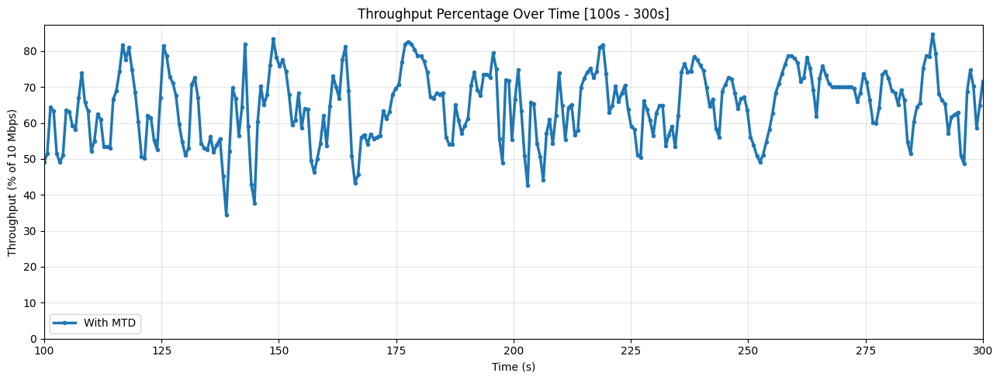

Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


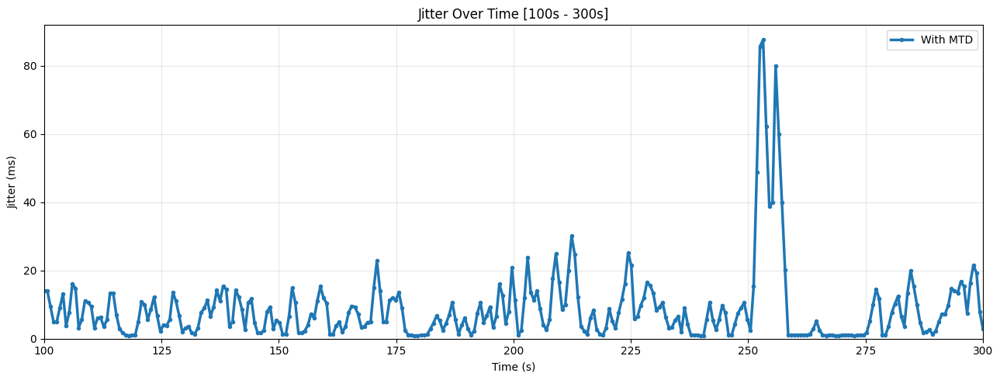

Scanning: ../logs_generated/test_rrm_jafarian

Detected files:
With MTD: 6 files
Without MTD: 0 files
No valid data: Without MTD


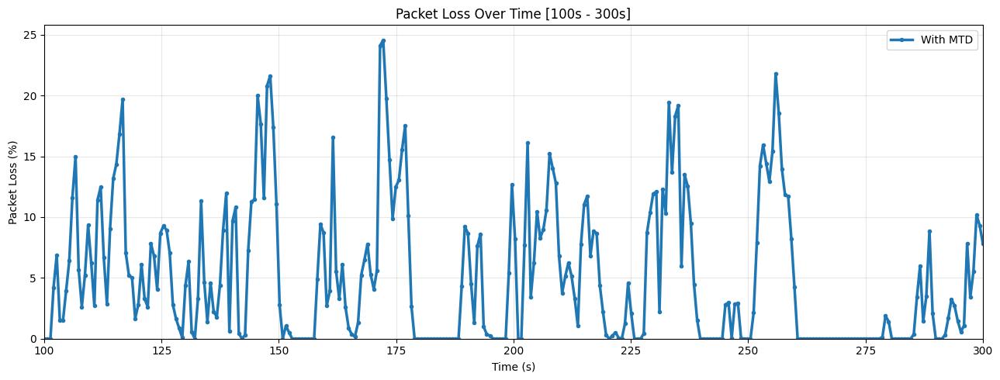

In [7]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# ============================================================
# CONFIG
# ============================================================

BASE_DIRS = ["../logs_generated/test_rrm_jafarian"]

START_TIME = 100
END_TIME = 300

# Expected UDP bandwidth used in iperf3, e.g., -b 10M
TARGET_BW_MBPS = 10.0

# Save plots?
SAVE_FIGS = True
OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ============================================================
# iperf3 UDP interval regex
# Example:
# [  5]   1.00-2.00   sec  1.19 MBytes  9.98 Mbits/sec  0.123 ms  0/850 (0%)
# ============================================================

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# ============================================================
# Parse one iperf txt file
# ============================================================

def parse_file(path):
    times = []
    bitrates_mbps = []
    throughput_pct = []
    jitters_ms = []
    losses_pct = []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end = float(m.group(2))

        # Skip summary rows such as 0.00-300.00 sec
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit = m.group(4)
        jitter = float(m.group(5))
        lost = int(m.group(6))
        total = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert bitrate to Mbps
        if unit == "K":
            bitrate_mbps = bitrate / 1000.0
        elif unit == "G":
            bitrate_mbps = bitrate * 1000.0
        else:
            bitrate_mbps = bitrate

        if total <= 0:
            continue

        if loss_pct < 0 or loss_pct > 100:
            continue

        # Throughput percentage out of 10 Mbps
        thr_pct = (bitrate_mbps / TARGET_BW_MBPS) * 100.0

        times.append((t_start + t_end) / 2.0)
        bitrates_mbps.append(bitrate_mbps)
        throughput_pct.append(thr_pct)
        jitters_ms.append(jitter)
        losses_pct.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates_mbps),
        np.array(throughput_pct),
        np.array(jitters_ms),
        np.array(losses_pct)
    )

# ============================================================
# Detect MTD and no-MTD files
# ============================================================

def collect_mtd_groups():
    groups = {
        "With MTD": [],
        "Without MTD": []
    }

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            print(f"[WARN] Folder not found: {base}")
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            if "_no_mtd" in fname:
                groups["Without MTD"].append(full)

            elif "_mtd" in fname:
                groups["With MTD"].append(full)

    return groups

# ============================================================
# Average group over common time axis
# ============================================================

def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

        if len(times) < 2:
            print("[SKIP] Not enough valid samples:", f)
            continue

        if metric == "throughput_mbps":
            vals = bitrates_mbps
        elif metric == "throughput_pct":
            vals = throughput_pct
        elif metric == "jitter":
            vals = jitters_ms
        elif metric == "loss":
            vals = losses_pct
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            print("[SKIP] Not enough samples in selected range:", f)
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# ============================================================
# QoS summary
# ============================================================

def summarize_qos(groups, start_time, end_time):
    print("\n================ QoS Summary ================")

    for group_name, files in groups.items():
        all_thr_pct = []
        all_jitter = []
        all_loss = []

        for f in files:
            times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

            if len(times) == 0:
                continue

            mask = (times >= start_time) & (times <= end_time)

            if mask.sum() == 0:
                continue

            all_thr_pct.extend(throughput_pct[mask])
            all_jitter.extend(jitters_ms[mask])
            all_loss.extend(losses_pct[mask])

        if not all_thr_pct:
            print(f"\n{group_name}: No valid data")
            continue

        print(f"\n{group_name}")
        print(f"  Avg Throughput (% of 10 Mbps): {np.mean(all_thr_pct):.2f}%")
        print(f"  Avg Jitter (ms):              {np.mean(all_jitter):.4f} ms")
        print(f"  Avg Packet Loss (%):          {np.mean(all_loss):.2f}%")

# ============================================================
# Plot function
# ============================================================

def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput_pct": (
            "Throughput Percentage Over Time",
            "Throughput (% of 10 Mbps)",
            "throughput_percent"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)",
            "jitter_ms"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)",
            "packet_loss_percent"
        ),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # if SAVE_FIGS:
    #     out_path = os.path.join(OUT_DIR, f"{fname}_{start_time}_{end_time}.png")
    #     plt.savefig(out_path, dpi=300, bbox_inches="tight")
    #     print(f"[SAVED] {out_path}")

    plt.show()

# ============================================================
# Run
# ============================================================

groups = collect_mtd_groups()
summarize_qos(groups, START_TIME, END_TIME)

plot_mtd_vs_no_mtd("throughput_pct", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

In [10]:
ls ../logs_generated/lfadefender | grep -i qos

tes3_qos_udp_h15_rcv.txt
tes4_fair_qos_udp_h15_rcv.txt
test1_qos_udp_h15_rcv.txt
test1_qos_udp_h39_rcv.txt
test2_qos_udp_h15_rcv.txt
test2_qos_udp_h22_rcv.txt
test3_qos_udp_h39_rcv.txt
test4_fair_qos_udp_h39_rcv.txt


Scanning: ../logs_generated/lfadefender

================ QoS Summary ================

QoS
  Avg Throughput (% of 10 Mbps): 52.24%
  Avg Jitter (ms):              7.3362 ms
  Avg Packet Loss (%):          19.03%
Scanning: ../logs_generated/lfadefender

Detected files:
QoS: 8 files


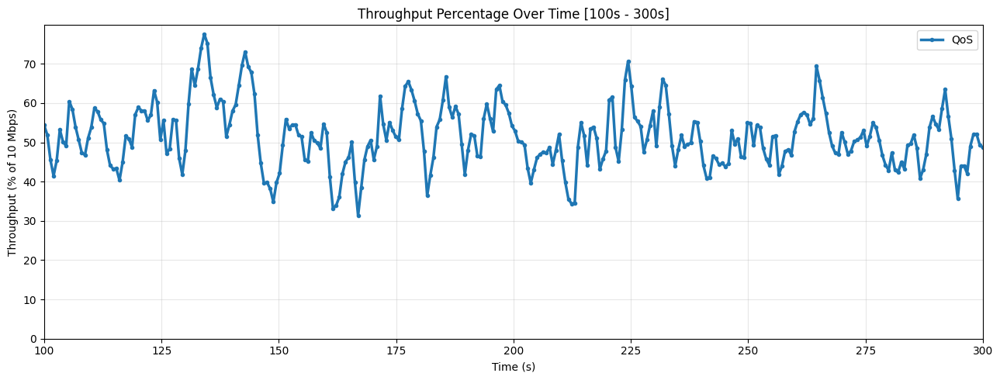

Scanning: ../logs_generated/lfadefender

Detected files:
QoS: 8 files


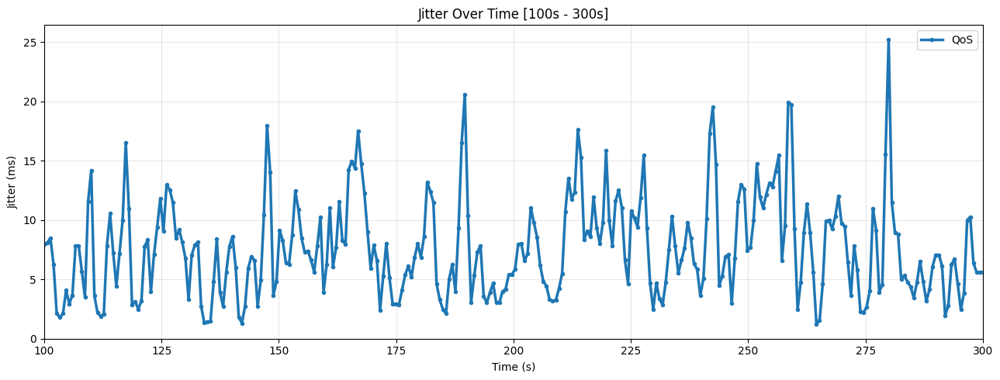

Scanning: ../logs_generated/lfadefender

Detected files:
QoS: 8 files


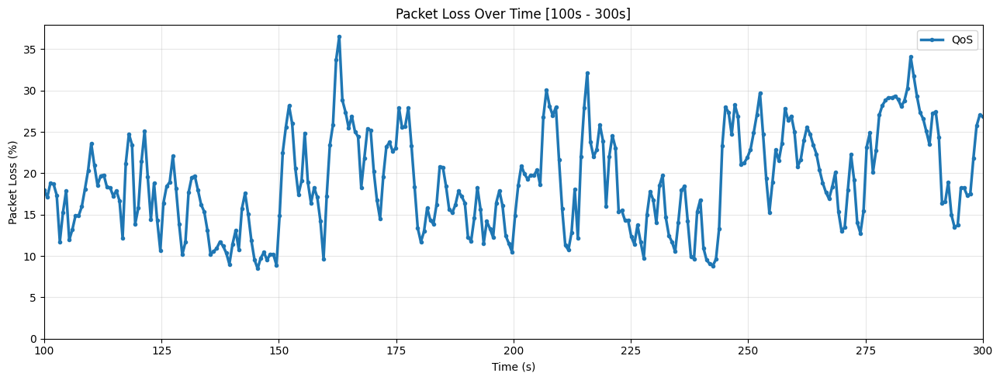

In [13]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# ============================================================
# CONFIG
# ============================================================

BASE_DIRS = ["../logs_generated/lfadefender"]

START_TIME = 100
END_TIME = 300

# Expected UDP bandwidth used in iperf3, e.g., -b 10M
TARGET_BW_MBPS = 10.0

# Save plots?
SAVE_FIGS = True
OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ============================================================
# iperf3 UDP interval regex
# Example:
# [  5]   1.00-2.00   sec  1.19 MBytes  9.98 Mbits/sec  0.123 ms  0/850 (0%)
# ============================================================

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# ============================================================
# Parse one iperf txt file
# ============================================================

def parse_file(path):
    times = []
    bitrates_mbps = []
    throughput_pct = []
    jitters_ms = []
    losses_pct = []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end = float(m.group(2))

        # Skip summary rows such as 0.00-300.00 sec
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit = m.group(4)
        jitter = float(m.group(5))
        lost = int(m.group(6))
        total = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert bitrate to Mbps
        if unit == "K":
            bitrate_mbps = bitrate / 1000.0
        elif unit == "G":
            bitrate_mbps = bitrate * 1000.0
        else:
            bitrate_mbps = bitrate

        if total <= 0:
            continue

        if loss_pct < 0 or loss_pct > 100:
            continue

        # Throughput percentage out of 10 Mbps
        thr_pct = (bitrate_mbps / TARGET_BW_MBPS) * 100.0

        times.append((t_start + t_end) / 2.0)
        bitrates_mbps.append(bitrate_mbps)
        throughput_pct.append(thr_pct)
        jitters_ms.append(jitter)
        losses_pct.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates_mbps),
        np.array(throughput_pct),
        np.array(jitters_ms),
        np.array(losses_pct)
    )

# ============================================================
# Detect MTD and no-MTD files
# ============================================================

# def collect_mtd_groups():
#     groups = {
#         "With MTD": [],
#         "Without MTD": []
#     }

#     for base in BASE_DIRS:
#         if not os.path.isdir(base):
#             print(f"[WARN] Folder not found: {base}")
#             continue

#         print("Scanning:", base)

#         for f in os.listdir(base):
#             fname = f.lower()

#             if not fname.endswith(".txt"):
#                 continue

#             if "qos" not in fname:
#                 continue

#             full = os.path.join(base, f)

#             # if "_no_mtd" in fname:
#             #     groups["Without MTD"].append(full)

#             # elif "_mtd" in fname:
#             #     groups["With MTD"].append(full)
#             groups["QoS"].append(full)

#     return groups
def collect_mtd_groups():
    groups = {
        "QoS": []
    }

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            groups["QoS"].append(full)

    return groups

# ============================================================
# Average group over common time axis
# ============================================================

def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

        if len(times) < 2:
            print("[SKIP] Not enough valid samples:", f)
            continue

        if metric == "throughput_mbps":
            vals = bitrates_mbps
        elif metric == "throughput_pct":
            vals = throughput_pct
        elif metric == "jitter":
            vals = jitters_ms
        elif metric == "loss":
            vals = losses_pct
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            print("[SKIP] Not enough samples in selected range:", f)
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# ============================================================
# QoS summary
# ============================================================

def summarize_qos(groups, start_time, end_time):
    print("\n================ QoS Summary ================")

    for group_name, files in groups.items():
        all_thr_pct = []
        all_jitter = []
        all_loss = []

        for f in files:
            times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

            if len(times) == 0:
                continue

            mask = (times >= start_time) & (times <= end_time)

            if mask.sum() == 0:
                continue

            all_thr_pct.extend(throughput_pct[mask])
            all_jitter.extend(jitters_ms[mask])
            all_loss.extend(losses_pct[mask])

        if not all_thr_pct:
            print(f"\n{group_name}: No valid data")
            continue

        print(f"\n{group_name}")
        print(f"  Avg Throughput (% of 10 Mbps): {np.mean(all_thr_pct):.2f}%")
        print(f"  Avg Jitter (ms):              {np.mean(all_jitter):.4f} ms")
        print(f"  Avg Packet Loss (%):          {np.mean(all_loss):.2f}%")

# ============================================================
# Plot function
# ============================================================

def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput_pct": (
            "Throughput Percentage Over Time",
            "Throughput (% of 10 Mbps)",
            "throughput_percent"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)",
            "jitter_ms"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)",
            "packet_loss_percent"
        ),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # if SAVE_FIGS:
    #     out_path = os.path.join(OUT_DIR, f"{fname}_{start_time}_{end_time}.png")
    #     plt.savefig(out_path, dpi=300, bbox_inches="tight")
    #     print(f"[SAVED] {out_path}")

    plt.show()

# ============================================================
# Run
# ============================================================

groups = collect_mtd_groups()
summarize_qos(groups, START_TIME, END_TIME)

plot_mtd_vs_no_mtd("throughput_pct", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ../logs_generated/random

================ QoS Summary ================

QoS
  Avg Throughput (% of 10 Mbps): 60.61%
  Avg Jitter (ms):              15.7963 ms
  Avg Packet Loss (%):          12.67%
Scanning: ../logs_generated/random

Detected files:
QoS: 7 files
[SKIP] Not enough valid samples: ../logs_generated/random/tes3_qos_udp_h15_rcv.txt


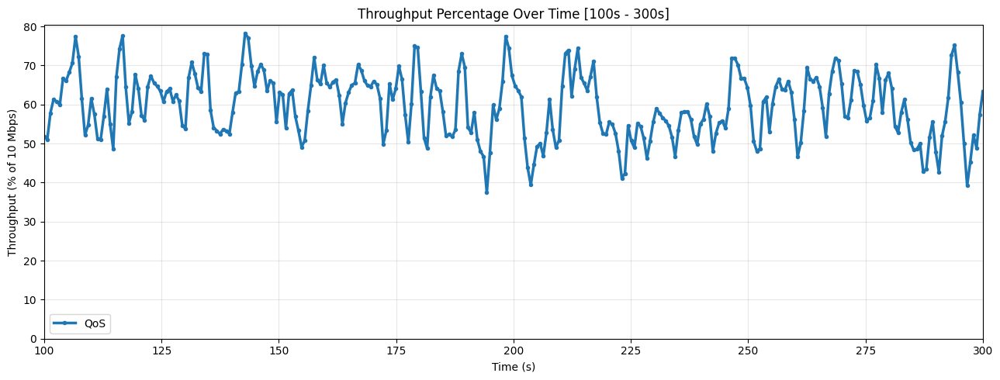

Scanning: ../logs_generated/random

Detected files:
QoS: 7 files
[SKIP] Not enough valid samples: ../logs_generated/random/tes3_qos_udp_h15_rcv.txt


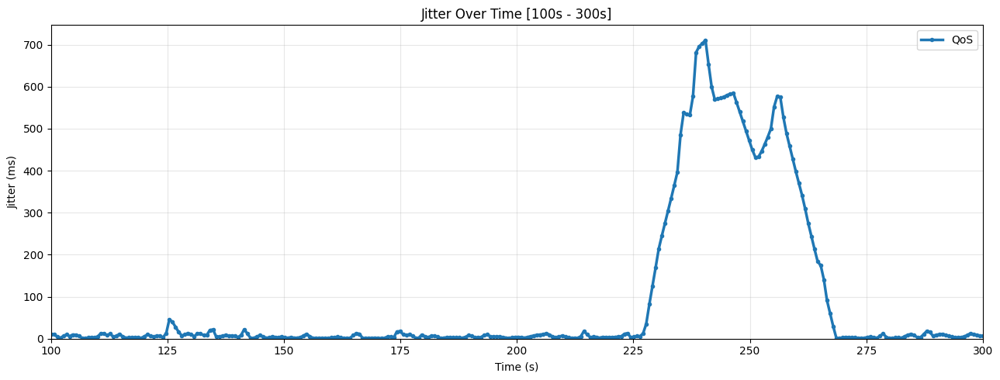

Scanning: ../logs_generated/random

Detected files:
QoS: 7 files
[SKIP] Not enough valid samples: ../logs_generated/random/tes3_qos_udp_h15_rcv.txt


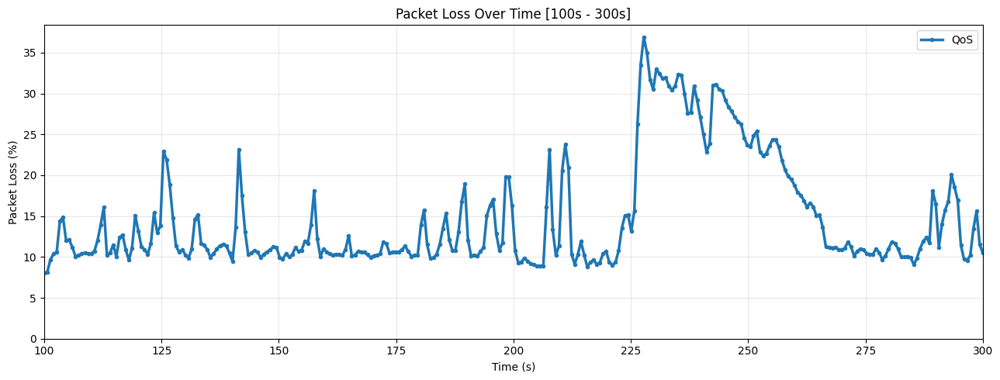

In [14]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# ============================================================
# CONFIG
# ============================================================

BASE_DIRS = ["../logs_generated/random"]

START_TIME = 100
END_TIME = 300

# Expected UDP bandwidth used in iperf3, e.g., -b 10M
TARGET_BW_MBPS = 10.0

# Save plots?
SAVE_FIGS = True
OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ============================================================
# iperf3 UDP interval regex
# Example:
# [  5]   1.00-2.00   sec  1.19 MBytes  9.98 Mbits/sec  0.123 ms  0/850 (0%)
# ============================================================

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# ============================================================
# Parse one iperf txt file
# ============================================================

def parse_file(path):
    times = []
    bitrates_mbps = []
    throughput_pct = []
    jitters_ms = []
    losses_pct = []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end = float(m.group(2))

        # Skip summary rows such as 0.00-300.00 sec
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit = m.group(4)
        jitter = float(m.group(5))
        lost = int(m.group(6))
        total = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert bitrate to Mbps
        if unit == "K":
            bitrate_mbps = bitrate / 1000.0
        elif unit == "G":
            bitrate_mbps = bitrate * 1000.0
        else:
            bitrate_mbps = bitrate

        if total <= 0:
            continue

        if loss_pct < 0 or loss_pct > 100:
            continue

        # Throughput percentage out of 10 Mbps
        thr_pct = (bitrate_mbps / TARGET_BW_MBPS) * 100.0

        times.append((t_start + t_end) / 2.0)
        bitrates_mbps.append(bitrate_mbps)
        throughput_pct.append(thr_pct)
        jitters_ms.append(jitter)
        losses_pct.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates_mbps),
        np.array(throughput_pct),
        np.array(jitters_ms),
        np.array(losses_pct)
    )

# ============================================================
# Detect MTD and no-MTD files
# ============================================================

# def collect_mtd_groups():
#     groups = {
#         "With MTD": [],
#         "Without MTD": []
#     }

#     for base in BASE_DIRS:
#         if not os.path.isdir(base):
#             print(f"[WARN] Folder not found: {base}")
#             continue

#         print("Scanning:", base)

#         for f in os.listdir(base):
#             fname = f.lower()

#             if not fname.endswith(".txt"):
#                 continue

#             if "qos" not in fname:
#                 continue

#             full = os.path.join(base, f)

#             # if "_no_mtd" in fname:
#             #     groups["Without MTD"].append(full)

#             # elif "_mtd" in fname:
#             #     groups["With MTD"].append(full)
#             groups["QoS"].append(full)

#     return groups
def collect_mtd_groups():
    groups = {
        "QoS": []
    }

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            groups["QoS"].append(full)

    return groups

# ============================================================
# Average group over common time axis
# ============================================================

def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

        if len(times) < 2:
            print("[SKIP] Not enough valid samples:", f)
            continue

        if metric == "throughput_mbps":
            vals = bitrates_mbps
        elif metric == "throughput_pct":
            vals = throughput_pct
        elif metric == "jitter":
            vals = jitters_ms
        elif metric == "loss":
            vals = losses_pct
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            print("[SKIP] Not enough samples in selected range:", f)
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# ============================================================
# QoS summary
# ============================================================

def summarize_qos(groups, start_time, end_time):
    print("\n================ QoS Summary ================")

    for group_name, files in groups.items():
        all_thr_pct = []
        all_jitter = []
        all_loss = []

        for f in files:
            times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

            if len(times) == 0:
                continue

            mask = (times >= start_time) & (times <= end_time)

            if mask.sum() == 0:
                continue

            all_thr_pct.extend(throughput_pct[mask])
            all_jitter.extend(jitters_ms[mask])
            all_loss.extend(losses_pct[mask])

        if not all_thr_pct:
            print(f"\n{group_name}: No valid data")
            continue

        print(f"\n{group_name}")
        print(f"  Avg Throughput (% of 10 Mbps): {np.mean(all_thr_pct):.2f}%")
        print(f"  Avg Jitter (ms):              {np.mean(all_jitter):.4f} ms")
        print(f"  Avg Packet Loss (%):          {np.mean(all_loss):.2f}%")

# ============================================================
# Plot function
# ============================================================

def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput_pct": (
            "Throughput Percentage Over Time",
            "Throughput (% of 10 Mbps)",
            "throughput_percent"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)",
            "jitter_ms"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)",
            "packet_loss_percent"
        ),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # if SAVE_FIGS:
    #     out_path = os.path.join(OUT_DIR, f"{fname}_{start_time}_{end_time}.png")
    #     plt.savefig(out_path, dpi=300, bbox_inches="tight")
    #     print(f"[SAVED] {out_path}")

    plt.show()

# ============================================================
# Run
# ============================================================

groups = collect_mtd_groups()
summarize_qos(groups, START_TIME, END_TIME)

plot_mtd_vs_no_mtd("throughput_pct", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ../logs_generated/test_mymtd_route

================ QoS Summary ================

QoS
  Avg Throughput (% of 10 Mbps): 65.64%
  Avg Jitter (ms):              4.6849 ms
  Avg Packet Loss (%):          3.20%
Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 4 files


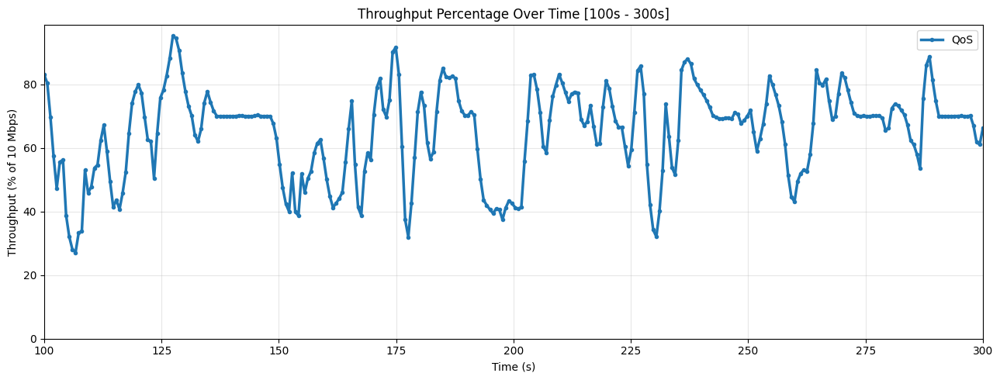

Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 4 files


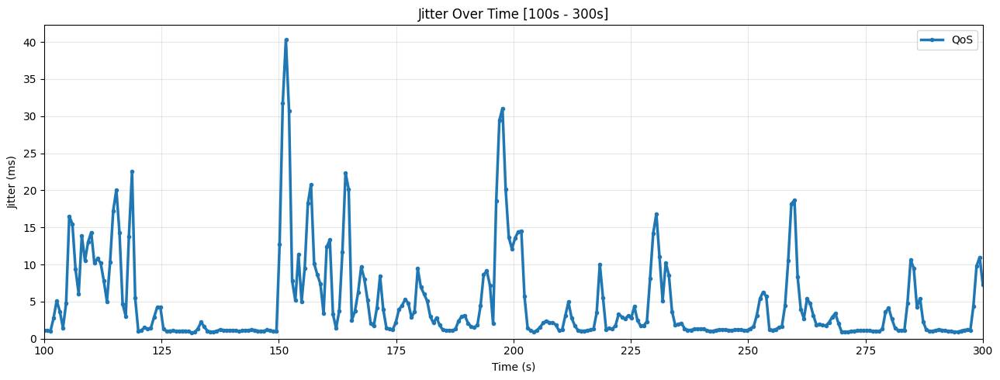

Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 4 files


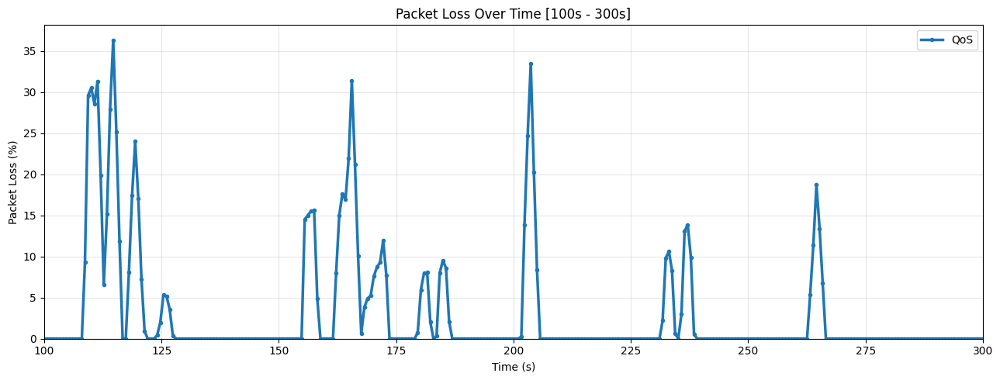

In [15]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# ============================================================
# CONFIG
# ============================================================

BASE_DIRS = ["../logs_generated/test_mymtd_route"]

START_TIME = 100
END_TIME = 300

# Expected UDP bandwidth used in iperf3, e.g., -b 10M
TARGET_BW_MBPS = 10.0

# Save plots?
SAVE_FIGS = True
OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ============================================================
# iperf3 UDP interval regex
# Example:
# [  5]   1.00-2.00   sec  1.19 MBytes  9.98 Mbits/sec  0.123 ms  0/850 (0%)
# ============================================================

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# ============================================================
# Parse one iperf txt file
# ============================================================

def parse_file(path):
    times = []
    bitrates_mbps = []
    throughput_pct = []
    jitters_ms = []
    losses_pct = []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end = float(m.group(2))

        # Skip summary rows such as 0.00-300.00 sec
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit = m.group(4)
        jitter = float(m.group(5))
        lost = int(m.group(6))
        total = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert bitrate to Mbps
        if unit == "K":
            bitrate_mbps = bitrate / 1000.0
        elif unit == "G":
            bitrate_mbps = bitrate * 1000.0
        else:
            bitrate_mbps = bitrate

        if total <= 0:
            continue

        if loss_pct < 0 or loss_pct > 100:
            continue

        # Throughput percentage out of 10 Mbps
        thr_pct = (bitrate_mbps / TARGET_BW_MBPS) * 100.0

        times.append((t_start + t_end) / 2.0)
        bitrates_mbps.append(bitrate_mbps)
        throughput_pct.append(thr_pct)
        jitters_ms.append(jitter)
        losses_pct.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates_mbps),
        np.array(throughput_pct),
        np.array(jitters_ms),
        np.array(losses_pct)
    )

# ============================================================
# Detect MTD and no-MTD files
# ============================================================

# def collect_mtd_groups():
#     groups = {
#         "With MTD": [],
#         "Without MTD": []
#     }

#     for base in BASE_DIRS:
#         if not os.path.isdir(base):
#             print(f"[WARN] Folder not found: {base}")
#             continue

#         print("Scanning:", base)

#         for f in os.listdir(base):
#             fname = f.lower()

#             if not fname.endswith(".txt"):
#                 continue

#             if "qos" not in fname:
#                 continue

#             full = os.path.join(base, f)

#             # if "_no_mtd" in fname:
#             #     groups["Without MTD"].append(full)

#             # elif "_mtd" in fname:
#             #     groups["With MTD"].append(full)
#             groups["QoS"].append(full)

#     return groups
def collect_mtd_groups():
    groups = {
        "QoS": []
    }

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            groups["QoS"].append(full)

    return groups

# ============================================================
# Average group over common time axis
# ============================================================

def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

        if len(times) < 2:
            print("[SKIP] Not enough valid samples:", f)
            continue

        if metric == "throughput_mbps":
            vals = bitrates_mbps
        elif metric == "throughput_pct":
            vals = throughput_pct
        elif metric == "jitter":
            vals = jitters_ms
        elif metric == "loss":
            vals = losses_pct
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            print("[SKIP] Not enough samples in selected range:", f)
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# ============================================================
# QoS summary
# ============================================================

def summarize_qos(groups, start_time, end_time):
    print("\n================ QoS Summary ================")

    for group_name, files in groups.items():
        all_thr_pct = []
        all_jitter = []
        all_loss = []

        for f in files:
            times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

            if len(times) == 0:
                continue

            mask = (times >= start_time) & (times <= end_time)

            if mask.sum() == 0:
                continue

            all_thr_pct.extend(throughput_pct[mask])
            all_jitter.extend(jitters_ms[mask])
            all_loss.extend(losses_pct[mask])

        if not all_thr_pct:
            print(f"\n{group_name}: No valid data")
            continue

        print(f"\n{group_name}")
        print(f"  Avg Throughput (% of 10 Mbps): {np.mean(all_thr_pct):.2f}%")
        print(f"  Avg Jitter (ms):              {np.mean(all_jitter):.4f} ms")
        print(f"  Avg Packet Loss (%):          {np.mean(all_loss):.2f}%")

# ============================================================
# Plot function
# ============================================================

def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput_pct": (
            "Throughput Percentage Over Time",
            "Throughput (% of 10 Mbps)",
            "throughput_percent"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)",
            "jitter_ms"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)",
            "packet_loss_percent"
        ),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # if SAVE_FIGS:
    #     out_path = os.path.join(OUT_DIR, f"{fname}_{start_time}_{end_time}.png")
    #     plt.savefig(out_path, dpi=300, bbox_inches="tight")
    #     print(f"[SAVED] {out_path}")

    plt.show()

# ============================================================
# Run
# ============================================================

groups = collect_mtd_groups()
summarize_qos(groups, START_TIME, END_TIME)

plot_mtd_vs_no_mtd("throughput_pct", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)

Scanning: ../logs_generated/test_mymtd_route

================ QoS Summary ================

QoS
  Avg Throughput (% of 10 Mbps): 62.45%
  Avg Jitter (ms):              2.2986 ms
  Avg Packet Loss (%):          11.48%
Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 6 files


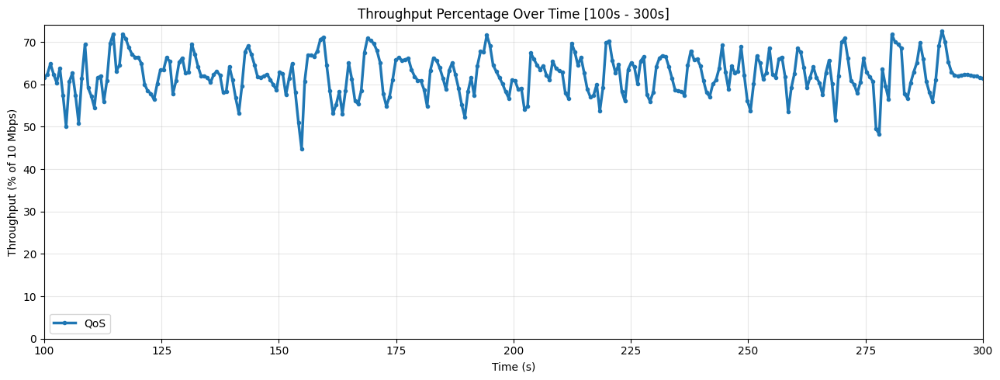

Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 6 files


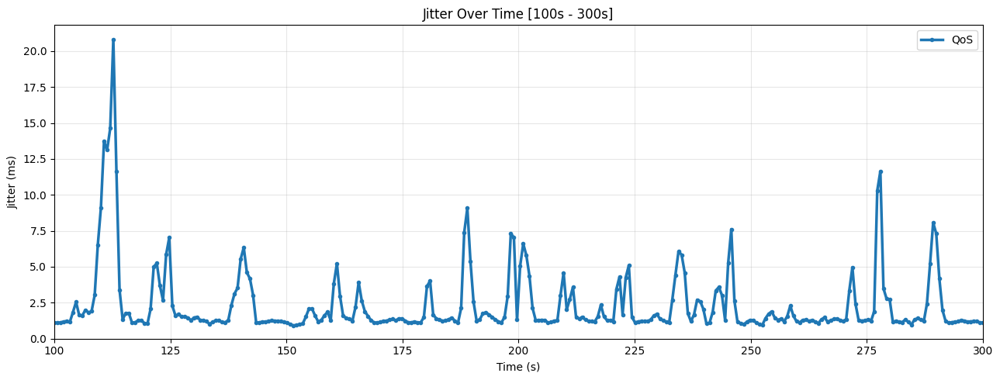

Scanning: ../logs_generated/test_mymtd_route

Detected files:
QoS: 6 files


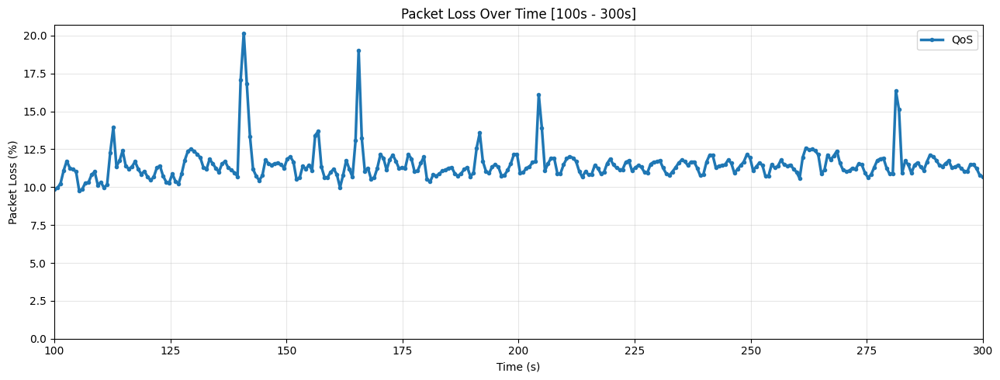

In [24]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")

# ============================================================
# CONFIG
# ============================================================

BASE_DIRS = ["../logs_generated/test_mymtd_route"]

START_TIME = 100
END_TIME = 300

# Expected UDP bandwidth used in iperf3, e.g., -b 10M
TARGET_BW_MBPS = 10.0

# Save plots?
SAVE_FIGS = True
OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ============================================================
# iperf3 UDP interval regex
# Example:
# [  5]   1.00-2.00   sec  1.19 MBytes  9.98 Mbits/sec  0.123 ms  0/850 (0%)
# ============================================================

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

# ============================================================
# Parse one iperf txt file
# ============================================================

def parse_file(path):
    times = []
    bitrates_mbps = []
    throughput_pct = []
    jitters_ms = []
    losses_pct = []

    with open(path, "r", errors="ignore") as f:
        text = f.read()

    for line in text.splitlines():
        m = INTERVAL_RE.search(line)
        if not m:
            continue

        t_start = float(m.group(1))
        t_end = float(m.group(2))

        # Skip summary rows such as 0.00-300.00 sec
        if (t_end - t_start) > 5:
            continue

        bitrate = float(m.group(3))
        unit = m.group(4)
        jitter = float(m.group(5))
        lost = int(m.group(6))
        total = int(m.group(7))
        loss_pct = float(m.group(8))

        # Convert bitrate to Mbps
        if unit == "K":
            bitrate_mbps = bitrate / 1000.0
        elif unit == "G":
            bitrate_mbps = bitrate * 1000.0
        else:
            bitrate_mbps = bitrate

        if total <= 0:
            continue

        if loss_pct < 0 or loss_pct > 100:
            continue

        # Throughput percentage out of 10 Mbps
        thr_pct = (bitrate_mbps / TARGET_BW_MBPS) * 100.0

        times.append((t_start + t_end) / 2.0)
        bitrates_mbps.append(bitrate_mbps)
        throughput_pct.append(thr_pct)
        jitters_ms.append(jitter)
        losses_pct.append(loss_pct)

    return (
        np.array(times),
        np.array(bitrates_mbps),
        np.array(throughput_pct),
        np.array(jitters_ms),
        np.array(losses_pct)
    )

# ============================================================
# Detect MTD and no-MTD files
# ============================================================

# def collect_mtd_groups():
#     groups = {
#         "With MTD": [],
#         "Without MTD": []
#     }

#     for base in BASE_DIRS:
#         if not os.path.isdir(base):
#             print(f"[WARN] Folder not found: {base}")
#             continue

#         print("Scanning:", base)

#         for f in os.listdir(base):
#             fname = f.lower()

#             if not fname.endswith(".txt"):
#                 continue

#             if "qos" not in fname:
#                 continue

#             full = os.path.join(base, f)

#             # if "_no_mtd" in fname:
#             #     groups["Without MTD"].append(full)

#             # elif "_mtd" in fname:
#             #     groups["With MTD"].append(full)
#             groups["QoS"].append(full)

#     return groups
def collect_mtd_groups():
    groups = {
        "QoS": []
    }

    for base in BASE_DIRS:
        if not os.path.isdir(base):
            continue

        print("Scanning:", base)

        for f in os.listdir(base):
            fname = f.lower()

            if not fname.endswith(".txt"):
                continue

            if "qos" not in fname:
                continue

            full = os.path.join(base, f)

            groups["QoS"].append(full)

    return groups

# ============================================================
# Average group over common time axis
# ============================================================

def average_group(files, metric, start_time, end_time, n=300):
    t_common = np.linspace(start_time, end_time, n)
    all_series = []

    for f in sorted(files):
        times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

        if len(times) < 2:
            print("[SKIP] Not enough valid samples:", f)
            continue

        if metric == "throughput_mbps":
            vals = bitrates_mbps
        elif metric == "throughput_pct":
            vals = throughput_pct
        elif metric == "jitter":
            vals = jitters_ms
        elif metric == "loss":
            vals = losses_pct
        else:
            raise ValueError("Invalid metric")

        mask = (times >= start_time) & (times <= end_time)

        if mask.sum() < 2:
            print("[SKIP] Not enough samples in selected range:", f)
            continue

        vals_interp = np.interp(
            t_common,
            times[mask],
            vals[mask]
        )

        all_series.append(vals_interp)

    if not all_series:
        return t_common, None

    return t_common, np.mean(np.array(all_series), axis=0)

# ============================================================
# QoS summary
# ============================================================

def summarize_qos(groups, start_time, end_time):
    print("\n================ QoS Summary ================")

    for group_name, files in groups.items():
        all_thr_pct = []
        all_jitter = []
        all_loss = []

        for f in files:
            times, bitrates_mbps, throughput_pct, jitters_ms, losses_pct = parse_file(f)

            if len(times) == 0:
                continue

            mask = (times >= start_time) & (times <= end_time)

            if mask.sum() == 0:
                continue

            all_thr_pct.extend(throughput_pct[mask])
            all_jitter.extend(jitters_ms[mask])
            all_loss.extend(losses_pct[mask])

        if not all_thr_pct:
            print(f"\n{group_name}: No valid data")
            continue

        print(f"\n{group_name}")
        print(f"  Avg Throughput (% of 10 Mbps): {np.mean(all_thr_pct):.2f}%")
        print(f"  Avg Jitter (ms):              {np.mean(all_jitter):.4f} ms")
        print(f"  Avg Packet Loss (%):          {np.mean(all_loss):.2f}%")

# ============================================================
# Plot function
# ============================================================

def plot_mtd_vs_no_mtd(metric, start_time=0, end_time=180):
    groups = collect_mtd_groups()

    print("\nDetected files:")
    for k, v in groups.items():
        print(f"{k}: {len(v)} files")

    labels = {
        "throughput_pct": (
            "Throughput Percentage Over Time",
            "Throughput (% of 10 Mbps)",
            "throughput_percent"
        ),
        "jitter": (
            "Jitter Over Time",
            "Jitter (ms)",
            "jitter_ms"
        ),
        "loss": (
            "Packet Loss Over Time",
            "Packet Loss (%)",
            "packet_loss_percent"
        ),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for group_name, files in groups.items():
        t, avg = average_group(
            files,
            metric,
            start_time,
            end_time
        )

        if avg is None:
            print("No valid data:", group_name)
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=group_name
        )

    plt.title(f"{title} [{start_time}s - {end_time}s]")
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.xlim(start_time, end_time)
    plt.ylim(bottom=0)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # if SAVE_FIGS:
    #     out_path = os.path.join(OUT_DIR, f"{fname}_{start_time}_{end_time}.png")
    #     plt.savefig(out_path, dpi=300, bbox_inches="tight")
    #     print(f"[SAVED] {out_path}")

    plt.show()

# ============================================================
# Run
# ============================================================

groups = collect_mtd_groups()
summarize_qos(groups, START_TIME, END_TIME)

plot_mtd_vs_no_mtd("throughput_pct", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("jitter", START_TIME, END_TIME)
plot_mtd_vs_no_mtd("loss", START_TIME, END_TIME)


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route | QoS files: 4
[SAVED] ./qos_plots/throughput_percent_all_groups.png


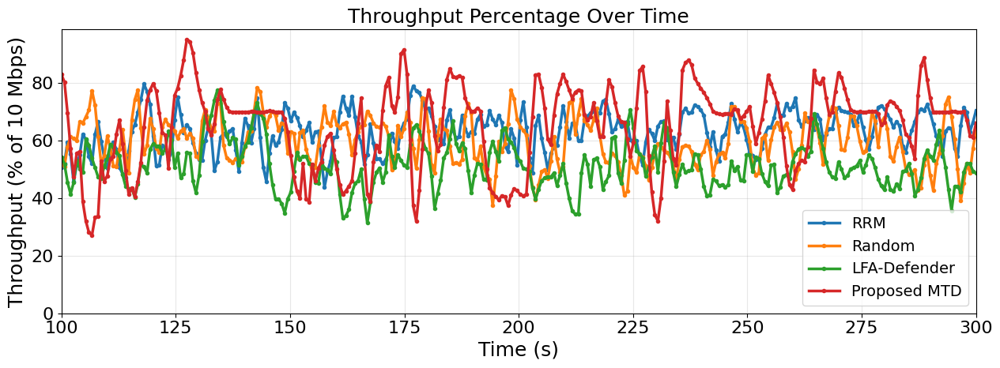


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route | QoS files: 4
[SAVED] ./qos_plots/jitter_ms_all_groups.png


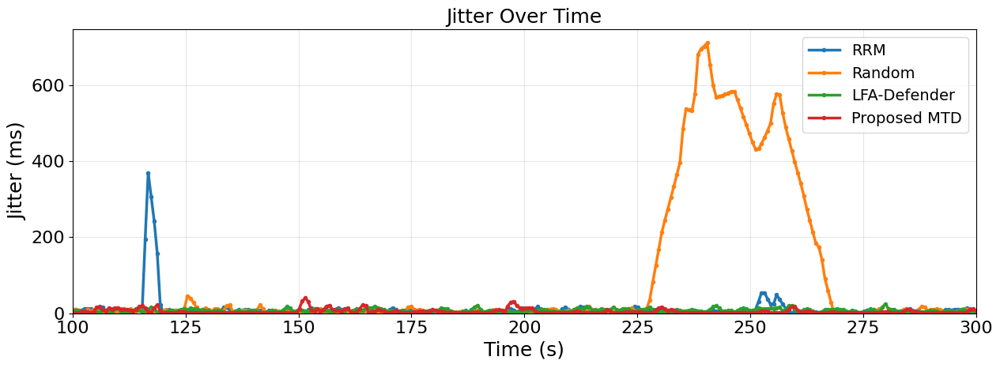


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route | QoS files: 4
[SAVED] ./qos_plots/packet_loss_percent_all_groups.png


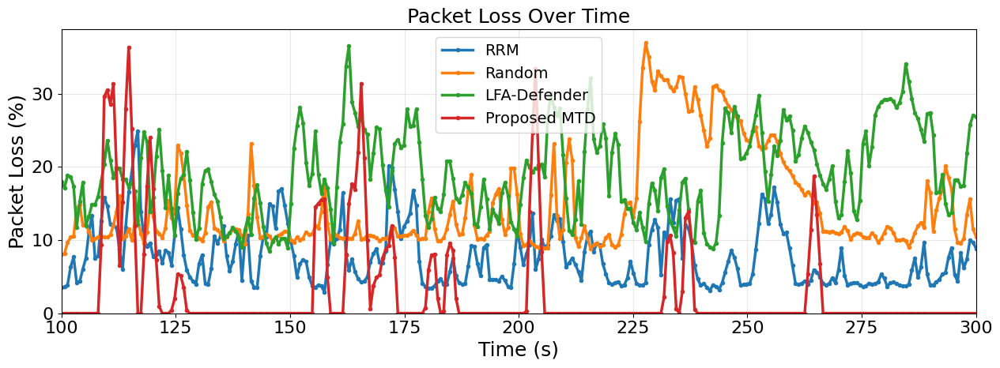

In [19]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")
plt.rcParams.update({"font.size": 18})

BASE_ROOT = "../logs_generated"

FOLDERS = [
    "test_rrm_jafarian",
    "random",
    "lfadefender",
    "test_mymtd_route",
]

FOLDER_LABELS = {
    "test_rrm_jafarian": "RRM",
    "random": "Random",
    "lfadefender": "LFA-Defender",
    "test_mymtd_route": "Proposed MTD",
}

START_TIME = 100
END_TIME = 300
TARGET_BW_MBPS = 10.0

OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    times, bitrates, thr_pct, jitters, losses = [], [], [], [], []

    with open(path, "r", errors="ignore") as f:
        for line in f:
            m = INTERVAL_RE.search(line)
            if not m:
                continue

            t1, t2 = float(m.group(1)), float(m.group(2))
            if (t2 - t1) > 5:
                continue

            br = float(m.group(3))
            unit = m.group(4)
            jitter = float(m.group(5))
            total = int(m.group(7))
            loss = float(m.group(8))

            if unit == "K":
                br /= 1000.0
            elif unit == "G":
                br *= 1000.0

            if total <= 0 or loss < 0 or loss > 100:
                continue

            times.append((t1 + t2) / 2.0)
            bitrates.append(br)
            thr_pct.append((br / TARGET_BW_MBPS) * 100.0)
            jitters.append(jitter)
            losses.append(loss)

    return map(np.array, (times, bitrates, thr_pct, jitters, losses))

def collect_qos_files(folder):
    folder_path = os.path.join(BASE_ROOT, folder)

    if not os.path.isdir(folder_path):
        print("[WARN] Missing:", folder_path)
        return []

    return sorted([
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if f.lower().endswith(".txt") and "qos" in f.lower()
    ])

def average_folder_qos(folder, metric, n=300):
    files = collect_qos_files(folder)
    print(f"\nFolder: {folder} | QoS files: {len(files)}")

    t_common = np.linspace(START_TIME, END_TIME, n)
    series = []

    for path in files:
        times, bitrates, thr_pct, jitters, losses = parse_file(path)

        if len(times) < 2:
            print("[SKIP]", os.path.basename(path))
            continue

        if metric == "throughput_pct":
            vals = thr_pct
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("Invalid metric")

        mask = (times >= START_TIME) & (times <= END_TIME)

        if mask.sum() < 2:
            print("[SKIP RANGE]", os.path.basename(path))
            continue

        series.append(np.interp(t_common, times[mask], vals[mask]))

    if not series:
        return t_common, None

    avg = np.mean(np.array(series), axis=0)
    return t_common, avg

def plot_metric(metric):
    labels = {
        "throughput_pct": ("Throughput Percentage Over Time", "Throughput (% of 10 Mbps)", "throughput_percent"),
        "jitter": ("Jitter Over Time", "Jitter (ms)", "jitter_ms"),
        "loss": ("Packet Loss Over Time", "Packet Loss (%)", "packet_loss_percent"),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for folder in FOLDERS:
        t, avg = average_folder_qos(folder, metric)

        if avg is None:
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=FOLDER_LABELS.get(folder, folder)
        )

    plt.title(title, fontsize=18)
    plt.xlabel("Time (s)", fontsize=18)
    plt.ylabel(ylabel, fontsize=18)
    plt.xlim(START_TIME, END_TIME)
    plt.ylim(bottom=0)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=14)
    plt.tight_layout()

    out_path = os.path.join(OUT_DIR, f"{fname}_all_groups.png")
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    print("[SAVED]", out_path)

    plt.show()

plot_metric("throughput_pct")
plot_metric("jitter")
plot_metric("loss")


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route/older_qos_no_loss_mentioned | QoS files: 4
[SAVED] ./qos_plots/throughput_percent_all_groups.png


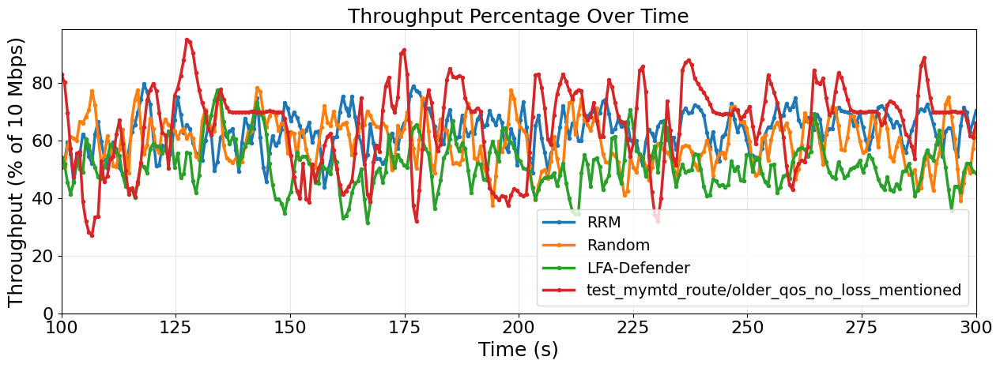


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route/older_qos_no_loss_mentioned | QoS files: 4
[SAVED] ./qos_plots/jitter_ms_all_groups.png


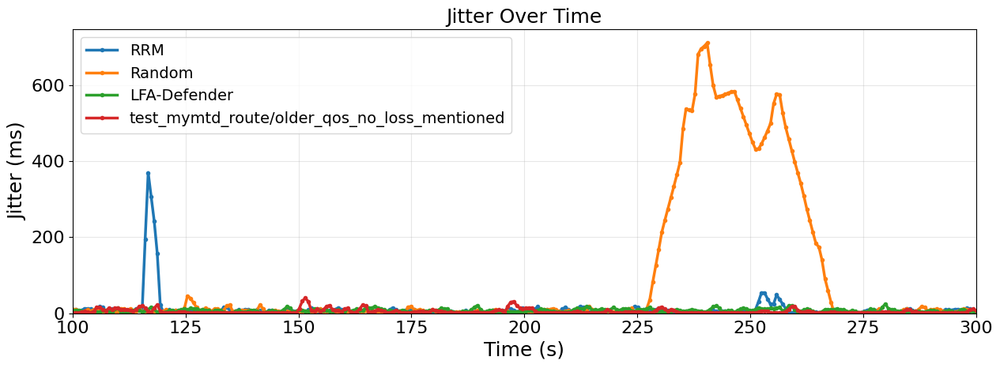


Folder: test_rrm_jafarian | QoS files: 10

Folder: random | QoS files: 7
[SKIP] tes3_qos_udp_h15_rcv.txt

Folder: lfadefender | QoS files: 8

Folder: test_mymtd_route/older_qos_no_loss_mentioned | QoS files: 4
[SAVED] ./qos_plots/packet_loss_percent_all_groups.png


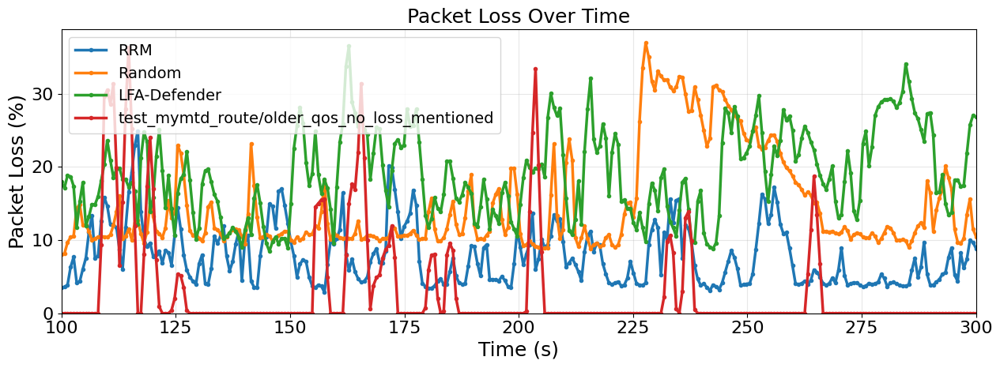

In [53]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("default")
plt.rcParams.update({"font.size": 18})

BASE_ROOT = "../logs_generated"

FOLDERS = [
    "test_rrm_jafarian",
    "random",
    "lfadefender",
    "test_mymtd_route",
]

FOLDER_LABELS = {
    "test_rrm_jafarian": "RRM",
    "random": "Random",
    "lfadefender": "LFA-Defender",
    "test_mymtd_route": "Proposed MTD",
}

START_TIME = 100
END_TIME = 300
TARGET_BW_MBPS = 10.0

OUT_DIR = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

INTERVAL_RE = re.compile(
    r"\[\s*\d+\]\s+"
    r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
    r"[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+"
    r"([\d.]+)\s+ms\s+"
    r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    times, bitrates, thr_pct, jitters, losses = [], [], [], [], []

    with open(path, "r", errors="ignore") as f:
        for line in f:
            m = INTERVAL_RE.search(line)
            if not m:
                continue

            t1, t2 = float(m.group(1)), float(m.group(2))
            if (t2 - t1) > 5:
                continue

            br = float(m.group(3))
            unit = m.group(4)
            jitter = float(m.group(5))
            total = int(m.group(7))
            loss = float(m.group(8))

            if unit == "K":
                br /= 1000.0
            elif unit == "G":
                br *= 1000.0

            if total <= 0 or loss < 0 or loss > 100:
                continue

            times.append((t1 + t2) / 2.0)
            bitrates.append(br)
            thr_pct.append((br / TARGET_BW_MBPS) * 100.0)
            jitters.append(jitter)
            losses.append(loss)

    return map(np.array, (times, bitrates, thr_pct, jitters, losses))

def collect_qos_files(folder):
    folder_path = os.path.join(BASE_ROOT, folder)

    if not os.path.isdir(folder_path):
        print("[WARN] Missing:", folder_path)
        return []

    return sorted([
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if f.lower().endswith(".txt") and "qos" in f.lower()
    ])

def average_folder_qos(folder, metric, n=300):
    files = collect_qos_files(folder)
    print(f"\nFolder: {folder} | QoS files: {len(files)}")

    t_common = np.linspace(START_TIME, END_TIME, n)
    series = []

    for path in files:
        times, bitrates, thr_pct, jitters, losses = parse_file(path)

        if len(times) < 2:
            print("[SKIP]", os.path.basename(path))
            continue

        if metric == "throughput_pct":
            vals = thr_pct
        elif metric == "jitter":
            vals = jitters
        elif metric == "loss":
            vals = losses
        else:
            raise ValueError("Invalid metric")

        mask = (times >= START_TIME) & (times <= END_TIME)

        if mask.sum() < 2:
            print("[SKIP RANGE]", os.path.basename(path))
            continue

        series.append(np.interp(t_common, times[mask], vals[mask]))

    if not series:
        return t_common, None

    avg = np.mean(np.array(series), axis=0)
    return t_common, avg

def plot_metric(metric):
    labels = {
        "throughput_pct": ("Throughput Percentage Over Time", "Throughput (% of 10 Mbps)", "throughput_percent"),
        "jitter": ("Jitter Over Time", "Jitter (ms)", "jitter_ms"),
        "loss": ("Packet Loss Over Time", "Packet Loss (%)", "packet_loss_percent"),
    }

    title, ylabel, fname = labels[metric]

    plt.figure(figsize=(13, 5))

    for folder in FOLDERS:
        t, avg = average_folder_qos(folder, metric)

        if avg is None:
            continue

        plt.plot(
            t,
            avg,
            linewidth=2.5,
            marker="o",
            markersize=3,
            label=FOLDER_LABELS.get(folder, folder)
        )

    plt.title(title, fontsize=18)
    plt.xlabel("Time (s)", fontsize=18)
    plt.ylabel(ylabel, fontsize=18)
    plt.xlim(START_TIME, END_TIME)
    plt.ylim(bottom=0)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.grid(alpha=0.3)
    plt.legend(fontsize=14)
    plt.tight_layout()

    out_path = os.path.join(OUT_DIR, f"{fname}_all_groups.png")
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    print("[SAVED]", out_path)

    plt.show()

plot_metric("throughput_pct")
plot_metric("jitter")
plot_metric("loss")


Time window: 100s – 300s

── Plotting: throughput_pct
  test_rrm_jafarian: 10 QoS file(s)
  random: 7 QoS file(s)
  lfadefender: 8 QoS file(s)
  test_mymtd_route: 6 QoS file(s)
  [SAVED] ./qos_plots/throughput_percent_all_groups.pdf



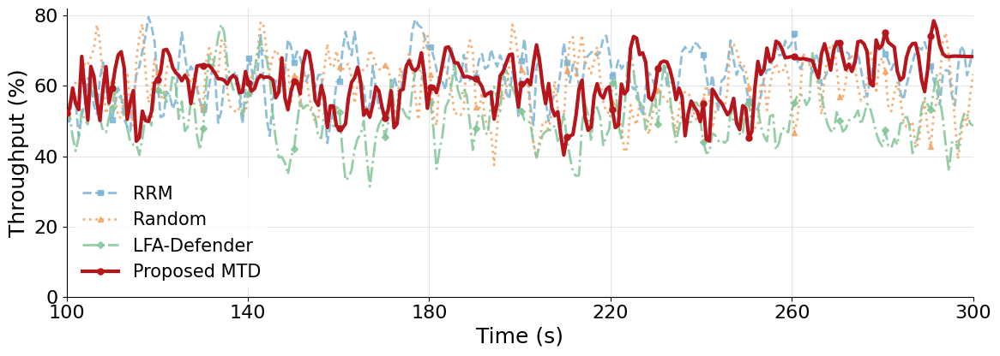

── Plotting: jitter
  test_rrm_jafarian: 10 QoS file(s)
  random: 7 QoS file(s)
  lfadefender: 8 QoS file(s)
  test_mymtd_route: 6 QoS file(s)
  [SAVED] ./qos_plots/jitter_ms_all_groups.pdf



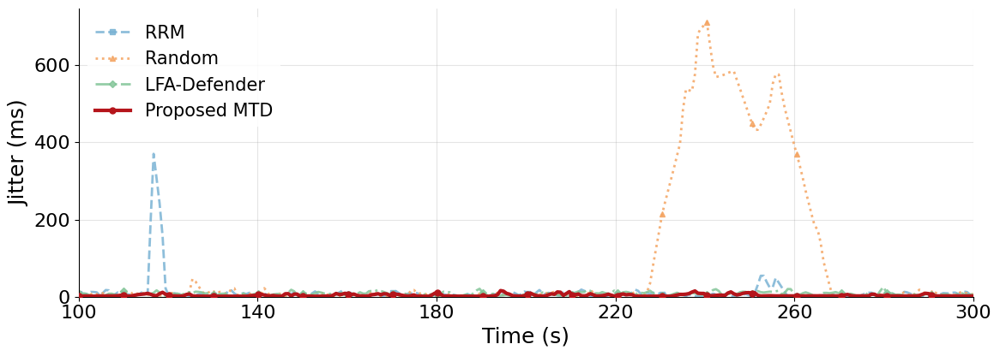

── Plotting: loss
  test_rrm_jafarian: 10 QoS file(s)
  random: 7 QoS file(s)
  lfadefender: 8 QoS file(s)
  test_mymtd_route: 6 QoS file(s)
  [SAVED] ./qos_plots/packet_loss_percent_all_groups.pdf



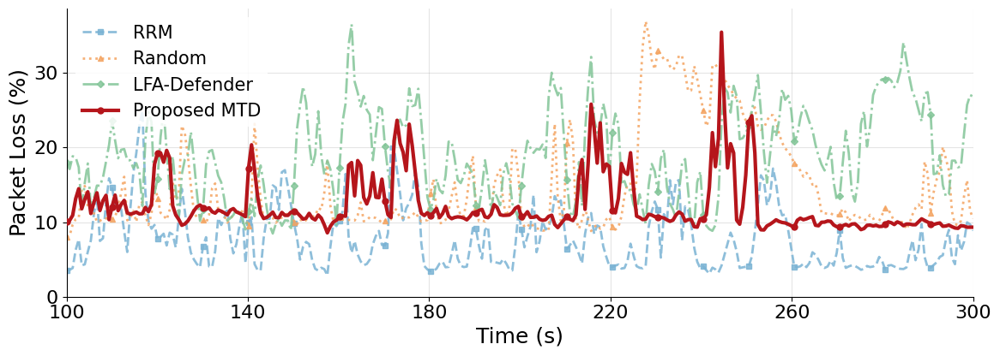

In [26]:
# import os
# import re
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.ticker as ticker

# # ─────────────────────────────────────────────
# #  USER CONFIG  ← edit these freely
# # ─────────────────────────────────────────────
# BASE_ROOT      = "../logs_generated"
# START_TIME     = 100          # seconds – change to zoom in/out
# END_TIME       = 300          # seconds
# TARGET_BW_MBPS = 10.0         # reference bandwidth for throughput %
# N_INTERP       = 300          # number of interpolation points
# OUT_DIR        = "./qos_plots"

# FOLDERS = [
#     "test_rrm_jafarian",
#     "random",
#     "lfadefender",
#     "test_mymtd_route",   # <-- your proposed method (deepest color)
# ]

# FOLDER_LABELS = {
#     "test_rrm_jafarian": "RRM",
#     "random":            "Random",
#     "lfadefender":       "LFA-Defender",
#     "test_mymtd_route":  "Proposed MTD",   # rename here freely
# }

# # ─────────────────────────────────────────────
# #  COLORS  – baselines lighter, proposed deep
# #  Order matches FOLDERS list above
# # ─────────────────────────────────────────────
# PALETTE = {
#     "test_rrm_jafarian": dict(color="#7ab3d4", lw=2.0, ls="--",  marker="s",  ms=4, alpha=0.85, zorder=2),
#     "random":            dict(color="#f4a461", lw=2.0, ls=":",   marker="^",  ms=4, alpha=0.85, zorder=2),
#     "lfadefender":       dict(color="#83c598", lw=2.0, ls="-.",  marker="D",  ms=4, alpha=0.85, zorder=2),
#     "test_mymtd_route":  dict(color="#b5151b", lw=3.0, ls="-",   marker="o",  ms=5, alpha=1.00, zorder=5),
# }

# # ─────────────────────────────────────────────
# #  GLOBAL PLOT STYLE
# # ─────────────────────────────────────────────
# FS        = 18   # base font size
# FS_TICK   = 16
# FS_LEGEND = 15

# plt.rcParams.update({
#     "font.size":        FS,
#     "axes.labelsize":   FS,
#     "xtick.labelsize":  FS_TICK,
#     "ytick.labelsize":  FS_TICK,
#     "legend.fontsize":  FS_LEGEND,
#     "axes.spines.top":  False,
#     "axes.spines.right": False,
# })

# os.makedirs(OUT_DIR, exist_ok=True)

# # ─────────────────────────────────────────────
# #  PARSER
# # ─────────────────────────────────────────────
# _RE = re.compile(
#     r"\[\s*\d+\]\s+"
#     r"(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+"
#     r"[\d.]+\s+\w+Bytes\s+"
#     r"([\d.]+)\s+([KMG]?)bits/sec\s+"
#     r"([\d.]+)\s+ms\s+"
#     r"(\d+)/(\d+)\s+\(([\d.]+)%\)"
# )

# def parse_file(path):
#     times, bitrates, thr_pct, jitters, losses = [], [], [], [], []
#     with open(path, "r", errors="ignore") as f:
#         for line in f:
#             m = _RE.search(line)
#             if not m:
#                 continue
#             t1, t2 = float(m.group(1)), float(m.group(2))
#             if (t2 - t1) > 5:
#                 continue
#             br, unit = float(m.group(3)), m.group(4)
#             jitter    = float(m.group(5))
#             total     = int(m.group(7))
#             loss      = float(m.group(8))
#             if unit == "K":  br /= 1000.0
#             elif unit == "G": br *= 1000.0
#             if total <= 0 or not (0 <= loss <= 100):
#                 continue
#             times.append((t1 + t2) / 2.0)
#             bitrates.append(br)
#             thr_pct.append((br / TARGET_BW_MBPS) * 100.0)
#             jitters.append(jitter)
#             losses.append(loss)
#     return map(np.array, (times, bitrates, thr_pct, jitters, losses))


# def collect_qos_files(folder):
#     path = os.path.join(BASE_ROOT, folder)
#     if not os.path.isdir(path):
#         print(f"[WARN] Missing: {path}")
#         return []
#     return sorted([
#         os.path.join(path, f)
#         for f in os.listdir(path)
#         if f.lower().endswith(".txt") and "qos" in f.lower()
#     ])


# def average_folder_qos(folder, metric):
#     files = collect_qos_files(folder)
#     print(f"  {folder}: {len(files)} QoS file(s)")
#     t_common = np.linspace(START_TIME, END_TIME, N_INTERP)
#     series = []
#     for path in files:
#         times, bitrates, thr_pct, jitters, losses = parse_file(path)
#         if len(times) < 2:
#             continue
#         vals = {"throughput_pct": thr_pct, "jitter": jitters, "loss": losses}[metric]
#         mask = (times >= START_TIME) & (times <= END_TIME)
#         if mask.sum() < 2:
#             continue
#         series.append(np.interp(t_common, times[mask], vals[mask]))
#     if not series:
#         return t_common, None
#     return t_common, np.mean(np.array(series), axis=0)


# # ─────────────────────────────────────────────
# #  PLOT
# # ─────────────────────────────────────────────
# METRICS = {
#     "throughput_pct": ("Throughput (%)",   "throughput_percent"),
#     "jitter":         ("Jitter (ms)",      "jitter_ms"),
#     "loss":           ("Packet Loss (%)",  "packet_loss_percent"),
# }

# def plot_metric(metric):
#     ylabel, fname = METRICS[metric]
#     fig, ax = plt.subplots(figsize=(12, 4.5))

#     for folder in FOLDERS:
#         t, avg = average_folder_qos(folder, metric)
#         if avg is None:
#             print(f"  [SKIP] no data for {folder}")
#             continue
#         style = PALETTE[folder]
#         ax.plot(
#             t, avg,
#             color=style["color"],
#             linewidth=style["lw"],
#             linestyle=style["ls"],
#             marker=style["marker"],
#             markersize=style["ms"],
#             alpha=style["alpha"],
#             zorder=style["zorder"],
#             label=FOLDER_LABELS.get(folder, folder),
#             markevery=max(1, N_INTERP // 20),   # avoid marker clutter
#         )

#     # ── axes ──────────────────────────────────
#     ax.set_xlabel("Time (s)", fontsize=FS)
#     ax.set_ylabel(ylabel,     fontsize=FS)
#     ax.set_xlim(START_TIME, END_TIME)
#     ax.set_ylim(bottom=0)

#     # nice x-ticks: evenly spaced, always includes start & end
#     n_ticks = 6
#     ax.set_xticks(np.linspace(START_TIME, END_TIME, n_ticks).astype(int))

#     ax.yaxis.set_major_locator(ticker.AutoLocator())
#     ax.grid(axis="both", color="grey", alpha=0.20, linewidth=0.8)
#     ax.legend(loc="best", framealpha=0.85, edgecolor="none")

#     fig.tight_layout()
#     out_path = os.path.join(OUT_DIR, f"{fname}_all_groups.pdf")
#     fig.savefig(out_path, dpi=300, bbox_inches="tight")
#     # also save as PNG for quick preview
#     fig.savefig(out_path.replace(".pdf", ".png"), dpi=300, bbox_inches="tight")
#     print(f"  [SAVED] {out_path}\n")
#     plt.show()


# # ─────────────────────────────────────────────
# #  MAIN
# # ─────────────────────────────────────────────
# if __name__ == "__main__":
#     print(f"\nTime window: {START_TIME}s – {END_TIME}s\n")
#     for m in METRICS:
#         print(f"── Plotting: {m}")
#         plot_metric(m)


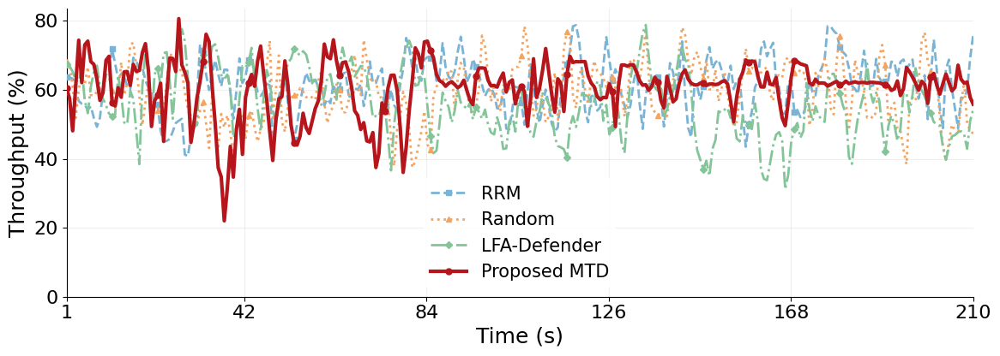

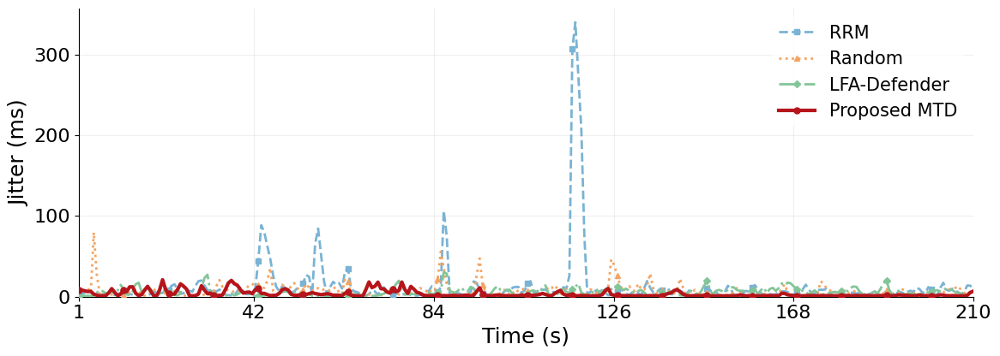

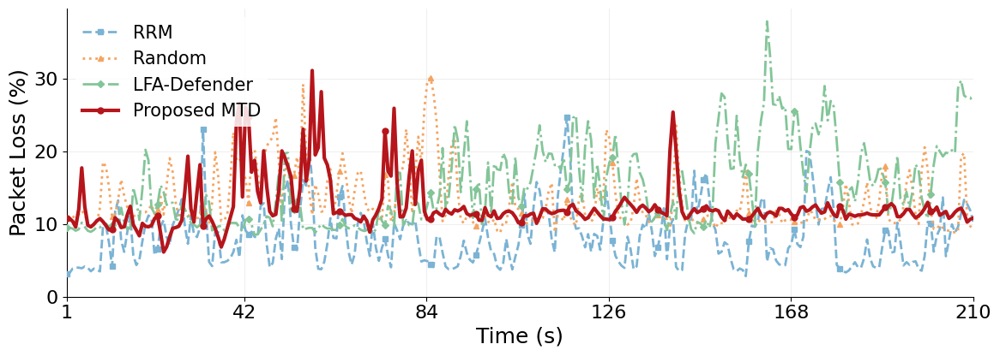

In [30]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

# ── CONFIG ────────────────────────────────────────────────────────────────────
BASE_ROOT      = "../logs_generated"
START_TIME     = 1
END_TIME       = 210
TARGET_BW_MBPS = 10.0
N_INTERP       = 300
OUT_DIR        = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# label, color, linestyle, marker, linewidth
METHODS = {
    "test_rrm_jafarian": ("RRM",          "#7ab3d4", "--",  "s", 2.0),
    "random":            ("Random",       "#f4a461", ":",   "^", 2.0),
    "lfadefender":       ("LFA-Defender", "#83c598", "-.",  "D", 2.0),
    "test_mymtd_route":  ("Proposed MTD", "#b5151b", "-",   "o", 3.0),  # deeper color
}

METRICS = {
    "throughput_pct": ("Throughput (%)",  "throughput_percent"),
    "jitter":         ("Jitter (ms)",     "jitter_ms"),
    "loss":           ("Packet Loss (%)", "packet_loss_percent"),
}

plt.rcParams.update({"font.size": 18, "xtick.labelsize": 16, "ytick.labelsize": 16})

# ── PARSER ────────────────────────────────────────────────────────────────────
_RE = re.compile(
    r"\[\s*\d+\]\s+(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+([\d.]+)\s+ms\s+(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    rows = []
    with open(path, errors="ignore") as f:
        for line in f:
            m = _RE.search(line)
            if not m: continue
            t1, t2 = float(m[1]), float(m[2])
            if t2 - t1 > 5: continue
            br = float(m[3]) * {"K": 1e-3, "G": 1e3}.get(m[4], 1.0)
            total, loss = int(m[7]), float(m[8])
            if total > 0 and 0 <= loss <= 100:
                rows.append(((t1+t2)/2, br/TARGET_BW_MBPS*100, float(m[5]), loss))
    return np.array(rows).T if rows else [np.array([])]*4  # t, thr%, jitter, loss

def avg_series(folder, metric_idx):
    path = os.path.join(BASE_ROOT, folder)
    files = [os.path.join(path, f) for f in os.listdir(path)
             if f.lower().endswith(".txt") and "qos" in f.lower()] if os.path.isdir(path) else []
    t_c = np.linspace(START_TIME, END_TIME, N_INTERP)
    series = []
    for fp in files:
        cols = parse_file(fp)
        t, vals = cols[0], cols[metric_idx]
        mask = (t >= START_TIME) & (t <= END_TIME)
        if mask.sum() >= 2:
            series.append(np.interp(t_c, t[mask], vals[mask]))
    return t_c, np.mean(series, axis=0) if series else None

# ── PLOT ──────────────────────────────────────────────────────────────────────
METRIC_IDX = {"throughput_pct": 1, "jitter": 2, "loss": 3}

for metric, (ylabel, fname) in METRICS.items():
    fig, ax = plt.subplots(figsize=(12, 4.5))
    for folder, (label, color, ls, marker, lw) in METHODS.items():
        t, avg = avg_series(folder, METRIC_IDX[metric])
        if avg is not None:
            ax.plot(t, avg, color=color, ls=ls, lw=lw, marker=marker,
                    markersize=4 + (lw > 2), markevery=N_INTERP//20,
                    label=label, zorder=3 + (lw > 2))
    ax.set(xlabel="Time (s)", ylabel=ylabel, xlim=(START_TIME, END_TIME))
    ax.set_xticks(np.linspace(START_TIME, END_TIME, 6).astype(int))
    ax.set_ylim(bottom=0)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=15, framealpha=0.85, edgecolor="none")
    fig.tight_layout()
    for ext in ("pdf", "png"):
        fig.savefig(os.path.join(OUT_DIR, f"{fname}.{ext}"), dpi=300, bbox_inches="tight")
    plt.show()

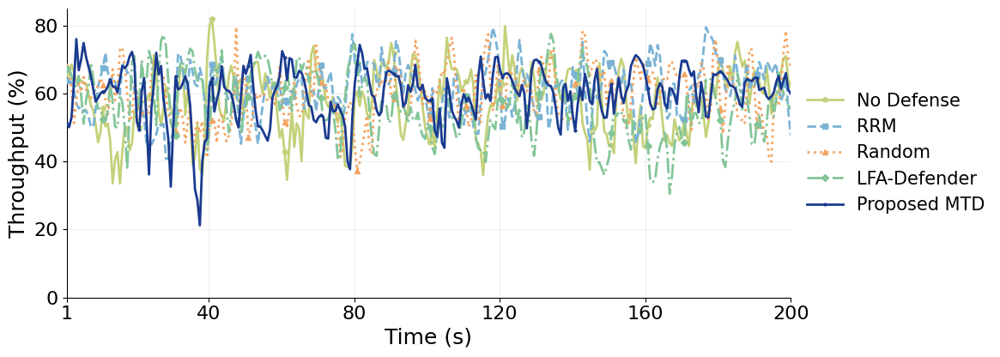

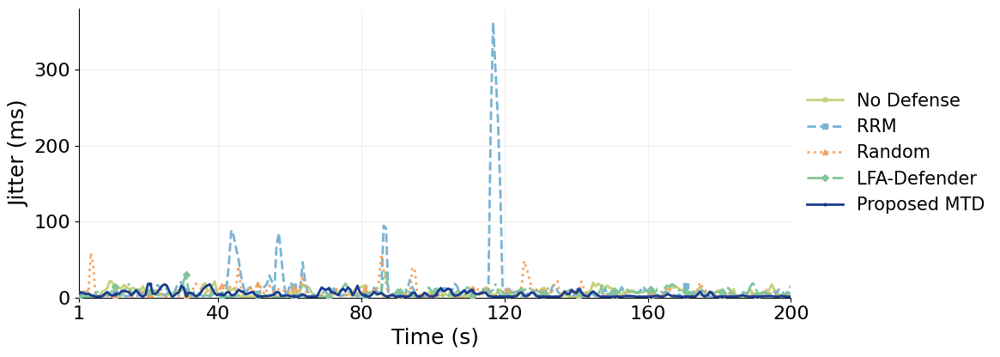

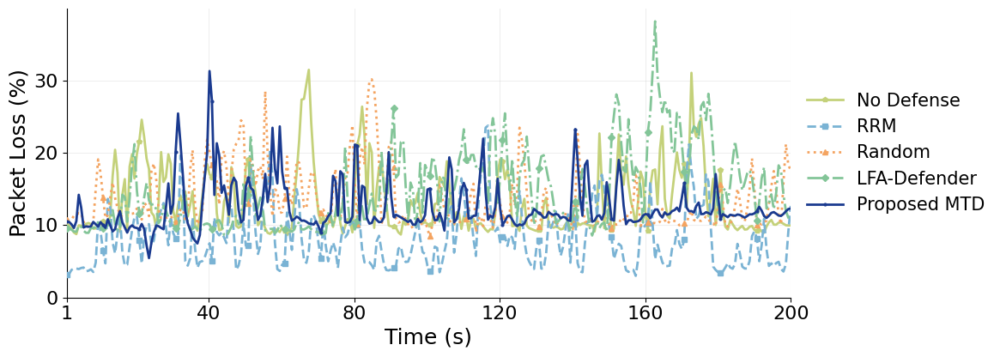

In [46]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

# ── CONFIG ────────────────────────────────────────────────────────────────────
BASE_ROOT      = "../logs_generated"
START_TIME     = 1
END_TIME       = 200
TARGET_BW_MBPS = 10.0
N_INTERP       = 300
OUT_DIR        = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# label, color, linestyle, marker, linewidth
METHODS = {
    "none":              ("No Defense",   "#c4d17a", "-",   "p", 2.0),
    "test_rrm_jafarian": ("RRM",          "#7ab3d4", "--",  "s", 2.0),
    "random":            ("Random",       "#f4a461", ":",   "^", 2.0),
    "lfadefender":       ("LFA-Defender", "#83c598", "-.",  "D", 2.0),
    "test_mymtd_route":  ("Proposed MTD", "#1a3a8f", "-",   ".", 2.0),
}

METRICS = {
    "throughput_pct": ("Throughput (%)",  "throughput_percent"),
    "jitter":         ("Jitter (ms)",     "jitter_ms"),
    "loss":           ("Packet Loss (%)", "packet_loss_percent"),
}

plt.rcParams.update({"font.size": 18, "xtick.labelsize": 16, "ytick.labelsize": 16})

# ── PARSER ────────────────────────────────────────────────────────────────────
_RE = re.compile(
    r"\[\s*\d+\]\s+(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+([\d.]+)\s+ms\s+(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    rows = []
    with open(path, errors="ignore") as f:
        for line in f:
            m = _RE.search(line)
            if not m: continue
            t1, t2 = float(m[1]), float(m[2])
            if t2 - t1 > 5: continue
            br = float(m[3]) * {"K": 1e-3, "G": 1e3}.get(m[4], 1.0)
            total, loss = int(m[7]), float(m[8])
            if total > 0 and 0 <= loss <= 100:
                rows.append(((t1+t2)/2, br/TARGET_BW_MBPS*100, float(m[5]), loss))
    return np.array(rows).T if rows else [np.array([])]*4  # t, thr%, jitter, loss

def avg_series(folder, metric_idx):
    path = os.path.join(BASE_ROOT, folder)
    files = [os.path.join(path, f) for f in os.listdir(path)
             if f.lower().endswith(".txt") and "qos" in f.lower()] if os.path.isdir(path) else []
    t_c = np.linspace(START_TIME, END_TIME, N_INTERP)
    series = []
    for fp in files:
        cols = parse_file(fp)
        t, vals = cols[0], cols[metric_idx]
        mask = (t >= START_TIME) & (t <= END_TIME)
        if mask.sum() >= 2:
            series.append(np.interp(t_c, t[mask], vals[mask]))
    return t_c, np.mean(series, axis=0) if series else None

# ── PLOT ──────────────────────────────────────────────────────────────────────
METRIC_IDX = {"throughput_pct": 1, "jitter": 2, "loss": 3}

for metric, (ylabel, fname) in METRICS.items():
    fig, ax = plt.subplots(figsize=(12, 4.5))
    for folder, (label, color, ls, marker, lw) in METHODS.items():
        t, avg = avg_series(folder, METRIC_IDX[metric])
        if avg is not None:
            ax.plot(t, avg, color=color, ls=ls, lw=lw, marker=marker,
                    markersize=4 + (lw > 2), markevery=N_INTERP//20,
                    label=label, zorder=3 + (lw > 2))
    ax.set(xlabel="Time (s)", ylabel=ylabel, xlim=(START_TIME, END_TIME))
    ax.set_xticks(np.linspace(START_TIME, END_TIME, 6).astype(int))
    ax.set_ylim(bottom=0)
    ax.grid(alpha=0.2)
    # ax.legend(fontsize=15, framealpha=0.85, edgecolor="none")
    ax.legend(fontsize=15, framealpha=0.85, edgecolor="none", loc="center left", bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    for ext in ("pdf", "png"):
        fig.savefig(os.path.join(OUT_DIR, f"{fname}.{ext}"), dpi=300, bbox_inches="tight")
    plt.show()

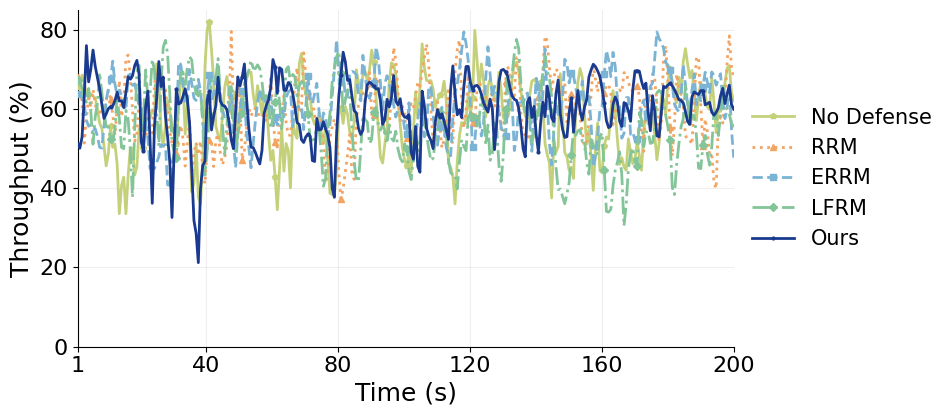

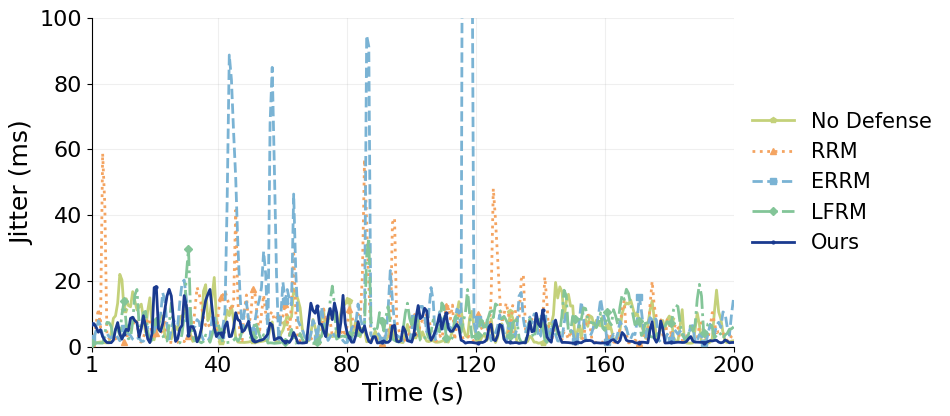

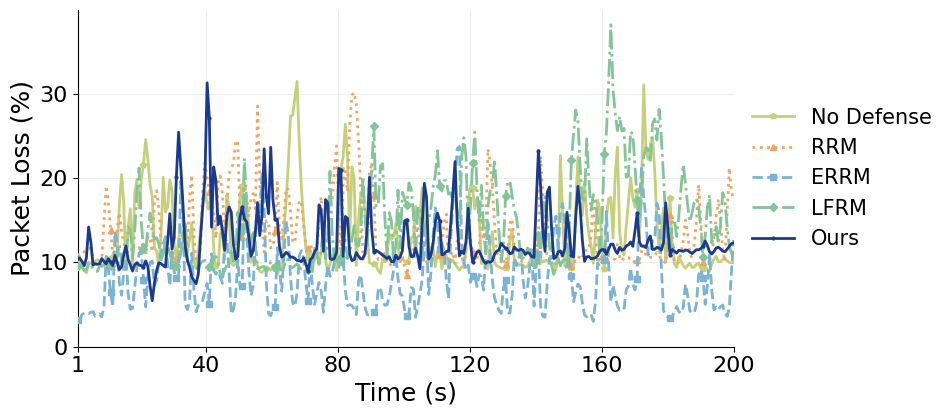

In [52]:
import os, re
import numpy as np
import matplotlib.pyplot as plt

# ── CONFIG ────────────────────────────────────────────────────────────────────
BASE_ROOT      = "../logs_generated"
START_TIME     = 1
END_TIME       = 200
TARGET_BW_MBPS = 10.0
N_INTERP       = 300
OUT_DIR        = "./qos_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# label, color, linestyle, marker, linewidth
METHODS = {
    "none":              ("No Defense",   "#c4d17a", "-",   "p", 2.0),
    "random":            ("RRM",       "#f4a461", ":",   "^", 2.0),
    "test_rrm_jafarian": ("ERRM",          "#7ab3d4", "--",  "s", 2.0),
    "lfadefender":       ("LFRM", "#83c598", "-.",  "D", 2.0),
    "test_mymtd_route":  ("Ours", "#1a3a8f", "-",   ".", 2.0),
}

METRICS = {
    "throughput_pct": ("Throughput (%)",  "throughput_percent"),
    "jitter":         ("Jitter (ms)",     "jitter_ms"),
    "loss":           ("Packet Loss (%)", "packet_loss_percent"),
}

plt.rcParams.update({"font.size": 18, "xtick.labelsize": 16, "ytick.labelsize": 16})

# ── PARSER ────────────────────────────────────────────────────────────────────
_RE = re.compile(
    r"\[\s*\d+\]\s+(\d+(?:\.\d+)?)-(\d+(?:\.\d+)?)\s+sec\s+[\d.]+\s+\w+Bytes\s+"
    r"([\d.]+)\s+([KMG]?)bits/sec\s+([\d.]+)\s+ms\s+(\d+)/(\d+)\s+\(([\d.]+)%\)"
)

def parse_file(path):
    rows = []
    with open(path, errors="ignore") as f:
        for line in f:
            m = _RE.search(line)
            if not m: continue
            t1, t2 = float(m[1]), float(m[2])
            if t2 - t1 > 5: continue
            br = float(m[3]) * {"K": 1e-3, "G": 1e3}.get(m[4], 1.0)
            total, loss = int(m[7]), float(m[8])
            if total > 0 and 0 <= loss <= 100:
                rows.append(((t1+t2)/2, br/TARGET_BW_MBPS*100, float(m[5]), loss))
    return np.array(rows).T if rows else [np.array([])]*4  # t, thr%, jitter, loss

def avg_series(folder, metric_idx):
    path = os.path.join(BASE_ROOT, folder)
    files = [os.path.join(path, f) for f in os.listdir(path)
             if f.lower().endswith(".txt") and "qos" in f.lower()] if os.path.isdir(path) else []
    t_c = np.linspace(START_TIME, END_TIME, N_INTERP)
    series = []
    for fp in files:
        cols = parse_file(fp)
        t, vals = cols[0], cols[metric_idx]
        mask = (t >= START_TIME) & (t <= END_TIME)
        if mask.sum() >= 2:
            series.append(np.interp(t_c, t[mask], vals[mask]))
    return t_c, np.mean(series, axis=0) if series else None

# ── PLOT ──────────────────────────────────────────────────────────────────────
METRIC_IDX = {"throughput_pct": 1, "jitter": 2, "loss": 3}

for metric, (ylabel, fname) in METRICS.items():
    fig, ax = plt.subplots(figsize=(12, 4.5))
    for folder, (label, color, ls, marker, lw) in METHODS.items():
        t, avg = avg_series(folder, METRIC_IDX[metric])
        if avg is not None:
            ax.plot(t, avg, color=color, ls=ls, lw=lw, marker=marker,
                    markersize=4 + (lw > 2), markevery=N_INTERP//20,
                    label=label, zorder=3 + (lw > 2))
    ax.set(xlabel="Time (s)", ylabel=ylabel, xlim=(START_TIME, END_TIME))
    ax.set_xticks(np.linspace(START_TIME, END_TIME, 6).astype(int))
    ax.set_ylim(bottom=0)
    if metric == "jitter":
        ax.set_ylim(0, 100)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=15, framealpha=0.85, edgecolor="none", loc="center left", bbox_to_anchor=(1, 0.5))
    fig.tight_layout(rect=[0, 0, 0.82, 1])
    for ext in ("pdf", "png"):
        fig.savefig(os.path.join(OUT_DIR, f"{fname}.{ext}"), dpi=300, bbox_inches="tight")
    plt.show()

In [20]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from pathlib import Path

# ── Config ────────────────────────────────────────────────────────────────
LINK_CAPACITY_MBPS = 10.0
ATTACK_THRESHOLD   = 9.7      # >= this = attack success
SKIP_KEYWORDS      = ['bad', 'not_useful', 'skip']

# Path: one folder back → logs_generated → ASR_link_stats_onos
BASE_DIR = Path('.').resolve().parent / 'logs_generated' / 'ASR_link_stats_onos'

# ── Helpers ───────────────────────────────────────────────────────────────
def is_clean(path):
    return not any(kw in path.stem.lower() for kw in SKIP_KEYWORDS)

def file_index(path):
    m = re.match(r't(\d+)', path.name.lower())
    return int(m.group(1)) if m else 999

def get_clean_files(folder):
    csvs  = sorted(folder.glob('*.csv'), key=file_index)
    clean = [f for f in csvs if is_clean(f)]
    if len(clean) < 2:
        raise ValueError(f'Need >=2 clean files, found {len(clean)}')
    return clean

def calc_asr(t_start, t_end):
    df1 = pd.read_csv(t_start); df2 = pd.read_csv(t_end)
    df1['timestamp'] = pd.to_datetime(df1['timestamp'])
    df2['timestamp'] = pd.to_datetime(df2['timestamp'])
    rows = []
    for link in df1['link_id'].unique():
        l1 = df1[df1['link_id']==link].sort_values('timestamp')
        l2 = df2[df2['link_id']==link].sort_values('timestamp')
        if l2.empty: continue
        elapsed = (l2['timestamp'].iloc[-1] - l1['timestamp'].iloc[0]).total_seconds()
        if elapsed <= 0: continue
        asr_rx = (l2['rx_bytes'].iloc[-1] - l1['rx_bytes'].iloc[0]) * 8 / elapsed / 1e6
        asr_tx = (l2['tx_bytes'].iloc[-1] - l1['tx_bytes'].iloc[0]) * 8 / elapsed / 1e6
        rows.append({'link_id': link, 'ASR_rx_mbps': round(asr_rx,4), 'ASR_tx_mbps': round(asr_tx,4)})
    return pd.DataFrame(rows)

def calc_attack_rate(clean_files):
    df = pd.concat([pd.read_csv(f) for f in clean_files], ignore_index=True)
    df = df.drop_duplicates(subset=['timestamp','link_id'])
    rows = []
    for link, grp in df.groupby('link_id'):
        total   = len(grp)
        crossed = int(((grp['rx_mbps'] >= ATTACK_THRESHOLD) | (grp['tx_mbps'] >= ATTACK_THRESHOLD)).sum())
        rows.append({'link_id': link, 'total_samples': total,
                     'times_crossed': crossed,
                     'attack_rate_pct': round(crossed/total*100, 2) if total else 0.0})
    return pd.DataFrame(rows)

def short_link(link_id):
    """Shorten link label: keep only last hex digits of each switch."""
    parts = link_id.split(' -> ')
    def shorten(p):
        switch, port = p.rsplit(':', 1)
        return f'{switch[-2:]}:{port}'
    return f'{shorten(parts[0])} → {shorten(parts[1])}'

def plot_folder(folder_name, merged_df, save_dir):
    df = merged_df.copy()
    df['label'] = df['link_id'].apply(short_link)
    df = df.sort_values('ASR_rx_mbps', ascending=True)

    n = len(df)
    y = np.arange(n)
    height = max(5, n * 0.45)

    fig, axes = plt.subplots(1, 2, figsize=(16, height))
    fig.suptitle(f'Experiment: {folder_name}', fontsize=14, fontweight='bold', y=1.01)

    # ── Left: ASR bar chart ───────────────────────────────────────────────
    ax1 = axes[0]
    colors_rx = ['#d62728' if v >= ATTACK_THRESHOLD else '#1f77b4' for v in df['ASR_rx_mbps']]
    bars = ax1.barh(y, df['ASR_rx_mbps'], color=colors_rx, edgecolor='white', height=0.6)
    ax1.axvline(ATTACK_THRESHOLD,    color='orange', linestyle='--', linewidth=1.5, label=f'Threshold ({ATTACK_THRESHOLD} Mbps)')
    ax1.axvline(LINK_CAPACITY_MBPS,  color='red',    linestyle=':',  linewidth=1.5, label=f'Capacity ({LINK_CAPACITY_MBPS} Mbps)')
    ax1.set_yticks(y)
    ax1.set_yticklabels(df['label'], fontsize=8)
    ax1.set_xlabel('ASR RX (Mbps)')
    ax1.set_title('Average Send Rate (RX)')
    ax1.legend(fontsize=8)
    for bar, val in zip(bars, df['ASR_rx_mbps']):
        ax1.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height()/2,
                 f'{val:.3f}', va='center', fontsize=7)

    # ── Right: Attack rate bar chart ──────────────────────────────────────
    ax2 = axes[1]
    colors_atk = ['#d62728' if v > 0 else '#2ca02c' for v in df['attack_rate_pct']]
    bars2 = ax2.barh(y, df['attack_rate_pct'], color=colors_atk, edgecolor='white', height=0.6)
    ax2.set_yticks(y)
    ax2.set_yticklabels(df['label'], fontsize=8)
    ax2.set_xlabel('Attack Rate (%)')
    ax2.set_title(f'Attack Rate (samples >= {ATTACK_THRESHOLD} Mbps)')
    ax2.set_xlim(0, max(df['attack_rate_pct'].max() * 1.2, 10))
    for bar, row in zip(bars2, df.itertuples()):
        ax2.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
                 f'{row.times_crossed}/{row.total_samples}  ({row.attack_rate_pct:.1f}%)',
                 va='center', fontsize=7)

    red_patch   = mpatches.Patch(color='#d62728', label='Attack / Congested')
    green_patch = mpatches.Patch(color='#2ca02c', label='Normal')
    ax2.legend(handles=[red_patch, green_patch], fontsize=8)

    plt.tight_layout()
    out = save_dir / f'{folder_name}_asr.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'  Saved → {out}\n')

print('Setup complete.')

Setup complete.


  Folder: jafarian
      + use   t1_link_stats_onos.csv
      + use   t2_link_stats_onos.csv
  t_start -> t1_link_stats_onos.csv
  t_end   -> t2_link_stats_onos.csv

                                       link_id  ASR_rx_mbps  ASR_tx_mbps  times_crossed  total_samples  attack_rate_pct
of:0000000000000001:1 -> of:000000000000000b:1       0.0027       0.0027              0             35             0.00
of:0000000000000001:2 -> of:000000000000000c:1       0.0014       0.0014              0             35             0.00
of:0000000000000001:3 -> of:000000000000000d:1       0.0014       0.0014              0             35             0.00
of:0000000000000002:1 -> of:000000000000000b:4       3.5996       3.5996              0             35             0.00
of:0000000000000002:2 -> of:0000000000000008:2       0.0014       0.0014              0             35             0.00
of:0000000000000003:1 -> of:000000000000000b:5       3.7153       3.7183              0             35            

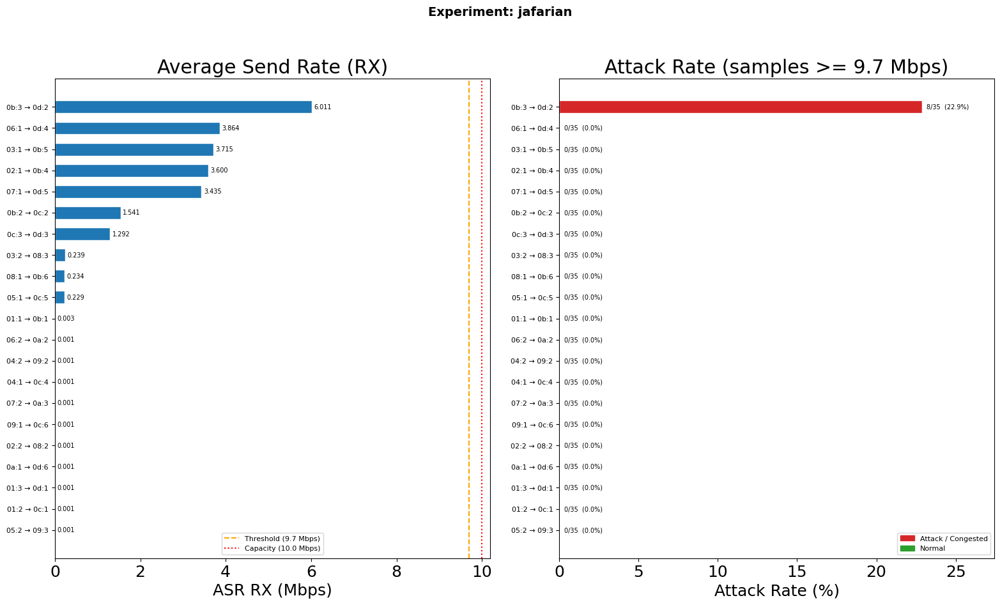

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/jafarian/jafarian_asr.png

  Folder: lfadefender
      + use   t2_link_stats_onos.csv
      + use   t3_link_stats_onos.csv
      + use   t4_link_stats_onos.csv
  t_start -> t2_link_stats_onos.csv
  t_end   -> t4_link_stats_onos.csv

                                       link_id  ASR_rx_mbps  ASR_tx_mbps  times_crossed  total_samples  attack_rate_pct
of:0000000000000001:1 -> of:000000000000000b:1       0.6260       0.6260              0             46             0.00
of:0000000000000001:2 -> of:000000000000000c:1       0.0014       0.0014              0             46             0.00
of:0000000000000001:3 -> of:000000000000000d:1       0.6137       0.6137              0             46             0.00
of:0000000000000002:1 -> of:000000000000000b:4       4.0825       4.0782              0             46             0.00
of:0000000000000002:2 -> of:0000000000000008:2       0.0014       

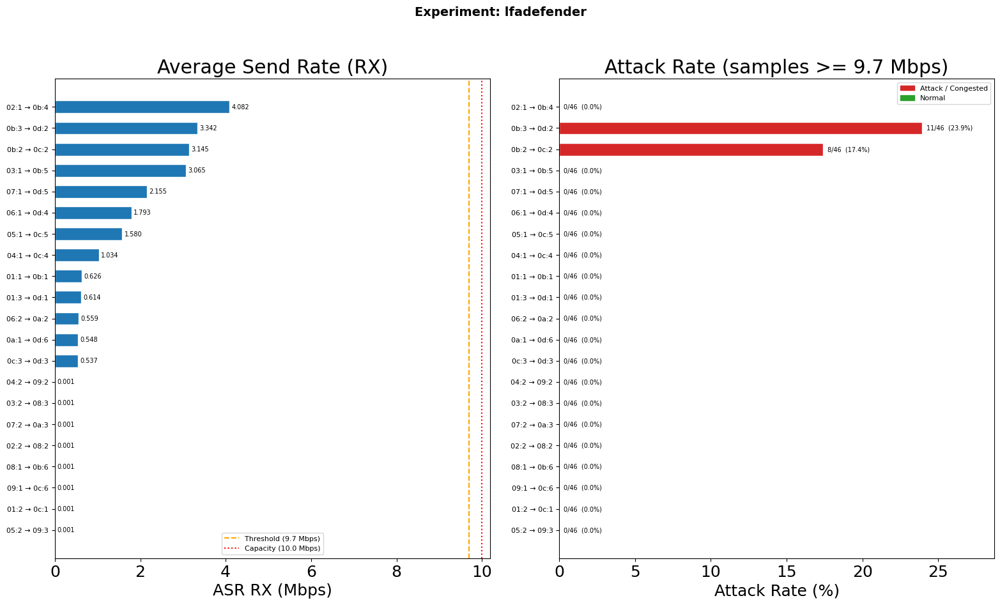

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/lfadefender/lfadefender_asr.png

  Folder: our method
      x skip  t1_link_stats_onos_not_useful.csv
      + use   t2_link_stats_onos.csv
      + use   t3_ok_link_stats_onos.csv
      x skip  t3_bad_example_link_stats_onos.csv
  t_start -> t2_link_stats_onos.csv
  t_end   -> t3_ok_link_stats_onos.csv

                                       link_id  ASR_rx_mbps  ASR_tx_mbps  times_crossed  total_samples  attack_rate_pct
of:0000000000000001:1 -> of:000000000000000b:1       0.2439       0.2439              0             80             0.00
of:0000000000000001:2 -> of:000000000000000c:1       0.4941       0.4941              0             80             0.00
of:0000000000000001:3 -> of:000000000000000d:1       0.7365       0.7365              0             80             0.00
of:0000000000000002:1 -> of:000000000000000b:4       1.1087       1.1095              0             80             

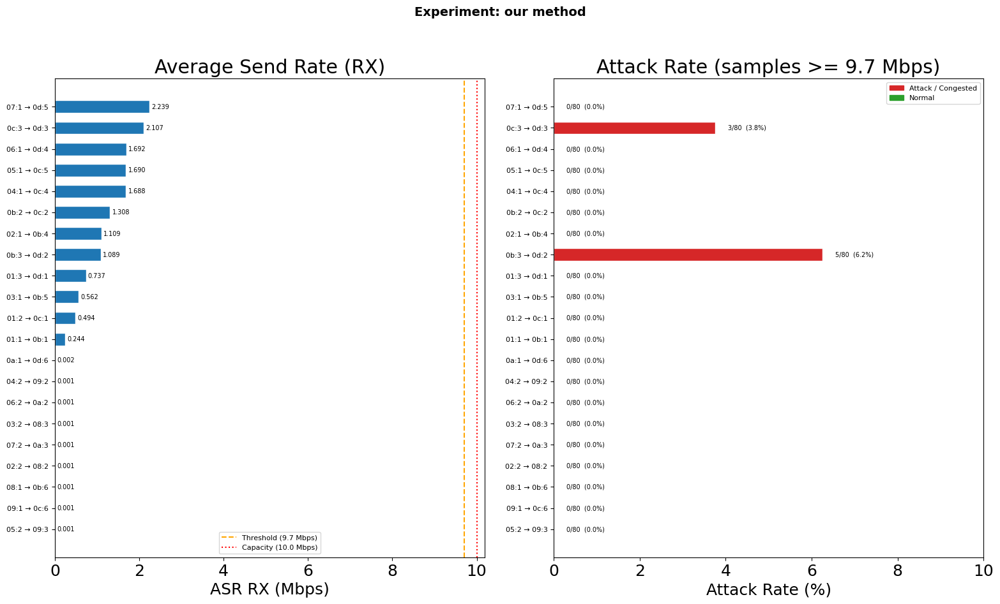

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/our method/our method_asr.png

  Folder: random
      x skip  t1_bad_link_stats_onos.csv
      + use   t2_link_stats_onos.csv
      + use   t3_link_stats_onos.csv
      + use   t4_link_stats_onos.csv
  t_start -> t2_link_stats_onos.csv
  t_end   -> t4_link_stats_onos.csv

                                       link_id  ASR_rx_mbps  ASR_tx_mbps  times_crossed  total_samples  attack_rate_pct
of:0000000000000001:1 -> of:000000000000000b:1       0.4389       0.4389              0             42             0.00
of:0000000000000001:2 -> of:000000000000000c:1       0.8750       0.8750              0             42             0.00
of:0000000000000001:3 -> of:000000000000000d:1       1.3042       1.3042              0             42             0.00
of:0000000000000002:1 -> of:000000000000000b:4       3.4673       3.4673              3             42             7.14
of:0000000000000002:2 -> o

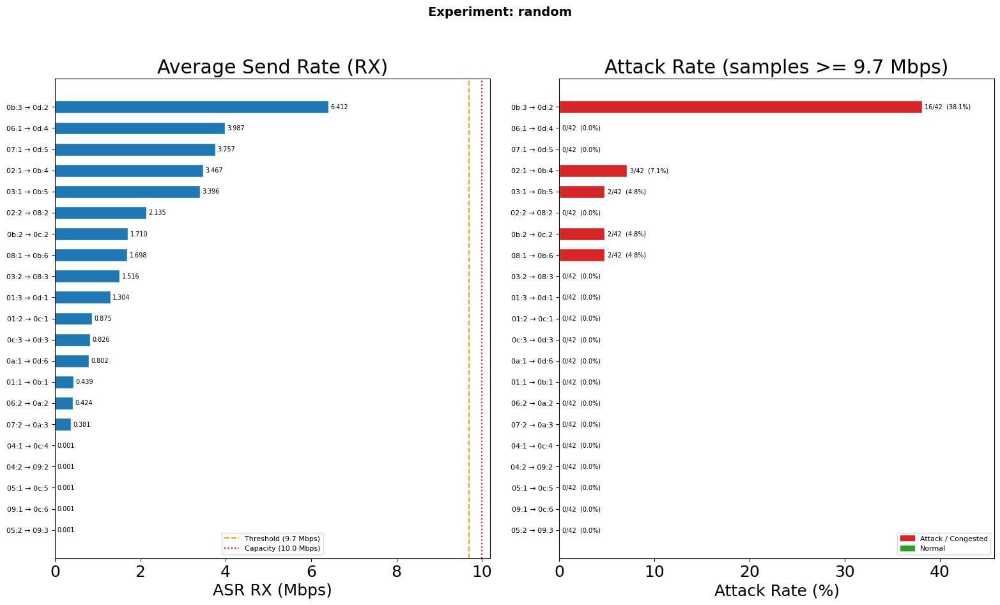

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/random/random_asr.png


Combined CSV saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/asr_results.csv


In [21]:
# ── Run ───────────────────────────────────────────────────────────────────
if not BASE_DIR.exists():
    print(f'[ERROR] Directory not found: {BASE_DIR}')
else:
    subfolders  = sorted([d for d in BASE_DIR.iterdir() if d.is_dir()])
    all_results = []

    for folder in subfolders:
        print(f'{'='*60}')
        print(f'  Folder: {folder.name}')

        all_csvs = sorted(folder.glob('*.csv'), key=file_index)
        for f in all_csvs:
            tag = '  x skip' if not is_clean(f) else '  + use '
            print(f'    {tag}  {f.name}')

        try:
            clean = get_clean_files(folder)
        except ValueError as e:
            print(f'  [SKIP] {e}\n'); continue

        print(f'  t_start -> {clean[0].name}')
        print(f'  t_end   -> {clean[-1].name}\n')

        try:
            asr_df    = calc_asr(clean[0], clean[-1])
            attack_df = calc_attack_rate(clean)
            merged    = asr_df.merge(attack_df, on='link_id', how='outer')
            merged.insert(0, 'experiment', folder.name)
            all_results.append(merged)

            # Print table
            print(merged[['link_id','ASR_rx_mbps','ASR_tx_mbps',
                           'times_crossed','total_samples','attack_rate_pct']].to_string(index=False))
            print()

            # Save image inside the folder
            plot_folder(folder.name, merged, folder)

        except Exception as e:
            print(f'  [ERROR] {e}\n')

    # Save combined CSV
    if all_results:
        combined = pd.concat(all_results, ignore_index=True)
        out_csv  = BASE_DIR / 'asr_results.csv'
        combined.to_csv(out_csv, index=False)
        print(f'\nCombined CSV saved → {out_csv}')

In [22]:
import re
import pandas as pd
from pathlib import Path

# ── Config ────────────────────────────────────────────────────────────────
ATTACK_THRESHOLD = 9.7
SKIP_KEYWORDS    = ['bad', 'not_useful', 'skip']

# Victim link = highest attack_rate_pct per experiment (auto-detected)
# Set to a fixed string to override, e.g.:
# FIXED_VICTIM = 'of:000000000000000b:3 -> of:000000000000000d:2'
FIXED_VICTIM = None

BASE_DIR = Path('.').resolve().parent / 'logs_generated' / 'ASR_link_stats_onos'

# ── Helpers ───────────────────────────────────────────────────────────────
def is_clean(path):
    return not any(kw in path.stem.lower() for kw in SKIP_KEYWORDS)

def file_index(path):
    m = re.match(r't(\d+)', path.name.lower())
    return int(m.group(1)) if m else 999

def get_clean_files(folder):
    csvs  = sorted(folder.glob('*.csv'), key=file_index)
    clean = [f for f in csvs if is_clean(f)]
    if len(clean) < 2:
        raise ValueError(f'Need >=2 clean files, found {len(clean)}')
    return clean

def load_all_samples(clean_files):
    df = pd.concat([pd.read_csv(f) for f in clean_files], ignore_index=True)
    return df.drop_duplicates(subset=['timestamp', 'link_id'])

def attack_rate_per_link(df):
    rows = []
    for link, grp in df.groupby('link_id'):
        total   = len(grp)
        crossed = int(((grp['rx_mbps'] >= ATTACK_THRESHOLD) |
                       (grp['tx_mbps'] >= ATTACK_THRESHOLD)).sum())
        rows.append({
            'link_id':         link,
            'total_samples':   total,
            'times_crossed':   crossed,
            'attack_rate_pct': round(crossed / total * 100, 4) if total else 0.0
        })
    return pd.DataFrame(rows)

# ── Main ──────────────────────────────────────────────────────────────────
results = []

subfolders = sorted([d for d in BASE_DIR.iterdir() if d.is_dir()])

for folder in subfolders:
    try:
        clean = get_clean_files(folder)
    except ValueError as e:
        print(f'[SKIP] {folder.name}: {e}')
        continue

    df    = load_all_samples(clean)
    rates = attack_rate_per_link(df)

    # Identify victim link
    if FIXED_VICTIM:
        victim_id = FIXED_VICTIM
    else:
        victim_id = rates.loc[rates['attack_rate_pct'].idxmax(), 'link_id']

    victim_row  = rates[rates['link_id'] == victim_id].iloc[0]
    other_links = rates[rates['link_id'] != victim_id].copy()

    # Average attack rate among all other links
    avg_rate_mean = other_links['attack_rate_pct'].mean()
    pooled_rate   = (other_links['times_crossed'].sum() /
                     other_links['total_samples'].sum() * 100)

    results.append({
        'experiment':                              folder.name,
        'victim_link':                             victim_id,
        'victim_attack_rate_pct':                  victim_row['attack_rate_pct'],
        'victim_times_crossed':                    victim_row['times_crossed'],
        'n_other_links':                           len(other_links),
        'other_links_avg_rate_pct (mean of rates)': round(avg_rate_mean, 4),
        'other_links_avg_rate_pct (pooled)':        round(pooled_rate,   4),
        'other_links_total_crossed':               int(other_links['times_crossed'].sum()),
        'other_links_total_samples':               int(other_links['total_samples'].sum()),
    })

    # Per-experiment print
    print(f"{'='*65}")
    print(f"  Experiment : {folder.name}")
    print(f"  Victim     : ...{victim_id[-30:]}")
    print(f"  Victim rate: {victim_row['attack_rate_pct']:.2f}%  "
          f"({int(victim_row['times_crossed'])}/{int(victim_row['total_samples'])} samples)")
    print()
    print(f"  Other links ({len(other_links)} total):")
    active = other_links[other_links['times_crossed'] > 0]
    if active.empty:
        print('    (no other links crossed the threshold)')
    else:
        for _, row in active.iterrows():
            print(f"    ...{row['link_id'][-30:]:30s}  "
                  f"{row['times_crossed']:2d}/{row['total_samples']:2d}  "
                  f"{row['attack_rate_pct']:6.2f}%")
    print()
    print(f"  Avg attack rate (other links):")
    print(f"    mean of per-link rates : {avg_rate_mean:.4f}%")
    print(f"    pooled (total crossed) : {pooled_rate:.4f}%")
    print()

# Summary table
summary = pd.DataFrame(results)
print('\n' + '='*65)
print('SUMMARY')
print('='*65)
print(summary[[
    'experiment',
    'victim_attack_rate_pct',
    'other_links_avg_rate_pct (mean of rates)',
    'other_links_avg_rate_pct (pooled)',
    'other_links_total_crossed',
    'other_links_total_samples'
]].to_string(index=False))

# Save
out = BASE_DIR / 'avg_attack_rate_summary.csv'
summary.to_csv(out, index=False)
print(f'\nSaved -> {out}')

  Experiment : jafarian
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 22.86%  (8/35 samples)

  Other links (20 total):
    (no other links crossed the threshold)

  Avg attack rate (other links):
    mean of per-link rates : 0.0000%
    pooled (total crossed) : 0.0000%

  Experiment : lfadefender
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 23.91%  (11/46 samples)

  Other links (20 total):
    ...00b:2 -> of:000000000000000c:2   8/46   17.39%

  Avg attack rate (other links):
    mean of per-link rates : 0.8696%
    pooled (total crossed) : 0.8696%

  Experiment : our method
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 6.25%  (5/80 samples)

  Other links (20 total):
    ...00c:3 -> of:000000000000000d:3   3/80    3.75%

  Avg attack rate (other links):
    mean of per-link rates : 0.1875%
    pooled (total crossed) : 0.1875%

  Experiment : random
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 38.10%  (16/42 sa

  Experiment : jafarian
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 22.86%  (8/35 samples)
  Other links: (none crossed the threshold)
  Avg other links (mean)  : 0.0000%
  Avg other links (pooled): 0.0000%



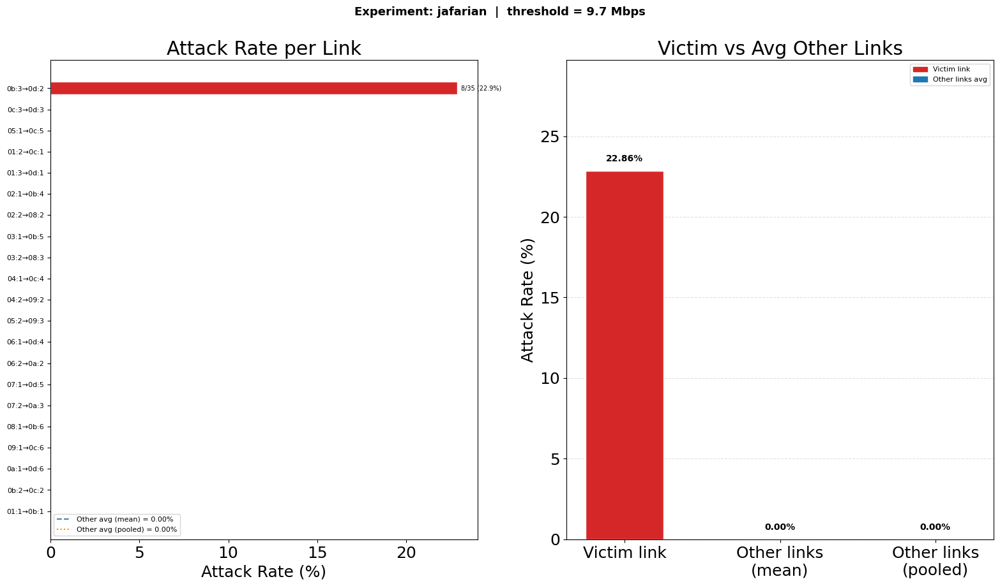

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/jafarian/jafarian_avg_attack_rate.png

  Experiment : lfadefender
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 23.91%  (11/46 samples)
    ...00b:2 -> of:000000000000000c:2   8/46   17.39%
  Avg other links (mean)  : 0.8696%
  Avg other links (pooled): 0.8696%



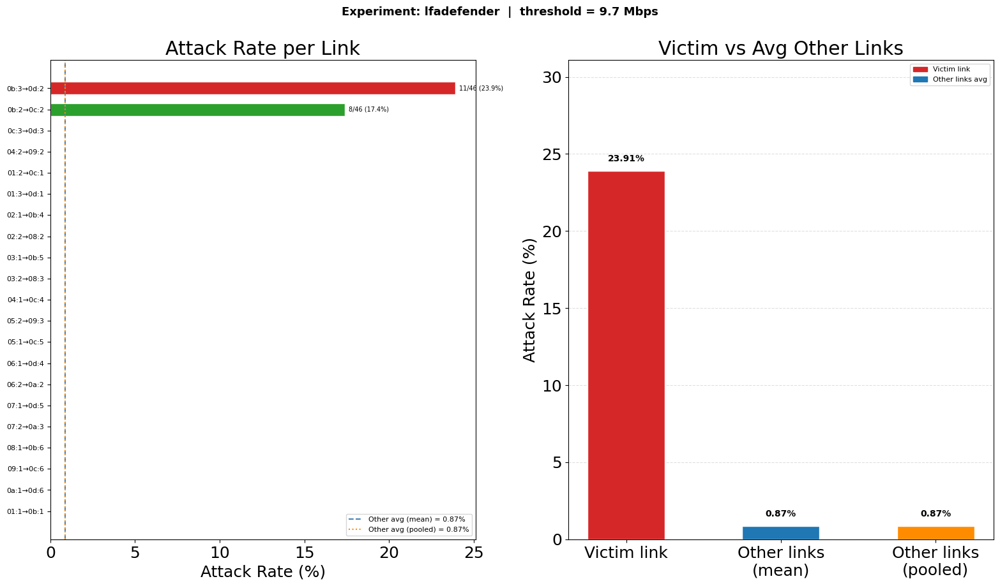

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/lfadefender/lfadefender_avg_attack_rate.png

  Experiment : our method
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 6.25%  (5/80 samples)
    ...00c:3 -> of:000000000000000d:3   3/80    3.75%
  Avg other links (mean)  : 0.1875%
  Avg other links (pooled): 0.1875%



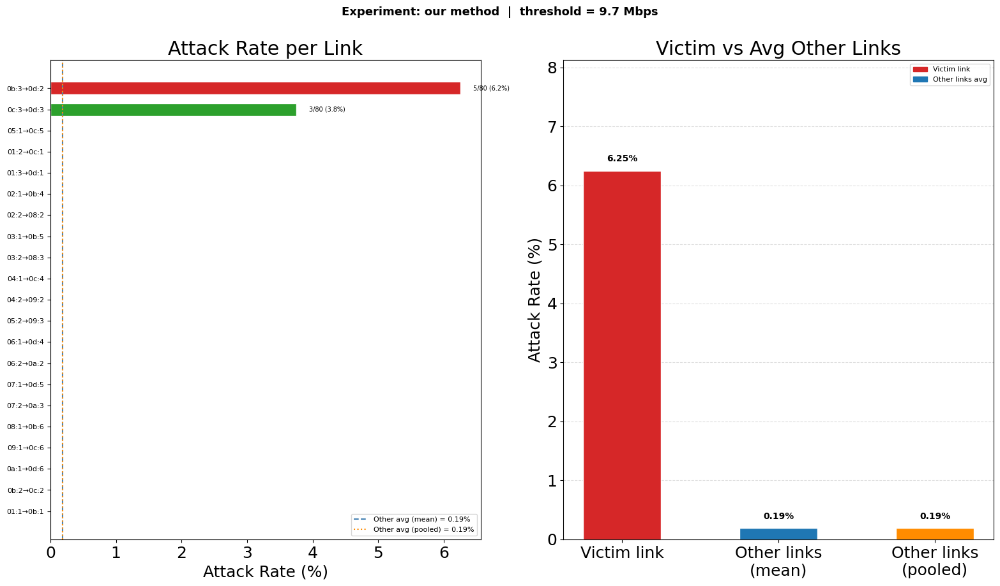

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/our method/our method_avg_attack_rate.png

  Experiment : random
  Victim     : ...00b:3 -> of:000000000000000d:2
  Victim rate: 38.10%  (16/42 samples)
    ...002:1 -> of:000000000000000b:4   3/42    7.14%
    ...003:1 -> of:000000000000000b:5   2/42    4.76%
    ...008:1 -> of:000000000000000b:6   2/42    4.76%
    ...00b:2 -> of:000000000000000c:2   2/42    4.76%
  Avg other links (mean)  : 1.0714%
  Avg other links (pooled): 1.0714%



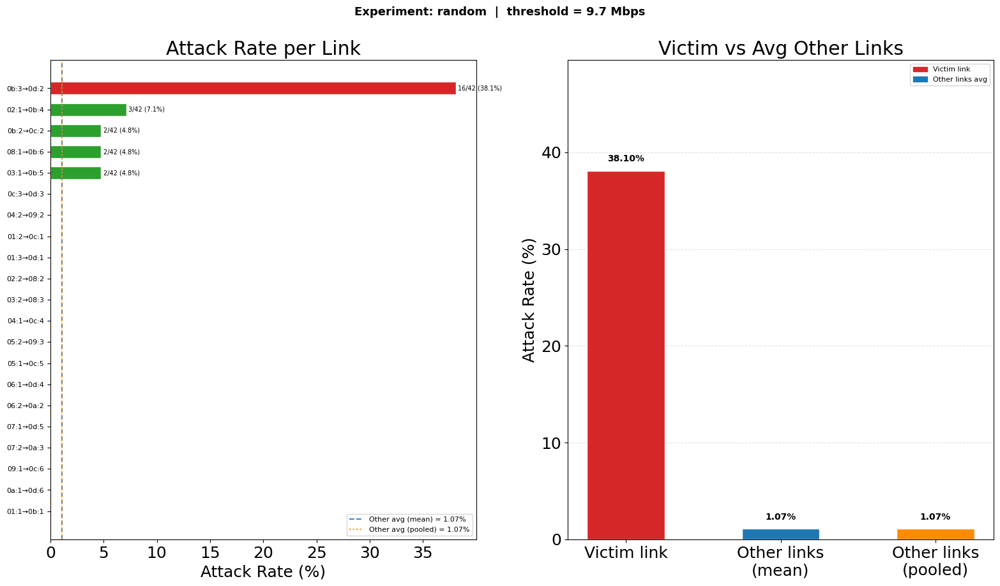

  Saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/random/random_avg_attack_rate.png


SUMMARY
 experiment  victim_attack_rate_pct  other_links_avg_rate_pct (mean of rates)  other_links_avg_rate_pct (pooled)  other_links_total_crossed  other_links_total_samples
   jafarian                 22.8571                                    0.0000                             0.0000                          0                        700
lfadefender                 23.9130                                    0.8696                             0.8696                          8                        920
 our method                  6.2500                                    0.1875                             0.1875                          3                       1600
     random                 38.0952                                    1.0714                             1.0714                          9                        840


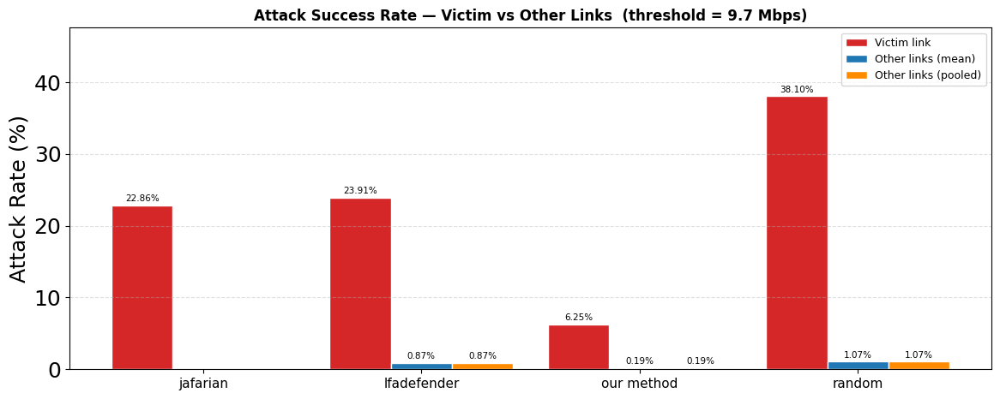

Summary plot saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/summary_avg_attack_rate.png

CSV saved → /home/vboxuser/Downloads/v2/data_collection_codes_/Main/logs_generated/ASR_link_stats_onos/avg_attack_rate_summary.csv


In [23]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from pathlib import Path

# ── Config ────────────────────────────────────────────────────────────────
ATTACK_THRESHOLD = 9.7
SKIP_KEYWORDS    = ['bad', 'not_useful', 'skip']
FIXED_VICTIM     = None   # None = auto-detect per experiment (highest attack_rate_pct)
                           # or set e.g. 'of:000000000000000b:3 -> of:000000000000000d:2'

BASE_DIR = Path('.').resolve().parent / 'logs_generated' / 'ASR_link_stats_onos'

# ── Helpers ───────────────────────────────────────────────────────────────
def is_clean(path):
    return not any(kw in path.stem.lower() for kw in SKIP_KEYWORDS)

def file_index(path):
    m = re.match(r't(\d+)', path.name.lower())
    return int(m.group(1)) if m else 999

def get_clean_files(folder):
    csvs  = sorted(folder.glob('*.csv'), key=file_index)
    clean = [f for f in csvs if is_clean(f)]
    if len(clean) < 2:
        raise ValueError(f'Need >=2 clean files, found {len(clean)}')
    return clean

def load_all_samples(clean_files):
    df = pd.concat([pd.read_csv(f) for f in clean_files], ignore_index=True)
    return df.drop_duplicates(subset=['timestamp', 'link_id'])

def attack_rate_per_link(df):
    rows = []
    for link, grp in df.groupby('link_id'):
        total   = len(grp)
        crossed = int(((grp['rx_mbps'] >= ATTACK_THRESHOLD) |
                       (grp['tx_mbps'] >= ATTACK_THRESHOLD)).sum())
        rows.append({
            'link_id':         link,
            'total_samples':   total,
            'times_crossed':   crossed,
            'attack_rate_pct': round(crossed / total * 100, 4) if total else 0.0
        })
    return pd.DataFrame(rows)

def short_link(link_id):
    parts = link_id.split(' -> ')
    def shorten(p):
        switch, port = p.rsplit(':', 1)
        return f'{switch[-2:]}:{port}'
    return f'{shorten(parts[0])}→{shorten(parts[1])}'

# ── Per-folder plot ───────────────────────────────────────────────────────
def plot_folder(folder_name, rates, victim_id, avg_mean, pooled, save_dir):
    df = rates.copy()
    df['label']      = df['link_id'].apply(short_link)
    df['is_victim']  = df['link_id'] == victim_id
    df = df.sort_values('attack_rate_pct', ascending=True)

    n      = len(df)
    y      = np.arange(n)
    height = max(5, n * 0.45)

    fig, axes = plt.subplots(1, 2, figsize=(16, height))
    fig.suptitle(f'Experiment: {folder_name}  |  threshold = {ATTACK_THRESHOLD} Mbps',
                 fontsize=13, fontweight='bold')

    # ── Left: attack rate per link ────────────────────────────────────────
    ax1 = axes[0]
    colors = ['#d62728' if v else '#2ca02c' for v in df['is_victim']]
    bars   = ax1.barh(y, df['attack_rate_pct'], color=colors, edgecolor='white', height=0.6)

    # avg lines for other links
    ax1.axvline(avg_mean, color='steelblue', linestyle='--', linewidth=1.5,
                label=f'Other avg (mean) = {avg_mean:.2f}%')
    ax1.axvline(pooled,   color='darkorange', linestyle=':',  linewidth=1.5,
                label=f'Other avg (pooled) = {pooled:.2f}%')

    ax1.set_yticks(y)
    ax1.set_yticklabels(df['label'], fontsize=8)
    ax1.set_xlabel('Attack Rate (%)')
    ax1.set_title('Attack Rate per Link')
    ax1.legend(fontsize=8)

    for bar, row in zip(bars, df.itertuples()):
        if row.attack_rate_pct > 0:
            ax1.text(bar.get_width() + 0.2,
                     bar.get_y() + bar.get_height() / 2,
                     f'{row.times_crossed}/{row.total_samples} ({row.attack_rate_pct:.1f}%)',
                     va='center', fontsize=7)

    # ── Right: victim vs avg other links summary ──────────────────────────
    ax2 = axes[1]
    categories  = ['Victim link', 'Other links\n(mean)', 'Other links\n(pooled)']
    values      = [rates[rates['link_id'] == victim_id]['attack_rate_pct'].values[0],
                   avg_mean, pooled]
    bar_colors  = ['#d62728', '#1f77b4', 'darkorange']

    bars2 = ax2.bar(categories, values, color=bar_colors, edgecolor='white',
                    width=0.5, zorder=3)
    ax2.set_ylabel('Attack Rate (%)')
    ax2.set_title('Victim vs Avg Other Links')
    ax2.grid(axis='y', linestyle='--', alpha=0.4, zorder=0)
    ax2.set_ylim(0, max(values) * 1.3 if max(values) > 0 else 5)

    for bar, val in zip(bars2, values):
        ax2.text(bar.get_x() + bar.get_width() / 2,
                 bar.get_height() + max(values) * 0.02,
                 f'{val:.2f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

    victim_patch = mpatches.Patch(color='#d62728', label='Victim link')
    other_patch  = mpatches.Patch(color='#1f77b4', label='Other links avg')
    ax2.legend(handles=[victim_patch, other_patch], fontsize=8)

    plt.tight_layout()
    out = save_dir / f'{folder_name}_avg_attack_rate.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'  Saved → {out}\n')

# ── Summary plot (all experiments side by side) ───────────────────────────
def plot_summary(summary_df, save_dir):
    experiments = summary_df['experiment'].tolist()
    victim_rates = summary_df['victim_attack_rate_pct'].tolist()
    other_mean   = summary_df['other_links_avg_rate_pct (mean of rates)'].tolist()
    other_pooled = summary_df['other_links_avg_rate_pct (pooled)'].tolist()

    x     = np.arange(len(experiments))
    width = 0.28

    fig, ax = plt.subplots(figsize=(12, 5))
    b1 = ax.bar(x - width,   victim_rates, width, label='Victim link',         color='#d62728', edgecolor='white')
    b2 = ax.bar(x,           other_mean,   width, label='Other links (mean)',   color='#1f77b4', edgecolor='white')
    b3 = ax.bar(x + width,   other_pooled, width, label='Other links (pooled)', color='darkorange', edgecolor='white')

    ax.set_xticks(x)
    ax.set_xticklabels(experiments, fontsize=11)
    ax.set_ylabel('Attack Rate (%)')
    ax.set_title(f'Attack Success Rate — Victim vs Other Links  (threshold = {ATTACK_THRESHOLD} Mbps)',
                 fontsize=12, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(axis='y', linestyle='--', alpha=0.4)
    ax.set_ylim(0, max(victim_rates) * 1.25)

    for bars in [b1, b2, b3]:
        for bar in bars:
            h = bar.get_height()
            if h > 0:
                ax.text(bar.get_x() + bar.get_width() / 2, h + 0.3,
                        f'{h:.2f}%', ha='center', va='bottom', fontsize=7.5)

    plt.tight_layout()
    out = save_dir / 'summary_avg_attack_rate.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Summary plot saved → {out}')

# ── Run ───────────────────────────────────────────────────────────────────
results    = []
subfolders = sorted([d for d in BASE_DIR.iterdir() if d.is_dir()])

for folder in subfolders:
    try:
        clean = get_clean_files(folder)
    except ValueError as e:
        print(f'[SKIP] {folder.name}: {e}')
        continue

    df    = load_all_samples(clean)
    rates = attack_rate_per_link(df)

    victim_id   = FIXED_VICTIM if FIXED_VICTIM else rates.loc[rates['attack_rate_pct'].idxmax(), 'link_id']
    victim_row  = rates[rates['link_id'] == victim_id].iloc[0]
    other_links = rates[rates['link_id'] != victim_id].copy()

    avg_mean   = other_links['attack_rate_pct'].mean()
    pooled     = (other_links['times_crossed'].sum() /
                  other_links['total_samples'].sum() * 100)

    results.append({
        'experiment':                               folder.name,
        'victim_link':                              victim_id,
        'victim_attack_rate_pct':                   victim_row['attack_rate_pct'],
        'victim_times_crossed':                     int(victim_row['times_crossed']),
        'n_other_links':                            len(other_links),
        'other_links_avg_rate_pct (mean of rates)': round(avg_mean, 4),
        'other_links_avg_rate_pct (pooled)':        round(pooled,   4),
        'other_links_total_crossed':                int(other_links['times_crossed'].sum()),
        'other_links_total_samples':                int(other_links['total_samples'].sum()),
    })

    # Print
    print(f"{'='*65}")
    print(f"  Experiment : {folder.name}")
    print(f"  Victim     : ...{victim_id[-30:]}")
    print(f"  Victim rate: {victim_row['attack_rate_pct']:.2f}%  "
          f"({int(victim_row['times_crossed'])}/{int(victim_row['total_samples'])} samples)")
    active = other_links[other_links['times_crossed'] > 0]
    if active.empty:
        print('  Other links: (none crossed the threshold)')
    else:
        for _, row in active.iterrows():
            print(f"    ...{row['link_id'][-30:]:30s}  "
                  f"{row['times_crossed']:2d}/{row['total_samples']:2d}  "
                  f"{row['attack_rate_pct']:6.2f}%")
    print(f"  Avg other links (mean)  : {avg_mean:.4f}%")
    print(f"  Avg other links (pooled): {pooled:.4f}%")
    print()

    # Per-folder plot saved inside the folder
    plot_folder(folder.name, rates, victim_id, avg_mean, pooled, folder)

# ── Summary ───────────────────────────────────────────────────────────────
summary = pd.DataFrame(results)

print('\n' + '='*65)
print('SUMMARY')
print('='*65)
print(summary[[
    'experiment',
    'victim_attack_rate_pct',
    'other_links_avg_rate_pct (mean of rates)',
    'other_links_avg_rate_pct (pooled)',
    'other_links_total_crossed',
    'other_links_total_samples'
]].to_string(index=False))

# Summary plot saved in BASE_DIR
plot_summary(summary, BASE_DIR)

# Save CSV
out_csv = BASE_DIR / 'avg_attack_rate_summary.csv'
summary.to_csv(out_csv, index=False)
print(f'\nCSV saved → {out_csv}')